In [556]:
import sys
sys.executable

'/Users/morilla/Python3/bin/python'

In [557]:
import numpy as np
np.random.seed(seed=42)
from gtda.homology import VietorisRipsPersistence
from gtda.homology import EuclideanCechPersistence
#from gtda.homology import CubicalPersistence

In [558]:
from gtda.plotting import plot_point_cloud
import matplotlib.pyplot as plt
from gtda.diagrams import PersistenceLandscape, Silhouette


In [559]:
import pandas as pd
M = pd.read_excel('./Base de donnees greffe pulmonaire_Ian.xlsx', index_col=0)

In [560]:
M

,NIP (identifiant),date de TP,Age,"Sexe (0=F, 1=M)",BMI (body mass index),BMI< ou egal 18,BMI>30,BMI>25,cardiopathie ischémique,diabètepré-opératoire,...,Sténose bronchique grave dans l'année (stent ou dilatation),Fistule bronchique dans l'année,rejet humoral dans l'année,rejet cellulaire dans l'année,pleurésie <1an,durée de séjour en réanimation (1er séjour),mortalité dans le premier séjour réanimation,mortalité à un an,mortalité à 90j,mortalité à J30
NOM,,,,,,,,,,,,,,,,,,,,,
Abdalla,8005805551,2015-03-31,52,0,26.0,0,0,1,0,1,...,0,0,0,0.0,0.0,56,0,0,0,0
ABDAT,8009205234,2017-12-28,63,1,18.0,1,0,0,0,0,...,0,0,0,0.0,0.0,12,0,0,0,0
AHMED,8004902968,2019-11-29,45,1,31.0,0,1,1,0,0,...,1,0,0,0.0,NaN,21,0,0,0,0
AIT ALI,8009284788,2018-11-27,56,0,28.0,0,0,1,0,0,...,1,1,0,0.0,0.0,51,0,0,0,0
ALAZARD,8004982944,2017-08-13,63,0,20.0,0,0,0,0,0,...,1,0,0,0.0,0.0,10,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
VISEUR,8006790644,2017-12-10,30,1,17.0,1,0,0,0,0,...,0,0,1,0.0,0.0,8,0,0,0,0
WEYRECH,8010392741,2018-09-01,60,1,30.3,0,1,1,0,0,...,0,0,0,1.0,0.0,13,0,0,0,0
Williez Dangauthier,8005651509,2015-09-08,69,0,16.0,1,0,0,0,0,...,0,0,0,1.0,0.0,7,0,0,0,0


In [561]:
M.shape

(252, 46)

In [562]:
M.columns

Index(['NIP (identifiant)', 'date de TP', 'Age', 'Sexe (0=F, 1=M)',
       'BMI (body mass index)', 'BMI< ou egal 18', 'BMI>30', 'BMI>25',
       'cardiopathie ischémique', 'diabètepré-opératoire',
       'PAPM (pression artérielle pulmonaire moyenne)', 'étiologie BPCO',
       'étiologie Fibrose', 'Autres étiologies', 'Mismatch CMV (R-/D+)',
       'ECMO pré-opératoire', 'Super Urgence',
       'type de TP (0=monopulmonaire, 1=bipulmonaire)', 'Ischémie Froide Max',
       'Analgésie péridurale ', 'ECMO peropératoire ',
       'Transfusion per opératoire >2 CGR', 'SOFA J0', 'IGS2 J0',
       'Nb Jours Noradrénaline ', 'Nb Jours Ventilation mécanique',
       'ECMO en Réanimation', 'Nb jours d'ECMO en réanimation',
       'Dysfonction primaire du greffon grade 3 ', 'insuffisance rénale aiguë',
       'dialyse en réanimation', 'bactériémie', 'Pneumonie (tous germes)',
       'Pneumonie à BLSE et/ou Pyo en réanimation',
       'Pneumonie acquise sous ventilation mécanique à BLSE et/ou Pyo

In [563]:
M.columns = M.columns.str.replace(' ','_')

In [564]:
M.columns

Index(['NIP_(identifiant)', 'date_de_TP', 'Age', 'Sexe_(0=F,_1=M)',
       'BMI_(body_mass_index)', 'BMI<_ou_egal_18', 'BMI>30', 'BMI>25',
       'cardiopathie_ischémique', 'diabètepré-opératoire',
       'PAPM_(pression_artérielle_pulmonaire_moyenne)', 'étiologie_BPCO',
       'étiologie_Fibrose', 'Autres_étiologies', 'Mismatch_CMV_(R-/D+)',
       'ECMO_pré-opératoire', 'Super_Urgence',
       'type_de_TP_(0=monopulmonaire,_1=bipulmonaire)', 'Ischémie_Froide_Max',
       'Analgésie_péridurale_', 'ECMO_peropératoire_',
       'Transfusion_per_opératoire_>2_CGR', 'SOFA_J0', 'IGS2_J0',
       'Nb_Jours_Noradrénaline_', 'Nb_Jours_Ventilation_mécanique',
       'ECMO_en_Réanimation', 'Nb_jours_d'ECMO_en_réanimation',
       'Dysfonction_primaire_du_greffon_grade_3_', 'insuffisance_rénale_aiguë',
       'dialyse_en_réanimation', 'bactériémie', 'Pneumonie_(tous_germes)',
       'Pneumonie_à_BLSE_et/ou_Pyo_en_réanimation',
       'Pneumonie_acquise_sous_ventilation_mécanique_à_BLSE_et/ou_Pyo

In [565]:
y = M.mortalité_à_un_an

In [566]:
y

NOM
Abdalla                0
ABDAT                  0
AHMED                  0
AIT ALI                0
ALAZARD                0
                      ..
VISEUR                 0
WEYRECH                0
Williez Dangauthier    0
Yahiaoui               0
YEBBOU                 0
Name: mortalité_à_un_an, Length: 252, dtype: int64

In [12]:
from sklearn.preprocessing import StandardScaler

In [13]:
from sklearn.preprocessing import StandardScaler
df = M.drop(['NIP_(identifiant)', 'date_de_TP'], axis=1)
df_standard_scale=pd.DataFrame(StandardScaler().fit_transform(df))

In [14]:
#df=df.dropna()
#df=df.reset_index()

In [15]:
df_standard_scale.columns

RangeIndex(start=0, stop=44, step=1)

In [16]:
where_are_NaNs = np.isnan(df_standard_scale)
df_standard_scale[where_are_NaNs] = 0
df_standard_scale.head()

,0,1,2,3,4,5,6,7,8,9,...,34,35,36,37,38,39,40,41,42,43
0,-0.204075,-1.330124,0.459695,-0.394922,-0.367607,1.091469,-0.213643,2.886751,0.000000,-0.745356,...,-0.577350,-0.421391,-0.491304,-0.566615,-0.426401,1.042439,-0.434372,-0.57735,-0.434372,-0.309277
1,0.795388,0.751809,-1.263521,2.532146,-0.367607,-0.916197,-0.213643,-0.346410,0.425519,1.341641,...,-0.577350,-0.421391,-0.491304,-0.566615,-0.426401,-0.528232,-0.434372,-0.57735,-0.434372,-0.309277
2,-0.840097,0.751809,1.536705,-0.394922,2.720294,1.091469,-0.213643,-0.346410,-0.093490,-0.745356,...,1.732051,-0.421391,-0.491304,-0.566615,0.000000,-0.206958,-0.434372,-0.57735,-0.434372,-0.309277
3,0.159366,-1.330124,0.890499,-0.394922,-0.367607,1.091469,-0.213643,-0.346410,-1.261259,-0.745356,...,1.732051,2.373095,-0.491304,-0.566615,-0.426401,0.863954,-0.434372,-0.57735,-0.434372,-0.309277
4,0.795388,-1.330124,-0.832717,-0.394922,-0.367607,-0.916197,-0.213643,-0.346410,-1.261259,-0.745356,...,1.732051,-0.421391,-0.491304,-0.566615,-0.426401,-0.599626,-0.434372,-0.57735,-0.434372,-0.309277


In [17]:
df_standard_scale.index = df.index
df_standard_scale.columns = df.columns

In [18]:
df_standard_scale.head()

,Age,"Sexe_(0=F,_1=M)",BMI_(body_mass_index),BMI<_ou_egal_18,BMI>30,BMI>25,cardiopathie_ischémique,diabètepré-opératoire,PAPM_(pression_artérielle_pulmonaire_moyenne),étiologie_BPCO,...,Sténose_bronchique_grave_dans_l'année_(stent_ou_dilatation),Fistule_bronchique_dans_l'année,rejet_humoral_dans_l'année,rejet_cellulaire_dans_l'année_,pleurésie_<1an,durée_de_séjour_en_réanimation_(1er_séjour),mortalité_dans_le_premier_séjour_réanimation,mortalité_à_un_an,mortalité_à_90j,mortalité_à_J30
NOM,,,,,,,,,,,,,,,,,,,,,
Abdalla,-0.204075,-1.330124,0.459695,-0.394922,-0.367607,1.091469,-0.213643,2.886751,0.000000,-0.745356,...,-0.577350,-0.421391,-0.491304,-0.566615,-0.426401,1.042439,-0.434372,-0.57735,-0.434372,-0.309277
ABDAT,0.795388,0.751809,-1.263521,2.532146,-0.367607,-0.916197,-0.213643,-0.346410,0.425519,1.341641,...,-0.577350,-0.421391,-0.491304,-0.566615,-0.426401,-0.528232,-0.434372,-0.57735,-0.434372,-0.309277
AHMED,-0.840097,0.751809,1.536705,-0.394922,2.720294,1.091469,-0.213643,-0.346410,-0.093490,-0.745356,...,1.732051,-0.421391,-0.491304,-0.566615,0.000000,-0.206958,-0.434372,-0.57735,-0.434372,-0.309277
AIT ALI,0.159366,-1.330124,0.890499,-0.394922,-0.367607,1.091469,-0.213643,-0.346410,-1.261259,-0.745356,...,1.732051,2.373095,-0.491304,-0.566615,-0.426401,0.863954,-0.434372,-0.57735,-0.434372,-0.309277
ALAZARD,0.795388,-1.330124,-0.832717,-0.394922,-0.367607,-0.916197,-0.213643,-0.346410,-1.261259,-0.745356,...,1.732051,-0.421391,-0.491304,-0.566615,-0.426401,-0.599626,-0.434372,-0.57735,-0.434372,-0.309277


In [19]:
M2 = pd.read_excel('./Base de donnees greffe pulmonaire_Ian_Samy.xlsx', index_col=0)

/Users/morilla/Python3/lib/python3.7/site-packages/openpyxl/worksheet/_reader.py:312: UserWarning: Unknown extension is not supported and will be removed
  warn(msg)


In [20]:
M2.columns = ["NIP (ID)", "Date of TP", "Age", "Age >= 60", "Sex (0=F, 1=M)", "BMI (body mass index)", "BMI < 18", 
              "BMI > 30", "BMI > 25", "Ischemic heart disease", "Pre-operative diabetes", 
              "PAPM (mean pulmonary arterial pressure)", "PAPM > 20", "Etiology BPCO", "Patient_XXX", 
              "Other etiologies", "CMV Mismatch", "Pre-operative ECMO", "Patient_XXX", 
              "Type of TP (0=single lung, 1=double lung)", "Patient_XXX Ischemia", "Patient_XXX Ischemia > 6h", 
              "Patient_XXX", "Perioperative ECMO", "Patient_XXX > 2 U", "SOFA Day 0", 
              "SOFA >= 7", "IGS2 Day 0", "IGS2 >= 43", "# Patient_XXX", "# Patient_XXX >= 2", 
              "# Patient_XXX Ventilation", "# Patient_XXX Ventilation >= 3", "ECMO in ICU", 
              "# Days ECMO in ICU", "# Days ECMO in ICU >= 1", "Patient_XXX Dysfunction grade 3", 
              "Patient_XXX Failure", "Dialysis in ICU", "Bacteremia", "Pneumonia (all germs)", 
              "Pneumonia with BLSE and/or abscess in ICU", "Tracheotomy", 
              "Severe bronchial stenosis in past year (stent or dilation)", "Bronchial fistula in past year", 
              "Humoral rejection in past year", "Cellular rejection in past year", "Pleurisy < 1 year", 
              "ICU stay duration", "ICU stay duration >= 15 days", "Mortality in first ICU stay", 
              "1-year mortality", "Mortality at Day 90", "Mortality at Day 30"]

In [21]:
new_text = []
for item in M2.columns:
    if ">" in item or "<" in item or " (" in item or ") " in item or "# " in item:
        new_text.append(item.replace(" ", ""))
    else:
        new_text.append(item.replace(" ", "_"))

print(new_text)

['NIP(ID)', 'Date_of_TP', 'Age', 'Age>=60', 'Sex(0=F,1=M)', 'BMI(bodymassindex)', 'BMI<18', 'BMI>30', 'BMI>25', 'Ischemic_heart_disease', 'Pre-operative_diabetes', 'PAPM(meanpulmonaryarterialpressure)', 'PAPM>20', 'Etiology_BPCO', 'Etiology_Fibrosis', 'Other_etiologies', 'CMV_Mismatch', 'Pre-operative_ECMO', 'Super_Urgency', 'TypeofTP(0=singlelung,1=doublelung)', 'Max_Cold_Ischemia', 'MaxColdIschemia>6h', 'Peridural_Analgesia', 'Perioperative_ECMO', 'PeroperativeTransfusion>2U', 'SOFA_Day_0', 'SOFA>=7', 'IGS2_Day_0', 'IGS2>=43', '#DaysNoradrenaline', '#DaysNoradrenaline>=2', '#DaysMechanicalVentilation', '#DaysMechanicalVentilation>=3', 'ECMO_in_ICU', '#DaysECMOinICU', '#DaysECMOinICU>=1', 'Primary_Graft_Dysfunction_grade_3', 'Acute_Renal_Failure', 'Dialysis_in_ICU', 'Bacteremia', 'Pneumonia(allgerms)', 'Pneumonia_with_BLSE_and/or_abscess_in_ICU', 'Tracheotomy', 'Severebronchialstenosisinpastyear(stentordilation)', 'Bronchial_fistula_in_past_year', 'Humoral_rejection_in_past_year', 'Ce

In [22]:
new_text = ['NIP(ID)', 'Date_of_TP', 'Age', 'Age$\geq$60', 'Sex(0=F,1=M)', 'BMI(body_mass_index)', 'BMI$<$18', 'BMI$>$30', 
'BMI$>$25', 'Ischemic_heart_disease', 'Pre-operative_diabetes', 'PAPM(mean_pulmonary_arterial_pressure)', 'PAPM$>$20', 
'Etiology_BPCO', 'Etiology_Fibrosis', 'Other_etiologies', 'CMV_Mismatch', 'Pre-operative_ECMO', 'Super_Urgency', 
'Type_of_TP(0=single_lung,1=double_lung)', 'Max_Cold_Ischemia', 'Max_Cold_Ischemia$>$6h', 'Peridural_Analgesia', 
'Perioperative_ECMO', 'Peroperative_Transfusion$>$2U', 'SOFA_Day_0', 'SOFA$\geq$7', 'IGS2_Day_0', 'IGS2$\geq$43', 
'\#Days_Noradrenaline', '\#Days_Noradrenaline$\geq$2', '\#Days_Mechanical_Ventilation', '\#Days_Mechanical_Ventilation$\geq$3', 
'ECMO_in_ICU', '\#Days_ECMO_in_ICU', '\#Days_ECMO_in_ICU$\geq$1', 'Primary_Graft_Dysfunction_grade_3', 'Acute_Renal_Failure', 
'Dialysis_in_ICU', 'Bacteremia', 'Pneumonia(all_germs)', 'Pneumonia_with_BLSE_and/or_abscess_in_ICU', 'Tracheotomy', 
'Severe_bronchial_stenosis_in_past_year(stent_or_dilation)', 'Bronchial_fistula_in_past_year', 
'Humoral_rejection_in_past_year', 'Cellular_rejection_in_past_year', 'Pleurisy$<$1year', 'ICU_stay_duration', 
'ICU_stay_duration$\geq$15days', 'Mortality_in_first_ICU_stay', 'one_year_mortality', 'Mortality_at_Day_90', 
'Mortality_at_Day_30']

In [23]:
#M2.columns = M2.columns.str.strip()
#M2.columns = M2.columns.str.replace(' ','_')
M2.columns = new_text
M2

,NIP(ID),Date_of_TP,Age,Age$\geq$60,"Sex(0=F,1=M)",BMI(body_mass_index),BMI$<$18,BMI$>$30,BMI$>$25,Ischemic_heart_disease,...,Bronchial_fistula_in_past_year,Humoral_rejection_in_past_year,Cellular_rejection_in_past_year,Pleurisy$<$1year,ICU_stay_duration,ICU_stay_duration$\geq$15days,Mortality_in_first_ICU_stay,one_year_mortality,Mortality_at_Day_90,Mortality_at_Day_30
NOM,,,,,,,,,,,,,,,,,,,,,
Abdalla,8005805551,2015-03-31,52,0,0,26.0,0,0,1,0,...,0,0,0.0,0.0,56,1,0,0,0,0
ABDAT,8009205234,2017-12-28,63,1,1,18.0,1,0,0,0,...,0,0,0.0,0.0,12,0,0,0,0,0
AHMED,8004902968,2019-11-29,45,0,1,31.0,0,1,1,0,...,0,0,0.0,NaN,21,1,0,0,0,0
AIT ALI,8009284788,2018-11-27,56,0,0,28.0,0,0,1,0,...,1,0,0.0,0.0,51,1,0,0,0,0
ALAZARD,8004982944,2017-08-13,63,1,0,20.0,0,0,0,0,...,0,0,0.0,0.0,10,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
VISEUR,8006790644,2017-12-10,30,0,1,17.0,1,0,0,0,...,0,1,0.0,0.0,8,0,0,0,0,0
WEYRECH,8010392741,2018-09-01,60,1,1,30.3,0,1,1,0,...,0,0,1.0,0.0,13,0,0,0,0,0
Williez Dangauthier,8005651509,2015-09-08,69,1,0,16.0,1,0,0,0,...,0,0,1.0,0.0,7,0,0,0,0,0


In [24]:
M2.columns

Index(['NIP(ID)', 'Date_of_TP', 'Age', 'Age$\geq$60', 'Sex(0=F,1=M)',
       'BMI(body_mass_index)', 'BMI$<$18', 'BMI$>$30', 'BMI$>$25',
       'Ischemic_heart_disease', 'Pre-operative_diabetes',
       'PAPM(mean_pulmonary_arterial_pressure)', 'PAPM$>$20', 'Etiology_BPCO',
       'Etiology_Fibrosis', 'Other_etiologies', 'CMV_Mismatch',
       'Pre-operative_ECMO', 'Super_Urgency',
       'Type_of_TP(0=single_lung,1=double_lung)', 'Max_Cold_Ischemia',
       'Max_Cold_Ischemia$>$6h', 'Peridural_Analgesia', 'Perioperative_ECMO',
       'Peroperative_Transfusion$>$2U', 'SOFA_Day_0', 'SOFA$\geq$7',
       'IGS2_Day_0', 'IGS2$\geq$43', '\#Days_Noradrenaline',
       '\#Days_Noradrenaline$\geq$2', '\#Days_Mechanical_Ventilation',
       '\#Days_Mechanical_Ventilation$\geq$3', 'ECMO_in_ICU',
       '\#Days_ECMO_in_ICU', '\#Days_ECMO_in_ICU$\geq$1',
       'Primary_Graft_Dysfunction_grade_3', 'Acute_Renal_Failure',
       'Dialysis_in_ICU', 'Bacteremia', 'Pneumonia(all_germs)',
       'Pneumo

In [25]:
y2 = M2.one_year_mortality
y2

NOM
Abdalla                0
ABDAT                  0
AHMED                  0
AIT ALI                0
ALAZARD                0
                      ..
VISEUR                 0
WEYRECH                0
Williez Dangauthier    0
Yahiaoui               0
YEBBOU                 0
Name: one_year_mortality, Length: 252, dtype: int64

In [40]:
# Index - 0 and 1
from gtda.plotting import plot_diagram #, plot_heatmap, plot_betti_surfaces
import plotly.io as pio

index_0 = 47
fig = plot_diagram(persistence_diagrams[index_0], plotly_params={"traces": {"line": {"width": 2}, "marker":{"size":10}}})
pio.write_image(fig, 'diag_persis_survivor_47.pdf', format='pdf', scale=3)

In [41]:
# Index - 0 and 1
from gtda.plotting import plot_diagram #, plot_heatmap, plot_betti_surfaces
index_1 = 250
fig2 = plot_diagram(persistence_diagrams[index_1], plotly_params={"traces": {"line": {"width": 2}, "marker":{"size":10}}})
pio.write_image(fig2, 'diag_persis_non_survivor_250.pdf', format='pdf', scale=3)

In [42]:
import gudhi as gd
from pylab import *
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import Image
from matplotlib.widgets import Slider, Button, RadioButtons
%matplotlib inline

<AxesSubplot:title={'center':'Persistence density'}, xlabel='Birth', ylabel='Death'>

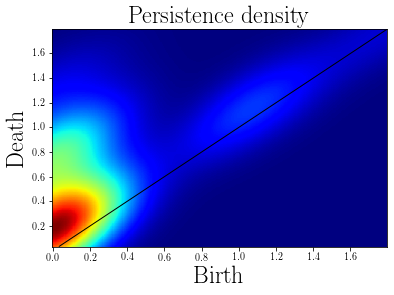

In [43]:
gd.plot_persistence_density(persistence=persistence_diagrams[index_0], cmap='jet', fontsize=24)
#plt.savefig('persistence_density_Y1_survivor_pat47.png', dpi=300, bbox_inches='tight')

In [44]:
help(gd.plot_persistence_density)

Help on function plot_persistence_density in module gudhi.persistence_graphical_tools:

plot_persistence_density(persistence=[], persistence_file='', nbins=300, bw_method=None, max_intervals=1000, dimension=None, cmap=None, legend=False, axes=None, fontsize=16, greyblock=False)
    This function plots the persistence density from persistence
    values list, np.array of shape (N x 2) representing a diagram
    in a single homology dimension,
    or from a `persistence diagram <fileformats.html#persistence-diagram>`_ file.
    Be aware that this function does not distinguish the dimension, it is
    up to you to select the required one. This function also does not handle
    degenerate data set (scipy correlation matrix inversion can fail).
    
    :Requires: `SciPy <installation.html#scipy>`_
    
    :param persistence: Persistence intervals values list. 
                        Can be grouped by dimension or not.
    :type persistence: an array of (dimension, array of (birth, death)

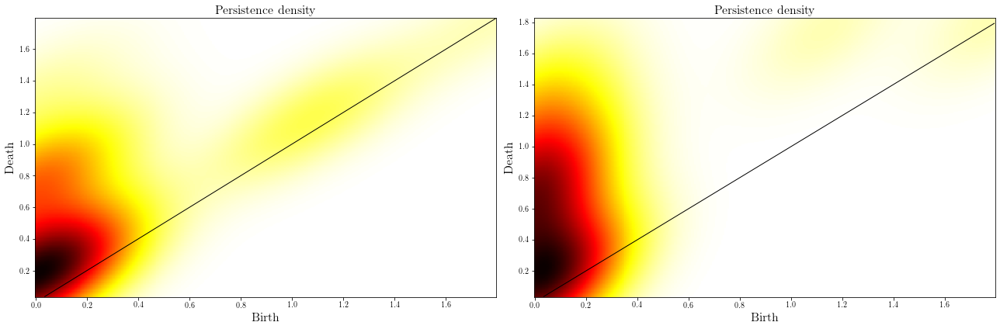

In [45]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(18, 6))
gd.plot_persistence_density(persistence=persistence_diagrams[index_0],axes=axes[0])
gd.plot_persistence_density(persistence=persistence_diagrams[index_1],axes=axes[1])
plt.tight_layout()
#plt.show()
plt.savefig('persistence_density_Y1_survivor_nonsurvivor.png', bbox_inches='tight')
plt.show()

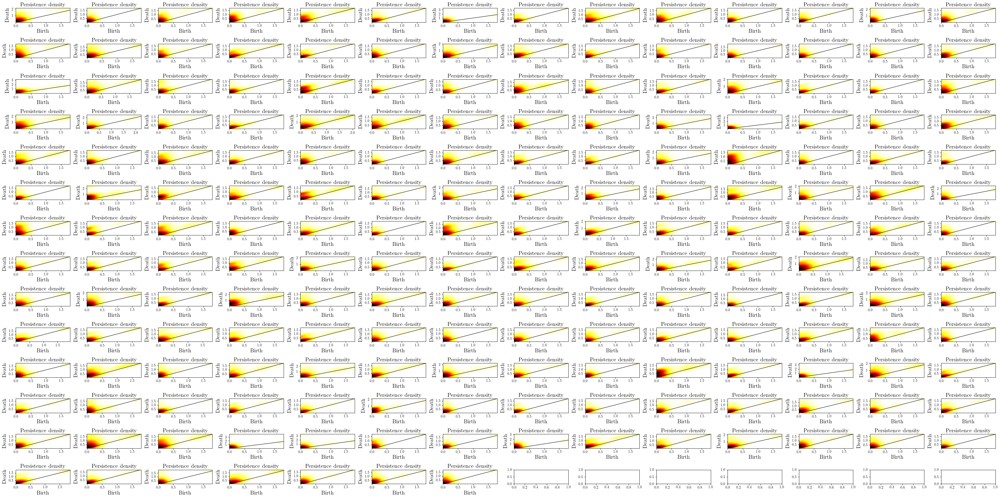

In [45]:
#Full-length
ax = tuple(['ax'+str(x) for x in range(189)])
    
fig, ax = plt.subplots(14,14, figsize=(40, 20))

for i in range(189):
        gd.plot_persistence_density(persistence=persistence_diagrams[i], axes=ax.flatten()[i])
        #plt.title("PI of $H_1$ for Y1 survivor" + str(i))

#plt.axis('off')        
plt.tight_layout()
#plt.show()
plt.savefig('persistence_density_Y1_survivor_full.png', bbox_inches='tight')

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/gudhi/persistence_graphical_tools.py:510: MatplotlibDeprecationWarning:

shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/gudhi/persistence_graphical_tools.py:510: MatplotlibDeprecationWarning:

shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/gudhi/persistence_graphical_tools.py:510: Matplotlib

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/gudhi/persistence_graphical_tools.py:510: MatplotlibDeprecationWarning:

shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.



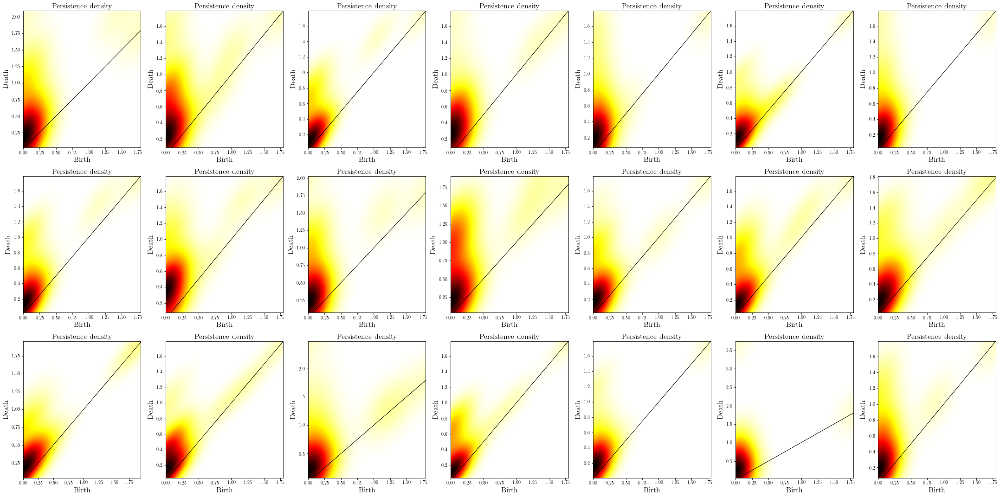

In [370]:
#Y1 survivor
ax = tuple(['ax'+str(x) for x in range(21)])
    
fig, ax = plt.subplots(3,7, figsize=(30, 15))

subsample = persistence_diagrams[0:189:9] 

for i in range(len(subsample)):
        gd.plot_persistence_density(persistence=subsample[i], axes=ax.flatten()[i])
        #plt.title("PI of $H_1$ for Y1 survivor" + str(i))

#plt.axis('off')        
plt.tight_layout()
#plt.show()
plt.savefig('persistence_density_Y1_survivor.png', bbox_inches='tight')

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/gudhi/persistence_graphical_tools.py:510: MatplotlibDeprecationWarning:

shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/gudhi/persistence_graphical_tools.py:510: MatplotlibDeprecationWarning:

shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/gudhi/persistence_graphical_tools.py:510: Matplotlib

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/gudhi/persistence_graphical_tools.py:510: MatplotlibDeprecationWarning:

shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/gudhi/persistence_graphical_tools.py:510: MatplotlibDeprecationWarning:

shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/gudhi/persistence_graphical_tools.py:510: Matplotlib

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/gudhi/persistence_graphical_tools.py:510: MatplotlibDeprecationWarning:

shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/gudhi/persistence_graphical_tools.py:510: MatplotlibDeprecationWarning:

shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/gudhi/persistence_graphical_tools.py:510: Matplotlib

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/gudhi/persistence_graphical_tools.py:510: MatplotlibDeprecationWarning:

shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/gudhi/persistence_graphical_tools.py:510: MatplotlibDeprecationWarning:

shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.



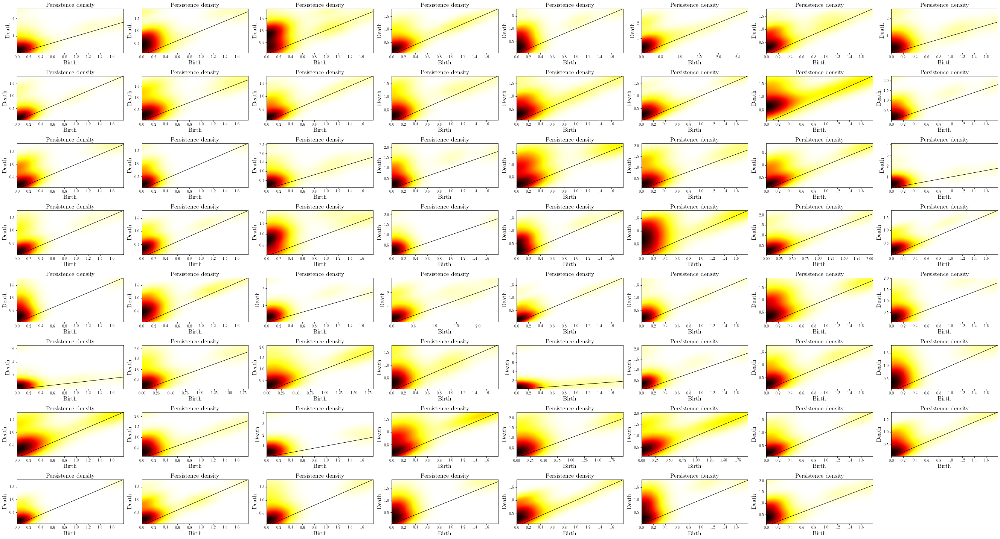

In [371]:
#Y1 Non-survivor
ax = tuple(['ax'+str(x) for x in range(63)])
    
fig, ax = plt.subplots(8,8, figsize=(37, 20))

for i in range(63):
    gd.plot_persistence_density(persistence=persistence_diagrams[189+i], axes=ax.flatten()[i])
    #plt.title("PI of $H_1$ for Y1 survivor" + str(i))

plt.axis('off')    
plt.tight_layout()
#plt.show()
plt.savefig('Persistence_density_Y1_non_survivor.png', bbox_inches='tight')

Text(0.5, 1.0, 'Persistence Image')

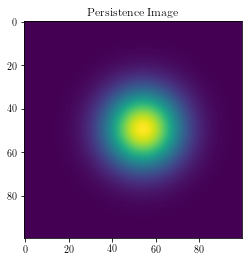

In [50]:
plt.imshow(np.flip(np.reshape(pi2[67], [100,100]), 0))
plt.title("Patient_XXX")

In [42]:
persistence_diagrams[:,:,:-1]

array([[[0.        , 0.02680994],
        [0.        , 0.03499579],
        [0.        , 0.07041855],
        ...,
        [0.10177389, 0.10177389],
        [0.10177389, 0.10177389],
        [1.79327548, 1.79327548]],

       [[0.        , 0.0392024 ],
        [0.        , 0.04737386],
        [0.        , 0.07736459],
        ...,
        [0.10177389, 0.10177389],
        [0.10177389, 0.10177389],
        [1.79327548, 1.79327548]],

       [[0.        , 0.09228391],
        [0.        , 0.09847613],
        [0.        , 0.09950761],
        ...,
        [0.10177389, 0.10177389],
        [0.10177389, 0.10177389],
        [1.79327548, 1.79327548]],

       ...,

       [[0.        , 0.1264966 ],
        [0.        , 0.15257303],
        [0.        , 0.15931652],
        ...,
        [0.10177389, 0.10177389],
        [0.10177389, 0.10177389],
        [1.79327548, 1.79327548]],

       [[0.        , 0.03499579],
        [0.        , 0.07041855],
        [0.        , 0.1264966 ],
        .

In [46]:
import argparse
import collections
import itertools
import glob
import os

import matplotlib.pyplot as plt

from persim import PersImage

#from topology import load_persistence_diagram_json

#from utilities import parse_filename

#from tqdm import tqdm


def embed(subject, diagrams, suffix):
    pairs = list(itertools.chain.from_iterable(diagrams))

    clf = PersImage(pixels=(50,50),specs={"maxBD":5, "minBD":-2})#, spread=1.0)
    img = clf.transform(pairs)

    path = f'../results/persistence_images_mean_s1.0/{suffix}'

    plt.imshow(img, cmap='Spectral')

    # Create output directories for storing *all* subjects in. This
    # depends on the input file.
    os.makedirs(path, exist_ok=True)
    plt.savefig(os.path.join(path, f'{subject}.png'))



/Users/morilla/Python3/lib/python3.7/site-packages/ipykernel_launcher.py:21: DeprecationWarning:

Call to deprecated class PersImage. (Replaced with the class `persim.PersistenceImager`.) -- Deprecated since version 0.1.5.



PersImage(pixels=(50, 50), spread=None, specs={'maxBD': 5, 'minBD': -2}, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(50, 50), spread=None, specs={'maxBD': 5, 'minBD': -2}, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(50, 50), spread=None, specs={'maxBD': 5, 'minBD': -2}, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(50, 50), spread=None, specs={'maxBD': 5, 'minBD': -2}, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(50, 50), spread=None, specs={'maxBD': 5, 'minBD': -2}, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(50, 50), spread=None, specs={'maxBD': 5, 'minBD': -2}, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(50, 50), spread=None, specs={'maxBD': 5, 'minBD': -2}, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(50, 50), spread=None, specs={'maxBD': 5, 'minBD': -2}, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(50, 50

PersImage(pixels=(50, 50), spread=None, specs={'maxBD': 5, 'minBD': -2}, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(50, 50), spread=None, specs={'maxBD': 5, 'minBD': -2}, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(50, 50), spread=None, specs={'maxBD': 5, 'minBD': -2}, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(50, 50), spread=None, specs={'maxBD': 5, 'minBD': -2}, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(50, 50), spread=None, specs={'maxBD': 5, 'minBD': -2}, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(50, 50), spread=None, specs={'maxBD': 5, 'minBD': -2}, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(50, 50), spread=None, specs={'maxBD': 5, 'minBD': -2}, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(50, 50), spread=None, specs={'maxBD': 5, 'minBD': -2}, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(50, 50

PersImage(pixels=(50, 50), spread=None, specs={'maxBD': 5, 'minBD': -2}, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(50, 50), spread=None, specs={'maxBD': 5, 'minBD': -2}, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(50, 50), spread=None, specs={'maxBD': 5, 'minBD': -2}, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(50, 50), spread=None, specs={'maxBD': 5, 'minBD': -2}, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(50, 50), spread=None, specs={'maxBD': 5, 'minBD': -2}, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(50, 50), spread=None, specs={'maxBD': 5, 'minBD': -2}, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(50, 50), spread=None, specs={'maxBD': 5, 'minBD': -2}, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(50, 50), spread=None, specs={'maxBD': 5, 'minBD': -2}, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(50, 50

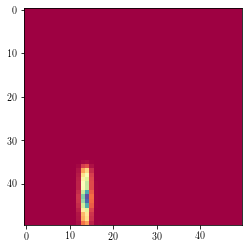

In [47]:
#persistence images of Y1 survivors
for i in range(1,190):
    embed(subject0.values[i-1:i][0], persistence_diagrams[i-1:i,:,:-1],'survivor')

/Users/morilla/Python3/lib/python3.7/site-packages/ipykernel_launcher.py:21: DeprecationWarning:

Call to deprecated class PersImage. (Replaced with the class `persim.PersistenceImager`.) -- Deprecated since version 0.1.5.



PersImage(pixels=(50, 50), spread=None, specs={'maxBD': 5, 'minBD': -2}, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(50, 50), spread=None, specs={'maxBD': 5, 'minBD': -2}, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(50, 50), spread=None, specs={'maxBD': 5, 'minBD': -2}, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(50, 50), spread=None, specs={'maxBD': 5, 'minBD': -2}, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(50, 50), spread=None, specs={'maxBD': 5, 'minBD': -2}, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(50, 50), spread=None, specs={'maxBD': 5, 'minBD': -2}, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(50, 50), spread=None, specs={'maxBD': 5, 'minBD': -2}, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(50, 50), spread=None, specs={'maxBD': 5, 'minBD': -2}, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(50, 50

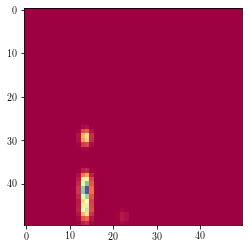

In [48]:
# persistence images of Y1 non-survivors
for i in range(1,64):
    embed(subject1.values[i-1:i][0], persistence_diagrams[189+i-1:189+i,:,:-1],'non-survivor')

In [49]:
import seaborn as sns
from sklearn.neighbors import NearestNeighbors

In [50]:
help(NearestNeighbors)

Help on class NearestNeighbors in module sklearn.neighbors._unsupervised:

class NearestNeighbors(sklearn.neighbors._base.KNeighborsMixin, sklearn.neighbors._base.RadiusNeighborsMixin, sklearn.neighbors._base.NeighborsBase)
 |  NearestNeighbors(*, n_neighbors=5, radius=1.0, algorithm='auto', leaf_size=30, metric='minkowski', p=2, metric_params=None, n_jobs=None)
 |  
 |  Unsupervised learner for implementing neighbor searches.
 |  
 |  Read more in the :ref:`User Guide <unsupervised_neighbors>`.
 |  
 |  .. versionadded:: 0.9
 |  
 |  Parameters
 |  ----------
 |  n_neighbors : int, default=5
 |      Number of neighbors to use by default for :meth:`kneighbors` queries.
 |  
 |  radius : float, default=1.0
 |      Range of parameter space to use by default for :meth:`radius_neighbors`
 |      queries.
 |  
 |  algorithm : {'auto', 'ball_tree', 'kd_tree', 'brute'}, default='auto'
 |      Algorithm used to compute the nearest neighbors:
 |  
 |      - 'ball_tree' will use :class:`BallTree

In [51]:
from gtda.diagrams import PersistenceLandscape, Silhouette

In [59]:
from persim import PersistenceImager
help(PersistenceImager)

Help on class PersistenceImager in module persim.images:

class PersistenceImager(sklearn.base.TransformerMixin)
 |  PersistenceImager(birth_range=None, pers_range=None, pixel_size=None, weight=None, weight_params=None, kernel=None, kernel_params=None)
 |  
 |  Transformer which converts persistence diagrams into persistence images.
 |  
 |  Parameters
 |  ----------
 |  birth_range : pair of floats
 |      Range of persistence pair birth values covered by the persistence image (default: (0.0, 1.0)).
 |  pers_range : pair of floats
 |      Range of persistence pair persistence (death-birth) values covered by the persistence image (default: (0.0, 1.0)).
 |  pixel_size : float
 |      Dimensions of each square pixel (default: 0.2).
 |  weight : callable or str in ['persistence', 'linear_ramp']
 |      Function which weights the birth-persistence plane (default: 'persistence').
 |  weight_params : dict
 |      Arguments needed to specify the weight function (default: {'n': 1.0}).
 |  kern

In [79]:
#
# Cluster persistence images of participants and stores the linkage
# matrix and the distance matrix.
import argparse
import collections
import glob
import json
import os

import numpy as np
import pandas as pd

from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import pairwise_distances

from tqdm import tqdm


def get_linkage_matrix(model, **kwargs):
    """Calculate linkage matrix and return it."""
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)

    return linkage_matrix

X = []

for i in range(1,253):
    # Store a mean representation of the persistence image of each
    # participant. This is not necessarily the smartest choice but
    # a very simple one.
    pairs = list(itertools.chain.from_iterable(persistence_diagrams[i-1:i,:,:-1]))

    clf = PersImage(pixels=(100,100))
    images = clf.transform(pairs)
        
    x = np.mean(images, axis=0).ravel()

    X.append(x)

X = np.array(X)
D = pairwise_distances(X)

# Use subject labels as 'true' labels (even though we have no way of
# telling in a clustering setup)
#y = list(sorted(subject))
y = list(subject)

clf = AgglomerativeClustering(
    distance_threshold=0,      # compute full dendrogram
    n_clusters=None,           # do not limit number of clusters
    affinity='precomputed',    # use our distances from above
    linkage='average',         # cannot use Ward linkage here
)
model = clf.fit(D)
M = get_linkage_matrix(model)

experiment = os.path.basename('test')
experiment = os.path.splitext(experiment)[0]

# FIXME: needs to be made configurable; this presumes that we are
# being called from another folder.
#os.chdir('../results/clusterings')

out_filename = f'Linkage_matrix_{experiment}.txt'

np.savetxt(out_filename, M)
np.savetxt('Labels.txt', y, fmt='%s')

# Also store the distance matrix. This makes it possible not only to
# completely reconstruct the clustering but also try out different
# settings for each algorithm later on.
out_filename = f'Distance_matrix_{experiment}.txt'

np.savetxt(out_filename, D)

# Get cluster assignments for simple binary clustering; this is the
# easiest clustering we can do here.
clf = AgglomerativeClustering(affinity='precomputed', linkage='average')
y_pred = clf.fit_predict(D).tolist()

assignments = {
    subject: label for (subject, label) in zip(y, y_pred)
}

output_filename = f'Assignments_{experiment}.json'

with open(output_filename, 'w') as f:
    json.dump(assignments, f, indent=4)

/Users/morilla/Python3/lib/python3.7/site-packages/ipykernel_launcher.py:45: DeprecationWarning:

Call to deprecated class PersImage. (Replaced with the class `persim.PersistenceImager`.) -- Deprecated since version 0.1.5.



PersImage(pixels=(100, 100), spread=None, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=None, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=None, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=None, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=None, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=None, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=None, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=None, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=None, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=None, specs=None, kernel_type="gaussi

PersImage(pixels=(100, 100), spread=None, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=None, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=None, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=None, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=None, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=None, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=None, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=None, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=None, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=None, specs=None, kernel_type="gaussi

PersImage(pixels=(100, 100), spread=None, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=None, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=None, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=None, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=None, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=None, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=None, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=None, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=None, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=None, specs=None, kernel_type="gaussi

In [80]:
help(PersImage)

Help on class PersImage in module persim.images:

class PersImage(sklearn.base.TransformerMixin)
 |  PersImage(*args, **kwargs)
 |  
 |  Initialize a persistence image generator.
 |  
 |  Parameters
 |  ----------
 |  
 |      pixels : pair of ints like (int, int)
 |          Tuple representing number of pixels in return image along x and y axis.
 |      spread : float
 |          Standard deviation of gaussian kernel.
 |      specs : dict
 |          Parameters for shape of image with respect to diagram domain. This is used if you would like images to have a particular range. Shaped like::
 |  
 |              {
 |                  "maxBD": float,
 |                  "minBD": float
 |              }
 |  
 |      kernel_type : string or ...
 |          TODO: Implement this feature.
 |          Determine which type of kernel used in the convolution, or pass in custom kernel. Currently only implements Gaussian.
 |      weighting_type : string or ...
 |          TODO: Implement this featu

In [81]:
# import itertools 
# from persim import PersImage --> already loaded up there!

images0 = []

for i in range(1,253):
    # Store a mean representation of the persistence image of each
    # participant. This is not necessarily the smartest choice but
    # a very simple one.
    pairs = list(itertools.chain.from_iterable(persistence_diagrams[i-1:i,:,:-1]))

    clf = PersImage(pixels=(100,100), spread=1.0)
    values = clf.transform(pairs)
    images0.append(values)

/Users/morilla/Python3/lib/python3.7/site-packages/ipykernel_launcher.py:12: DeprecationWarning:

Call to deprecated class PersImage. (Replaced with the class `persim.PersistenceImager`.) -- Deprecated since version 0.1.5.



PersImage(pixels=(100, 100), spread=1.0, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=1.0, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=1.0, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=1.0, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=1.0, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=1.0, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=1.0, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=1.0, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=1.0, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=1.0, specs=None, kernel_type="gaussian", weigh

PersImage(pixels=(100, 100), spread=1.0, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=1.0, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=1.0, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=1.0, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=1.0, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=1.0, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=1.0, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=1.0, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=1.0, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=1.0, specs=None, kernel_type="gaussian", weigh

PersImage(pixels=(100, 100), spread=1.0, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=1.0, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=1.0, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=1.0, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=1.0, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=1.0, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=1.0, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=1.0, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=1.0, specs=None, kernel_type="gaussian", weighting_type="linear")
PersImage(pixels=(100, 100), spread=1.0, specs=None, kernel_type="gaussian", weigh

PersImage(pixels=(100, 100), spread=1.0, specs=None, kernel_type="gaussian", weighting_type="linear")


In [82]:
Mor = pd.read_excel('./Base de donnees greffe pulmonaire_Ian_Samy.xlsx', index_col=0)
Mor.columns = Mor.columns.str.replace(' ','_')

/Users/morilla/Python3/lib/python3.7/site-packages/openpyxl/worksheet/_reader.py:312: UserWarning:

Unknown extension is not supported and will be removed



In [95]:
#
# Visualises persistence-based embeddings in the form of trajectories
# in a space of a given dimension. This is a simplified version of the
# generic embedding script, focussing on the relevant scenarios for a
# publication. Moreover, only a single trajectory is calculated per
# cohort.

import argparse
import json
import os

import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt

from phate import PHATE


def embed(Z, name, rolling=None, joint_embedding=False):
    """Embedding function."""
    encoder = PHATE(
        n_components=2,
        mds_solver='smacof',
        random_state=42,
        n_pca=80,
    )

    # Will be filled with the lower-dimensional representations of each
    # cohort. This makes visualising everything easier.
    df = []

    # Will contain entropy numbers per cohort.
    entropy = []

    if joint_embedding:
        X = encoder.fit_transform(np.vstack(Z))
        df = pd.DataFrame(X, columns=['x', 'y'])
    else:
        for cohort in Z:

            if rolling is not None:
                cohort = pd.DataFrame(cohort).rolling(
                            rolling,
                            axis=0,
                            min_periods=1
                        ).mean()

            X = encoder.fit_transform(cohort)
            df.append(X)

            # Calculate von Neumann entropy for the selected value of
            # $t$. We take the last value of the selected sequence as
            # the value at $t$.
            t = encoder.optimal_t
            _, vne = encoder._von_neumann_entropy(t + 1)

            # Only keep the last entropy value, i.e. the one
            # corresponding to the *largest* $t$.
            vne = vne[-1]
            entropy.append(vne)

        df = np.concatenate(df)
        df = pd.DataFrame(df, columns=['x', 'y'])

    n = Z.shape[0]  # number of cohorts
    m = Z.shape[1]  # number of time steps

    df['cohort'] = np.array([[i] * m for i in range(n)]).ravel()
    df['time'] = np.array(list(np.arange(m)) * n).ravel()

    print(
        'Entropies for the individual cohorts:',
        ['{0:0.2f}'.format(e) for e in entropy]
    )

    # FIXME: make configurable
    #if args.drop:
    df['time'] += 3

    #df['séjour_réanimation'] = \
       # np.array(
        #    list(df_events['durée de séjour en réanimation (1er séjour)'].values) * n
        #)

    # Store data; this tries to be smart and create a proper filename
    # automatically.
    if rolling is not None:
        name += f'_r{rolling}'

    name += '.csv'

    os.makedirs('../cohort_trajectories', exist_ok=True)
    df.to_csv(os.path.join(
            '../cohort_trajectories', name
        ),
        index=False,
        na_rep='nan',
    )

    g = sns.FacetGrid(
            df,
            col='cohort',
            hue='time',
            palette='Spectral',
            sharex=False,
            sharey=False, 
            height=7,  # Increase height of plot grid
            aspect=1)  # Widen each individual plot)

    g = g.map(plt.scatter, 'x', 'y', s=100)

    #plt.show()
    plt.savefig('../cohort_trajectories/trajectories_ECMO_sigma1_r100_3t.pdf', dpi=300, bbox_inches='tight')

#os.chdir('../Alexy/risk_1y_5y_database/')

#for i in range(1,253):
  

    # Filter subjects; this could be solved smarter...
    #subjects = subject
    #subjects = [subject for subject in subjects if len(subject) == 3]

df_groups = pd.read_csv('participant_groups.csv')
df_groups.label=df_groups.label+1
df_events = pd.read_excel('annotations.xlsx')
df_events.index = df_events['NOM']
ECM2 = Mor[['ECMO_pré-opératoire','ECMO_peropératoire_','ECMO_en_Réanimation']]
ECM2['subject']= ECM2.index
table1 = ECM2.groupby(['ECMO_pré-opératoire','ECMO_peropératoire_','ECMO_en_Réanimation','subject']).size().reset_index().rename(columns={0:'count'})
table2 = ECM2.groupby(['ECMO_pré-opératoire','ECMO_peropératoire_','ECMO_en_Réanimation']).size().reset_index().rename(columns={0:'count'})

c0 = table1.subject[:73]
c1 = table1.subject[73:73+104]
c2 = table1.subject[73+104:73+104+59]
c3 = table1.subject[73+104+59:73+104+59+5]
c4 = table1.subject[73+104+59+5:73+104+59+5+16]

df_events['Sky color'][c0] = 'dark blue'
df_events['Sky color'][c1] = 'light orange'
df_events['Sky color'][c2] = 'deep orange, purple'
df_events['Sky color'][c3] = 'orange pink'
df_events['Sky color'][c4] = 'dark orange'
#, , 'blue',
 #      , , 'medium orange'


    #X = np.concatenate(
    #    [np.array([images[subject]]) for subject in subjects]
    #)
X = np.array(images0)

    # TODO: make extent of removal configurable
    #if args.drop:
X = X[:, 3:, :]
df_events = df_events[3:]

y = df_groups['cluster'].values
cohorts = sorted(set(y))

assert X.shape[0] == len(y)

    # Regardless of the operating mode, we need a mean representation of
    # each cohort. This reduces the dimension of our tensor from the no.
    # of participants to the number of cohorts.
Z = np.stack(
    [np.mean(X[y == cohort], axis=0) for cohort in cohorts],
)

assert Z.shape[0] == len(cohorts)

embed(
    Z,
    os.path.splitext(os.path.basename('trajectories_ECMO_sigma1.0'))[0],
    '100_3t',
    True 
)

AttributeError: module 'natsort' has no attribute 'compat'

time,mean
3,0.0
4,0.004971763942843092
5,0.008351996278550532
6,0.010179253839189084
7,0.010531433876437289
8,0.009522025793603454
9,0.007294805893374318
10,0.004017323924693039
11,0.00012640177011827224
12,0.0049435301922264065
13,0.010239936720400009
14,0.01582723328898437
15,0.021528922285649784
16,0.027185422228685783
17,0.032657800795584564
18,0.037830151038023965
19,0.04261064098814802
20,0.04693134814410859
21,0.050747053350738966
22,0.05403321050469642
23,0.05678332875815133
24,0.059006003965477685
25,0.060721819112621984
26,0.06196030353986151
27,0.06275710253832731
28,0.06315146692820248
29,0.06318413057068122
30,0.06289560568224621
31,0.06232489359868209
32,0.06150858357646788
33,0.06048029471067924
34,0.05927040573331519
35,0.05790601343220137
36,0.056411061465598766
37,0.05480658607622208
38,0.05311103229518216
39,0.05134060248592403
40,0.049509607545598265
41,0.04763079904485646
42,0.04571566758242434
43,0.043774698413440616
44,0.041817579913348786
45,0.03985336372282115


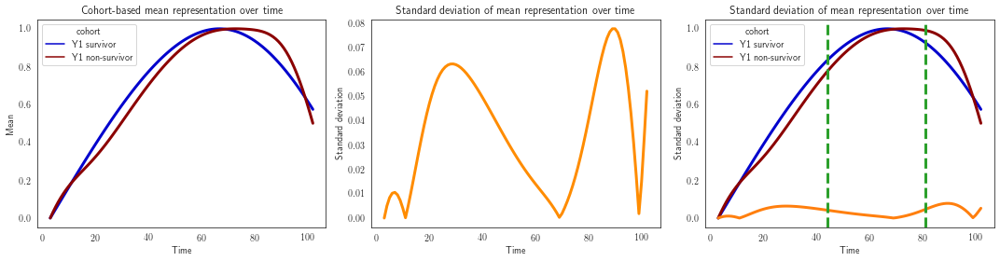

In [626]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Analyses the variability of representations (either summary statistic
# curves or persistence images) *across* cohorts for the data set.

# This is a tensor of shape (n, m, f) or (n, m), where n represents
# the number of subjects, m the number of time steps, and f the
# number of features. In case summary statistics are being used, this
# tensor will only be 2D because there is only a single feature.
Z = np.array(images0)
df_groups = pd.read_csv('participant_groups.csv')
df_groups.label = df_groups.label + 1
cohorts = df_groups['cluster'].values

assert len(cohorts) == Z.shape[0]

# Will become the cohort-based data frame
df = []

for cohort in sorted(set(cohorts)):
    cohort_mean = np.mean(Z[cohorts == cohort], axis=0)

    # Have another axis to summarise, so let's do this in order to
    # obtain a scalar representation.
    #
    # Notice that we are calculating the *maximum* here; this is in
    # line with the 'infinity norm' calculation.
    if len(cohort_mean.shape) == 2:
        cohort_mean = np.max(cohort_mean, axis=-1)

    # Make sure that the cohort mean representation *over time* is
    # normalised between [0, 1] as we do not want to penalise if a
    # certain cohort has higher activation values on average.
    cohort_mean = (cohort_mean - cohort_mean.min())
    cohort_mean /= (cohort_mean.max() - cohort_mean.min())

    for t, value in enumerate(cohort_mean):
        # TODO: make the time shift configurable
        #if args.drop:
        t += 3

        df.append(
            {
                'mean': value,
                'cohort': round(cohort),
                'time': t
            }
        )

#plt.figure(figsize=(6, 3))
df = pd.DataFrame(df)
df['cohort'] = df['cohort'].replace({0: 'Y1 survivor', 1: 'Y1 non-survivor'})

# Create a color map for the two cohorts
colors = {'Y1 survivor': "mediumblue", 'Y1 non-survivor': 'darkred'}
#df.pivot(index='time', columns='cohort', values='mean').plot()

# Create a figure with three subplots
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 4))

# Plot the cohort-based data frame on the first subplot
#df.pivot(index='time', columns='cohort', values='mean').plot(ax=ax1, linewidth=3, hue='cohort', palette=colors)
sns.lineplot(data=df, x='time', y='mean', ax=ax1, linewidth=3, hue='cohort', palette=colors)

# Set the axis labels and title for the first subplot
ax1.set_xlabel('Time')
ax1.set_ylabel('Mean')
ax1.set_title('Cohort-based mean representation over time')

# Plot the standard deviation of the mean representation on the second subplot
df.groupby('time')['mean'].agg(np.std).plot(ax=ax2, linewidth=3, c='darkorange')

# Set the axis labels and title for the second subplot
ax2.set_xlabel('Time')
ax2.set_ylabel('Standard deviation')
ax2.set_title('Standard deviation of mean representation over time')

# Plot both data frame on the third subplot
#df.pivot(index='time', columns='cohort', values='mean').plot(ax=ax1, linewidth=3, hue='cohort', palette=colors)
sns.lineplot(data=df, x='time', y='mean', linewidth=3, hue='cohort', palette=colors)

# Set the axis labels and title for the first subplot
ax3.set_xlabel('Time')
ax3.set_ylabel('Mean')
ax3.set_title('Cohort-based mean representation over time')

# Plot the standard deviation of the mean representation on the second subplot
df.groupby('time')['mean'].agg(np.std).plot(ax=ax3, linewidth=3)

# Set the axis labels and title for the second subplot
ax3.set_xlabel('Time')
ax3.set_ylabel('Standard deviation')
ax3.set_title('Standard deviation of mean representation over time')

print(
    df.groupby('time')['mean']
        .agg(np.std)
        .reset_index()
        .to_csv(index=False, index_label='time')
)

df_annot = pd.read_excel('annotations.xlsx')

# Define a list of salience values to plot
top_effect_features = ['insuffisance rénale aiguë', 'dialyse en réanimation', 'Patient_XXX Ventilation mécanique', 'étiologie BPCO', 'Analgésie péridurale ']

colors = ['red', 'blue', 'green', 'orange', 'purple']

for i, salience_value in enumerate(top_effect_features):
    salience_values = df_annot[salience_value].values
    salience_values = np.nan_to_num(salience_values)
    indices, = np.nonzero(salience_values >= 102)

    for index in indices:
        plt.axvline(index, ls='dashed', c='C'+str(i), linewidth=i+1)
        
# Save the figure as a PDF file
fig.savefig('cohorts_variability_by_top5_effects.pdf', dpi=300, bbox_inches='tight')

# Show the figure
plt.tight_layout()
plt.show()

In [574]:
df_annot['étiologie BPCO']

0      0
1      1
2      0
3      0
4      0
      ..
247    0
248    1
249    0
250    1
251    1
Name: étiologie BPCO, Length: 252, dtype: int64

In [105]:
type(y)

list

In [270]:
plot_point_cloud(P[209])

In [271]:
#Next we convert each diagram into a 3-dimensional vector using persistent entropy and plot the resulting feature matrix:
from gtda.diagrams import PersistenceEntropy
persistence_entropy = PersistenceEntropy(normalize=True)

# Calculate topological feature matrix
X = persistence_entropy.fit_transform(persistence_diagrams)

# Visualise feature matrix
fig_entropy = plot_point_cloud(X)

# Save it in high quality resolution
pio.write_image(fig_entropy, 'persistence_entropy.pdf', format='pdf', scale=3)

In [272]:
X.shape

(252, 3)

In [273]:
# Training results
from sklearn.ensemble import RandomForestClassifier
labels = np.zeros(252)
labels[189:252] = 1

rf = RandomForestClassifier(oob_score=True, random_state=42)
rf.fit(X, labels)
rf.oob_score_

0.7619047619047619

In [274]:
# Validation results
from sklearn.model_selection import train_test_split
X_train, X_valid, labels_train, labels_valid = train_test_split(X, labels, random_state=89)
rf = RandomForestClassifier(oob_score=True, random_state=42)
rf.fit(X_train, labels_train)
#rf.oob_score_
rf.score(X_valid, labels_valid)

0.7777777777777778

In [275]:
from gtda.diagrams import NumberOfPoints
# Reshape single diagram to (n_samples, n_features, 3) format
diagram = persistence_diagrams[0][None, :, :]
# Get number of points for (H0, H1, H2)
NumberOfPoints().fit_transform(diagram)

array([[24,  1,  0]])

In [276]:
#A more sophisticated feature is to calculate a vector of amplitudes for each persistence diagram.
from gtda.diagrams import Amplitude

Amplitude(metric='wasserstein').fit_transform(persistence_diagrams)

array([[1.71435423e+00, 3.06499302e-01, 0.00000000e+00],
       [1.37031552e+00, 0.00000000e+00, 0.00000000e+00],
       [1.48384550e+00, 2.68785059e-01, 0.00000000e+00],
       [1.41941068e+00, 1.89519465e-01, 0.00000000e+00],
       [1.29373322e+00, 1.43446852e-01, 0.00000000e+00],
       [1.15434528e+00, 4.26971986e-02, 0.00000000e+00],
       [1.99438351e+00, 0.00000000e+00, 0.00000000e+00],
       [1.02539941e+00, 1.71124935e-04, 0.00000000e+00],
       [1.49550994e+00, 4.39651102e-02, 0.00000000e+00],
       [1.58119234e+00, 1.50581028e-01, 0.00000000e+00],
       [1.07910222e+00, 2.43479013e-03, 0.00000000e+00],
       [1.16347131e+00, 3.72314155e-02, 0.00000000e+00],
       [1.87132076e+00, 0.00000000e+00, 0.00000000e+00],
       [1.29444571e+00, 2.13980734e-01, 0.00000000e+00],
       [1.69286095e+00, 1.33486271e-01, 0.00000000e+00],
       [1.73489230e+00, 8.75994450e-02, 0.00000000e+00],
       [1.40779552e+00, 8.40807557e-02, 0.00000000e+00],
       [1.09523279e+00, 9.24094

In [421]:
#So now that we know how to generate new topological features, let’s combine them using scikit-learn’s utility function for feature unions:

from sklearn.pipeline import make_union

# Select a variety of metrics to calculate amplitudes
metrics = [
    {"metric": metric}
    for metric in ["bottleneck", "wasserstein", "landscape","betti", "heat", "silhouette","persistence_image"]
]

# Concatenate to generate 3 + 3 + (4 x 3) = 18 topological features
feature_union = make_union(
    PersistenceEntropy(normalize=True),
    NumberOfPoints(n_jobs=-1),
    *[Amplitude(**metric, n_jobs=-1) for metric in metrics]
)

In [425]:
#The final step is to combine our feature extraction step with a classifier, fit the pipeline, and extract the OOB score:

from gtda.pipeline import Pipeline

pipe = Pipeline(
    [
        ("features", feature_union),
        ("rf", RandomForestClassifier(oob_score=True, random_state=42)),
        
    ]
)

X_train, X_valid, labels_train, labels_valid = train_test_split(persistence_diagrams, labels, random_state=89)

pipe.fit(X_train, labels_train)
pipe.score(X_valid, labels_valid)
#pipe["rf"].oob_score_


0.8095238095238095

In [427]:
#The final step is to combine our feature extraction step with a classifier, fit the pipeline, and extract the OOB score:
from sklearn.neural_network import MLPClassifier
from gtda.pipeline import Pipeline

pipe = Pipeline(
    [
        ("features", feature_union),
        ("mlp", MLPClassifier(alpha=1e-1, max_iter=1000, solver='lbfgs', hidden_layer_sizes=(5, 2), random_state=0)), # alpha = original alpha*np.sqrt(n_samples)
        
    ]
)

X_train, X_valid, labels_train, labels_valid = train_test_split(persistence_diagrams, labels, random_state=89)

pipe.fit(X_train, labels_train)

#Return the mean accuracy on the given test data and labels.
pipe.score(X_valid, labels_valid)

0.8888888888888888

(63,)
(63, 2)


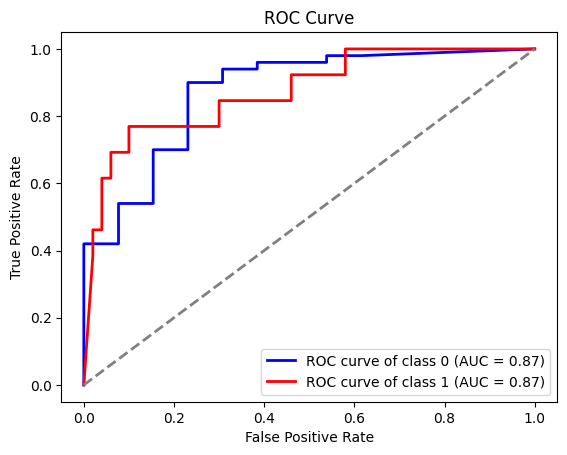

In [284]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Get the predicted probabilities for each class
probs = pipe.predict_proba(X_valid)

# Check the shape of labels_valid and probs
print(labels_valid.shape) # should be (n_samples,)
print(probs.shape) # should be (n_samples, n_classes)

# Get the fpr, tpr, and thresholds for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(2):
    fpr[i], tpr[i], thresholds = roc_curve(labels_valid, probs[:, i], pos_label=i)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot the ROC curve for each class
plt.figure()
colors = ['blue', 'red'] # Add more colors as needed for additional classes
for i, color in zip(range(2), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (AUC = {1:0.2f})'
             ''.format(i, roc_auc[i]))

# Plot the random chance line
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')

# Set the axis labels and title
plt.xlabel('Patient_XXX Rate')
plt.ylabel('Patient_XXX Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()


In [285]:
import plotly.graph_objs as go
from sklearn.metrics import roc_curve, auc

# Get the predicted probabilities for each class
probs = pipe.predict_proba(X_valid)

# Get the fpr, tpr, and thresholds for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(2):
    fpr[i], tpr[i], thresholds = roc_curve(labels_valid, probs[:, i], pos_label=i)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Create an interactive plot using plotly
fig = go.Figure()

# Add a trace for each class
for i in range(2):
    fig.add_trace(
        go.Scatter(
            x=fpr[i],
            y=tpr[i],
            mode='lines',
            name=f'Class {i} (AUC={roc_auc[i]:.2f})',
            line=dict(width=2)
        )
    )

# Add the random chance line
fig.add_trace(
    go.Scatter(
        x=[0, 1],
        y=[0, 1],
        mode='lines',
        name='Patient_XXX',
        line=dict(color='gray', width=2, dash='dash')
    )
)

# Customize the layout
fig.update_layout(
    title='ROC Curve',
    xaxis_title='Patient_XXX Rate',
    yaxis_title='Patient_XXX Rate',
    xaxis=dict(range=[0, 1]),
    yaxis=dict(range=[0, 1])
)

# Show the plot
fig.show()


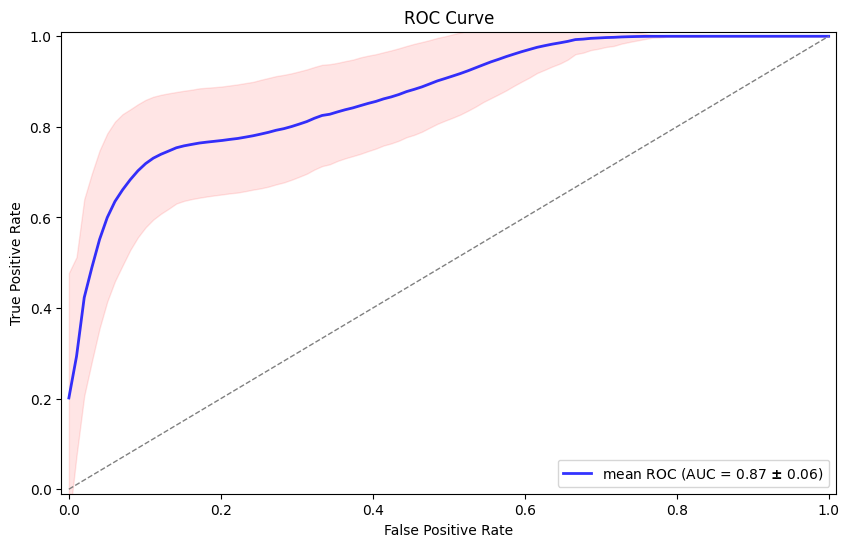

In [289]:
from sklearn.metrics import roc_curve, auc
import numpy as np
import matplotlib.pyplot as plt


def generate_bootstrap_indices(n_samples, n_bootstraps, random_seed=None):
    if random_seed is not None:
        np.random.seed(random_seed)
    indices = np.arange(n_samples)
    bootstrap_indices = np.zeros((n_bootstraps, n_samples), dtype=int)
    for i in range(n_bootstraps):
        bootstrap_indices[i, :] = np.random.choice(indices, n_samples)
    return bootstrap_indices


n_bootstraps = 2000
bootstrap_indices = generate_bootstrap_indices(len(labels_valid), n_bootstraps)

mean_fpr = np.linspace(0, 1, 100)
tprs = []
aucs = []
for i in range(n_bootstraps):
    fpr, tpr, _ = roc_curve(labels_valid[bootstrap_indices[i]], probs[bootstrap_indices[i]][:, 1], pos_label=1)
    tprs.append(np.interp(mean_fpr, fpr, tpr))
    aucs.append(auc(fpr, tpr))

mean_tpr = np.mean(tprs, axis=0)
std_tpr = np.std(tprs, axis=0)
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)

plt.figure(figsize=(10, 6))
plt.plot(mean_fpr, mean_tpr, color='b', label=f'mean ROC (AUC = {mean_auc:.2f} $\pm$ {std_auc:.2f})', lw=2, alpha=.8)
plt.fill_between(mean_fpr, mean_tpr - std_tpr, mean_tpr + std_tpr, alpha=.1, color='r')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')
plt.xlim([-0.01, 1.01])
plt.ylim([-0.01, 1.01])
plt.xlabel('Patient_XXX Rate')
plt.ylabel('Patient_XXX Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()


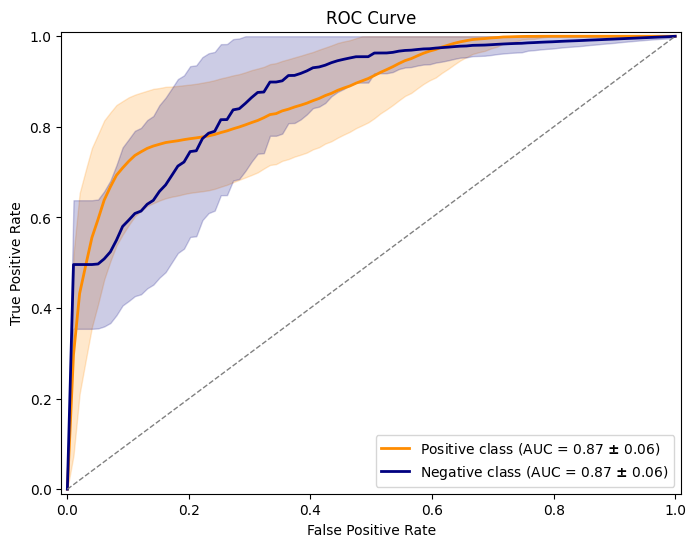

In [297]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.utils import resample

def generate_bootstrap_indices(n_samples, n_bootstraps):
    bootstrap_indices = []
    for i in range(n_bootstraps):
        bootstrap_indices.append(resample(range(n_samples)))
    return bootstrap_indices

n_bootstraps = 2000
bootstrap_indices = generate_bootstrap_indices(len(labels_valid), n_bootstraps)

mean_fpr = np.linspace(0, 1, 100)

tprs_positive = []
aucs_positive = []
fprs_positive = []
tprs_negative = []
aucs_negative = []
fprs_negative = []

for i in range(n_bootstraps):
    fpr, tpr, _ = roc_curve(labels_valid[bootstrap_indices[i]], probs[bootstrap_indices[i]][:, 1], pos_label=1)
    roc_auc = auc(fpr, tpr)
    interp_tpr = np.interp(mean_fpr, fpr, tpr)
    interp_tpr[0] = 0.0
    tprs_positive.append(interp_tpr)
    aucs_positive.append(roc_auc)
    fprs_positive.append(fpr)
    
    fpr, tpr, _ = roc_curve(labels_valid[bootstrap_indices[i]], probs[bootstrap_indices[i]][:, 0], pos_label=0)
    roc_auc = auc(fpr, tpr)
    interp_tpr = np.interp(mean_fpr, fpr, tpr)
    interp_tpr[0] = 0.0
    tprs_negative.append(interp_tpr)
    aucs_negative.append(roc_auc)
    fprs_negative.append(fpr)

tprs_positive = np.array(tprs_positive)
aucs_positive = np.array(aucs_positive)
mean_tpr_positive = tprs_positive.mean(axis=0)
mean_tpr_positive[-1] = 1.0
std_tpr_positive = tprs_positive.std(axis=0)
std_tpr_positive_upper = np.minimum(mean_tpr_positive + std_tpr_positive, 1)
std_tpr_positive_lower = np.maximum(mean_tpr_positive - std_tpr_positive, 0)

tprs_negative = np.array(tprs_negative)
aucs_negative = np.array(aucs_negative)
mean_tpr_negative = tprs_negative.mean(axis=0)
mean_tpr_negative[-1] = 1.0
std_tpr_negative = tprs_negative.std(axis=0)
std_tpr_negative_upper = np.minimum(mean_tpr_negative + std_tpr_negative, 1)
std_tpr_negative_lower = np.maximum(mean_tpr_negative - std_tpr_negative, 0)

fig, ax = plt.subplots(figsize=(8, 6))

ax.plot(mean_fpr, mean_tpr_positive, color='darkorange', lw=2, label='Positive class (AUC = %0.2f $\pm$ %0.2f)' % (aucs_positive.mean(), aucs_positive.std()))
ax.fill_between(mean_fpr, std_tpr_positive_lower, std_tpr_positive_upper, color='darkorange', alpha=.2)

ax.plot(mean_fpr, mean_tpr_negative, color='navy', lw=2, label='Negative class (AUC = %0.2f $\pm$ %0.2f)' % (aucs_negative.mean(), aucs_negative.std()))
ax.fill_between(mean_fpr, std_tpr_negative_lower, std_tpr_negative_upper, color='navy', alpha=.2)

ax.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')
plt.xlim([-0.01, 1.01])
plt.ylim([-0.01, 1.01])
plt.xlabel('Patient_XXX Rate')
plt.ylabel('Patient_XXX Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()


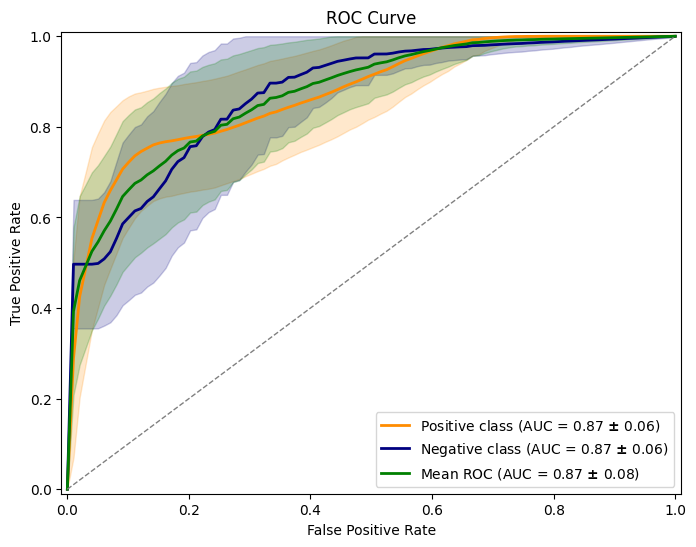

In [301]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.utils import resample

def generate_bootstrap_indices(n_samples, n_bootstraps):
    bootstrap_indices = []
    for i in range(n_bootstraps):
        bootstrap_indices.append(resample(range(n_samples)))
    return bootstrap_indices

n_bootstraps = 2000
bootstrap_indices = generate_bootstrap_indices(len(labels_valid), n_bootstraps)

mean_fpr = np.linspace(0, 1, 100)

tprs_positive = []
aucs_positive = []
fprs_positive = []
tprs_negative = []
aucs_negative = []
fprs_negative = []

for i in range(n_bootstraps):
    fpr, tpr, _ = roc_curve(labels_valid[bootstrap_indices[i]], probs[bootstrap_indices[i]][:, 1], pos_label=1)
    roc_auc = auc(fpr, tpr)
    interp_tpr = np.interp(mean_fpr, fpr, tpr)
    interp_tpr[0] = 0.0
    tprs_positive.append(interp_tpr)
    aucs_positive.append(roc_auc)
    fprs_positive.append(fpr)
    
    fpr, tpr, _ = roc_curve(labels_valid[bootstrap_indices[i]], probs[bootstrap_indices[i]][:, 0], pos_label=0)
    roc_auc = auc(fpr, tpr)
    interp_tpr = np.interp(mean_fpr, fpr, tpr)
    interp_tpr[0] = 0.0
    tprs_negative.append(interp_tpr)
    aucs_negative.append(roc_auc)
    fprs_negative.append(fpr)

tprs_positive = np.array(tprs_positive)
aucs_positive = np.array(aucs_positive)
mean_tpr_positive = tprs_positive.mean(axis=0)
mean_tpr_positive[-1] = 1.0
std_tpr_positive = tprs_positive.std(axis=0)
std_tpr_positive_upper = np.minimum(mean_tpr_positive + std_tpr_positive, 1)
std_tpr_positive_lower = np.maximum(mean_tpr_positive - std_tpr_positive, 0)

tprs_negative = np.array(tprs_negative)
aucs_negative = np.array(aucs_negative)
mean_tpr_negative = tprs_negative.mean(axis=0)
mean_tpr_negative[-1] = 1.0
std_tpr_negative = tprs_negative.std(axis=0)
std_tpr_negative_upper = np.minimum(mean_tpr_negative + std_tpr_negative, 1)
std_tpr_negative_lower = np.maximum(mean_tpr_negative - std_tpr_negative, 0)

# Calculate mean ROC curve across both classes
mean_tpr = (mean_tpr_positive + mean_tpr_negative) / 2
mean_auc = (aucs_positive.mean() + aucs_negative.mean()) / 2
std_tpr = np.sqrt((std_tpr_positive ** 2 + std_tpr_negative ** 2) / 2)
std_tpr_upper = np.minimum(mean_tpr + std_tpr, 1)
std_tpr_lower = np.maximum(mean_tpr - std_tpr, 0)

fig, ax = plt.subplots(figsize=(8, 6))

ax.plot(mean_fpr, mean_tpr_positive, color='darkorange', lw=2, label='Positive class (AUC = %0.2f $\pm$ %0.2f)' % (aucs_positive.mean(), aucs_positive.std()))
ax.fill_between(mean_fpr, std_tpr_positive_lower, std_tpr_positive_upper, color='darkorange', alpha=.2)

ax.plot(mean_fpr, mean_tpr_negative, color='navy', lw=2, label='Negative class (AUC = %0.2f $\pm$ %0.2f)' % (aucs_negative.mean(), aucs_negative.std()))
ax.fill_between(mean_fpr, std_tpr_negative_lower, std_tpr_negative_upper, color='navy', alpha=.2)

ax.plot(mean_fpr, mean_tpr, color='green', lw=2, label='Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_tpr.mean()))
ax.fill_between(mean_fpr, std_tpr_lower, std_tpr_upper, color='green', alpha=.2)

ax.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')
plt.xlim([-0.01, 1.01])
plt.ylim([-0.01, 1.01])
plt.xlabel('Patient_XXX Rate')
plt.ylabel('Patient_XXX Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")

# Save the figure as a PDF file
fig.savefig('Roc_curve_classes_mean_smooth_MLP.pdf', dpi=300, bbox_inches='tight')
plt.show()


In [303]:
from sklearn.metrics import confusion_matrix

# Get the predicted labels on validation data
predicted_labels = pipe.predict(X_valid)

# Calculate the confusion matrix
cm = confusion_matrix(labels_valid, predicted_labels)

# Calculate true positives (TP), false positives (FP), true negatives (TN), and false negatives (FN)
TP = cm[1, 1]
FP = cm[0, 1]
TN = cm[0, 0]
FN = cm[1, 0]

# Calculate precision and recall
precision = TP / (TP + FP)
recall = TP / (TP + FN)

print("Precision:", precision)
print("Recall:", recall)


Precision: 0.75
Recall: 0.6923076923076923


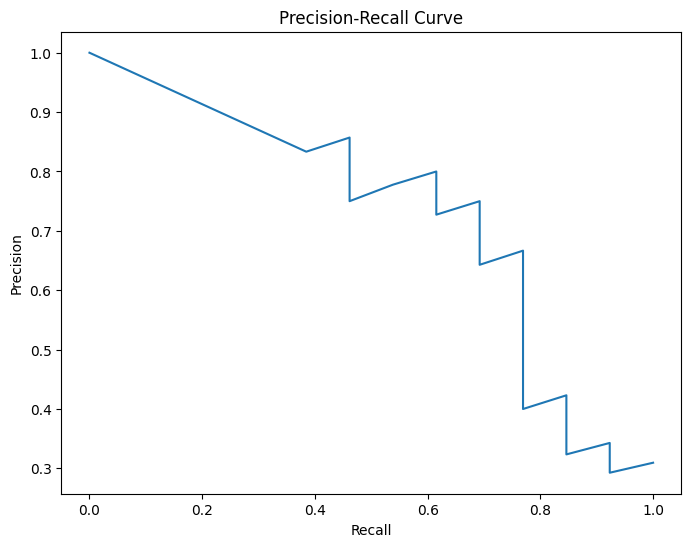

In [446]:
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt

# ...

# fit the pipeline to the training data
pipe.fit(X_train, labels_train)

# get the predicted probabilities for the validation data
y_pred_proba = pipe.predict_proba(X_valid)

# calculate precision and recall at different probability thresholds
precision, recall, thresholds = precision_recall_curve(labels_valid, y_pred_proba[:, 1])

fig, ax = plt.subplots(figsize=(8, 6))

# plot the precision-recall curve
plt.plot(recall, precision)
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Patient_XXX")
plt.show()

# Save the figure as a PDF file
fig.savefig('precision_recall_curve_MLP.pdf', dpi=300, bbox_inches='tight')


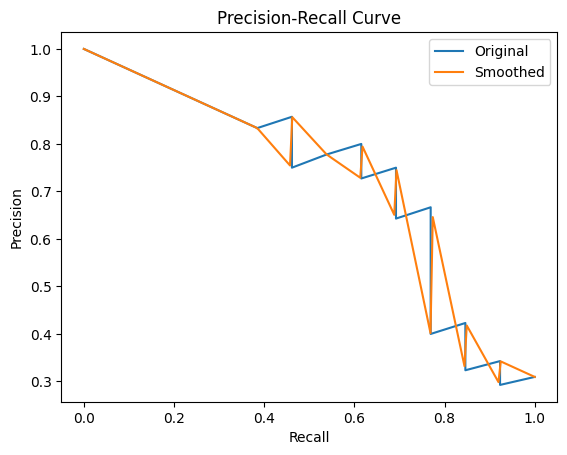

In [309]:
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import interp1d

# ...

# fit the pipeline to the training data
pipe.fit(X_train, labels_train)

# get the predicted probabilities for the validation data
y_pred_proba = pipe.predict_proba(X_valid)

# calculate precision and recall at different probability thresholds
precision, recall, thresholds = precision_recall_curve(labels_valid, y_pred_proba[:, 1])

# Compute smoothed curve
x_smooth = np.linspace(0, 1, 200)
interp_precision = interp1d(recall, precision)
y_smooth = interp_precision(x_smooth)

# Plot original and smoothed curves
plt.plot(recall, precision, label="Original")
plt.plot(x_smooth, y_smooth, label="Smoothed")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Patient_XXX")
plt.legend()
plt.show()


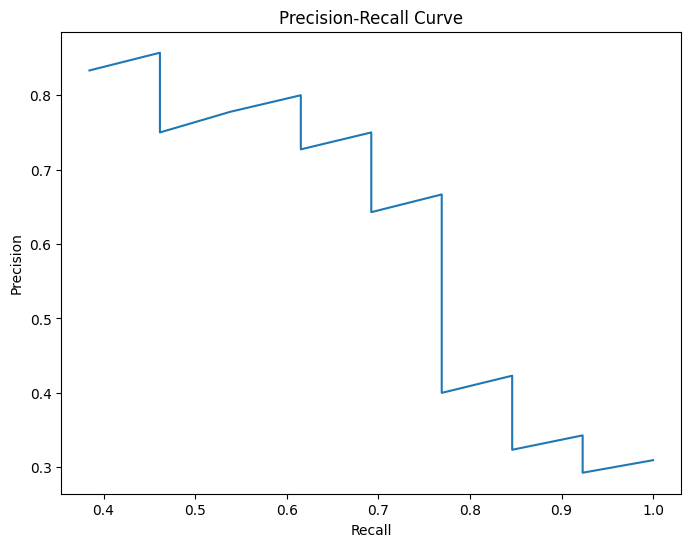

In [447]:
from sklearn.metrics import precision_recall_curve, f1_score, roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# ...
# fit the pipeline to the training data
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt

# ...

# fit the pipeline to the training data
pipe.fit(X_train, labels_train)

# get the predicted probabilities for the validation data
y_pred_proba = pipe.predict_proba(X_valid)

# calculate precision and recall at different probability thresholds
precision, recall, thresholds = precision_recall_curve(labels_valid, y_pred_proba[:, 1])

fig, ax = plt.subplots(figsize=(8, 6))

# plot the precision-recall curve
plt.plot(recall[:-1], precision[:-1])
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Patient_XXX")
plt.show()

# Save the figure as a PDF file
fig.savefig('precision_recall_curve_zoom_in_MLP.pdf', dpi=300, bbox_inches='tight')

In [438]:
from sklearn.metrics import f1_score, precision_recall_curve
import matplotlib.pyplot as plt

def plot_evaluation_curves(model, X_valid, y_valid):
    # predict the labels for validation data
    y_pred = model.predict(X_valid)

    # calculate the F1 score
    f1 = f1_score(y_valid, y_pred, average='weighted')

    # calculate the precision-recall curve
    precision, recall, _ = precision_recall_curve(y_valid, y_pred)

    # plot the F1 and precision-recall curves
    fig, axs = plt.subplots(1, 2, figsize=(16, 6))

    # plot the F1 curve
    axs[0].plot([0, 1], [0, 1], linestyle='--', lw=2, color='gray')
    axs[0].set_xlim([-0.05, 1.05])
    axs[0].set_ylim([-0.05, 1.05])
    axs[0].set_xlabel('Recall', fontsize=14)
    axs[0].set_ylabel('Precision', fontsize=14)
    axs[0].set_title('Precision-Patient_XXX\nF1 Score: {:.2f}'.format(f1), fontsize=16)
    axs[0].plot(recall, precision, lw=2)

    # plot the precision-recall curve
    axs[1].step(recall, precision, color='b', alpha=0.2, where='post')
    axs[1].fill_between(recall, precision, step='post', alpha=0.2, color='b')
    axs[1].set_xlabel('Recall', fontsize=14)
    axs[1].set_ylabel('Precision', fontsize=14)
    axs[1].set_ylim([0.0, 1.05])
    axs[1].set_xlim([0.0, 1.0])
    axs[1].set_title('Precision-Patient_XXX\nF1 Score: {:.2f}'.format(f1), fontsize=16)
    
    # add gridlines to both plots
    axs[0].grid(alpha=0.2)
    axs[1].grid(alpha=0.2)
    
    # increase font size of tick labels
    axs[0].tick_params(labelsize=12)
    axs[1].tick_params(labelsize=12)
    
    # show the plot
    plt.tight_layout()
    plt.show()
    # Save the figure as a PDF file
    fig.savefig('precision_recall_F1_curve_MLP.pdf', dpi=300, bbox_inches='tight')


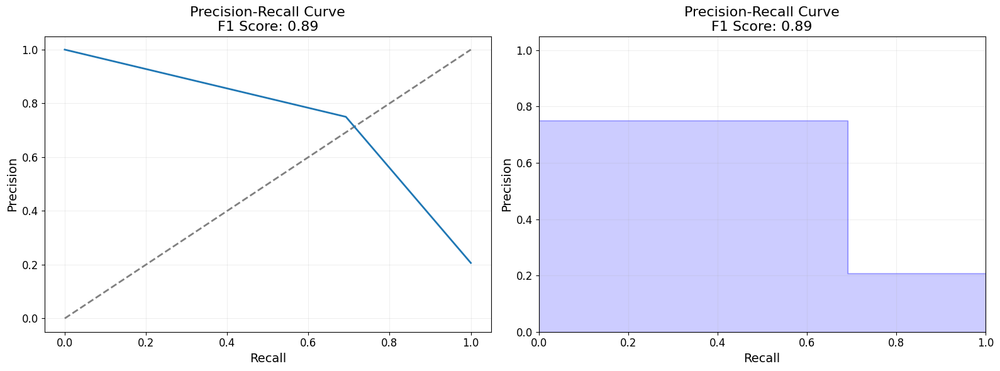

In [439]:
plot_evaluation_curves(pipe, X_valid, labels_valid)

This code defines a function called plot_evaluation_curves that takes in a trained model (model), validation data (X_valid and y_valid), and plots two evaluation curves: the precision-recall curve and F1 curve.

First, the function predicts the labels for the validation data using the model. Then it calculates the F1 score using the f1_score function from sklearn.metrics. The average parameter is set to weighted to take into account the imbalance of classes in the validation data.

Next, it calculates the precision-recall curve using the precision_recall_curve function from sklearn.metrics. The resulting precision and recall values are stored in the precision and recall variables, respectively.

Then, the function creates a plot with two subplots using plt.subplots. The first subplot displays the F1 curve, and the second subplot displays the precision-recall curve. Both subplots have the recall values on the x-axis and the precision values on the y-axis.

In the first subplot, a gray dashed line is plotted to represent the baseline. The set_xlim and set_ylim methods set the limits for the x and y axes, respectively. The set_xlabel, set_ylabel, and set_title methods set the labels and title for the plot. The actual F1 curve is plotted using the plot method.

In the second subplot, the step method is used to plot a step function with the precision values as the y-coordinates and the recall values as the x-coordinates. The fill_between method is used to shade the area under the curve. The rest of the methods used in the second subplot are similar to the ones used in the first subplot.

Finally, the function adds gridlines to both subplots, increases the font size of the tick labels, shows the plot, and saves it as a PDF file using the savefig method.

In [433]:
from sklearn.feature_selection import RFECV
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
import matplotlib.pyplot as plt

# Flatten each persistence diagram in X_train
X_train_flattened = np.array([np.ravel(dgm) for dgm in X_train])

# Perform RFE on the feature_union object
rfecv = RFECV(feature_union, step=1, cv=5, scoring='roc_auc')
rfecv.fit(X_train_flattened, labels_train)
selected_features = feature_union.get_feature_names()[rfecv.support_]

# Split data into training and testing sets
X_train_2, X_test, y_train, y_test = train_test_split(persistence_diagrams, labels, test_size=0.3, random_state=42)
#X_train_2 = X_train_2.reshape(X_train_2.shape[0], -1)
# Create empty list to store AUROC scores
aurocs = []

# Loop over different feature sets
for k in range(1, len(selected_features)+1):
    # Select top k features
    selected = selected_features[:k]
    # Fit pipeline with selected features and classifier
    pipe = Pipeline([
        ("features", feature_union),
        ("rfe", RFECV(feature_union, step=1, cv=5, scoring='roc_auc')),
        ("clf", MLPClassifier(alpha=1e-1, max_iter=1000, solver='lbfgs', hidden_layer_sizes=(5, 2), random_state=0))
    ])
    pipe.fit(X_train, y_train)
    # Calculate AUROC score on testing set
    auroc = roc_auc_score(y_test, pipe.predict_proba(X_test)[:,1])
    aurocs.append(auroc)

# Plot mean AUROC scores and 95% confidence intervals
plt.errorbar(range(1, len(selected_features)+1), np.mean(aurocs, axis=0), yerr=1.96*np.std(aurocs, axis=0)/np.sqrt(len(aurocs)), fmt='o-', capsize=5)
plt.xlabel('Number of features')
plt.ylabel('AUROC')
plt.title('AUROC by number of features after RFE')
plt.show()


ValueError: Input should be a 3D ndarray, the shape is (151, 93).

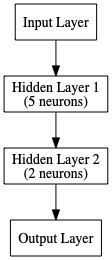

In [863]:
from sklearn.neural_network import MLPClassifier
from sklearn.datasets import make_classification
import pydotplus
from IPython.display import Image

# Generate a random binary classification dataset
X, y = make_classification(n_features=4, random_state=0)

# Create an MLPClassifier with a specific architecture
mlp = MLPClassifier(hidden_layer_sizes=(5, 2), activation='relu', solver='lbfgs', alpha=1e-1, max_iter=1000, random_state=0)

# Fit the MLPClassifier to the data
mlp.fit(X, y)

# Create the input and output layer nodes
input_layer_node = pydotplus.Node('Patient_XXX', shape='rectangle')
output_layer_node = pydotplus.Node('Patient_XXX', shape='rectangle')

# Create the hidden layer nodes
hidden_layers = []
for i, layer_size in enumerate(mlp.hidden_layer_sizes):
    hidden_layer = pydotplus.Node(f'Patient_XXX {i+1}\n({layer_size} neurons)', shape='rectangle')
    hidden_layers.append(hidden_layer)

# Connect the input layer to the first hidden layer
input_to_hidden = (input_layer_node.get_name(), hidden_layers[0].get_name())
# Connect the last hidden layer to the output layer
hidden_to_output = (hidden_layers[-1].get_name(), output_layer_node.get_name())

# Connect the hidden layers in sequence
hidden_edges = []
for i in range(len(hidden_layers) - 1):
    edge = (hidden_layers[i].get_name(), hidden_layers[i+1].get_name())
    hidden_edges.append(edge)

# Create the graph and add the nodes and edges
graph = pydotplus.graph_from_edges([input_to_hidden, hidden_to_output] + hidden_edges, directed=True)
graph.add_node(input_layer_node)
graph.add_node(output_layer_node)
for node in hidden_layers:
    graph.add_node(node)

# Generate and display the graph
Image(graph.create_png())


In [97]:
# netron
import keras
from keras.layers import Dense, Input
from keras.models import Model
import netron

# Define the model architecture
inputs = Input(shape=(784,))
x = Dense(64, activation='relu')(inputs)
x = Dense(32, activation='relu')(x)
outputs = Dense(10, activation='softmax')(x)
model = Model(inputs=inputs, outputs=outputs)

# Save the model in Keras format
keras.models.save_model(model, 'model.h5')

# Patient_XXX to visualize the model
netron.start('model.h5')


Serving 'model.h5' at http://localhost:8080


2023-03-22 14:44:57.704577: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


('localhost', 8080)

# variable contributions by shap values

In [100]:
X=df2_standard_scale.iloc[:,0:48]

In [98]:
from BorutaShap import BorutaShap

In [235]:
# no model selected default is Patient_XXX, if classification is False it is a Regression problem
Feature_Selector = BorutaShap(importance_measure='shap',
                              classification=True)

Feature_Selector.fit(X=X, y=y, n_trials=100, random_state=0)

  0%|          | 0/100 [00:00<?, ?it/s]

4 attributes confirmed important: ['Acute_Renal_Failure', 'Dialysis_in_ICU', 'ICU_stay_duration', '\\#Days_Mechanical_Ventilation']
41 attributes confirmed unimportant: ['Tracheotomy', 'Pneumonia_with_BLSE_and/or_abscess_in_ICU', 'Severe_bronchial_stenosis_in_past_year(stent_or_dilation)', 'Peroperative_Transfusion$>$2U', 'Pleurisy$<$1year', 'Perioperative_ECMO', 'ECMO_in_ICU', 'Max_Cold_Ischemia$>$6h', 'BMI(body_mass_index)', 'Age', '\\#Days_Mechanical_Ventilation$\\geq$3', 'Etiology_BPCO', '\\#Days_ECMO_in_ICU$\\geq$1', 'CMV_Mismatch', '\\#Days_Noradrenaline$\\geq$2', 'BMI$>$25', 'Etiology_Fibrosis', 'ICU_stay_duration$\\geq$15days', 'Age$\\geq$60', 'BMI$>$30', 'Ischemic_heart_disease', 'PAPM(mean_pulmonary_arterial_pressure)', 'Cellular_rejection_in_past_year', 'Humoral_rejection_in_past_year', 'Other_etiologies', 'Primary_Graft_Dysfunction_grade_3', 'Pre-operative_diabetes', 'Type_of_TP(0=single_lung,1=double_lung)', 'Bacteremia', 'Pneumonia(all_germs)', '\\#Days_Noradrenaline', 'S

In [236]:
# as 3 attributes are still undecided we have two choices either increase the n_trials or use the TentativeRoughFix()
# method which compares the median values of the max shadow feature and the undecided features.
Feature_Selector.TentativeRoughFix()

0 tentative features are now accepted: []
3 tentative features are now rejected: ['Sex(0=F,1=M)' '\\#Days_ECMO_in_ICU' 'IGS2_Day_0']


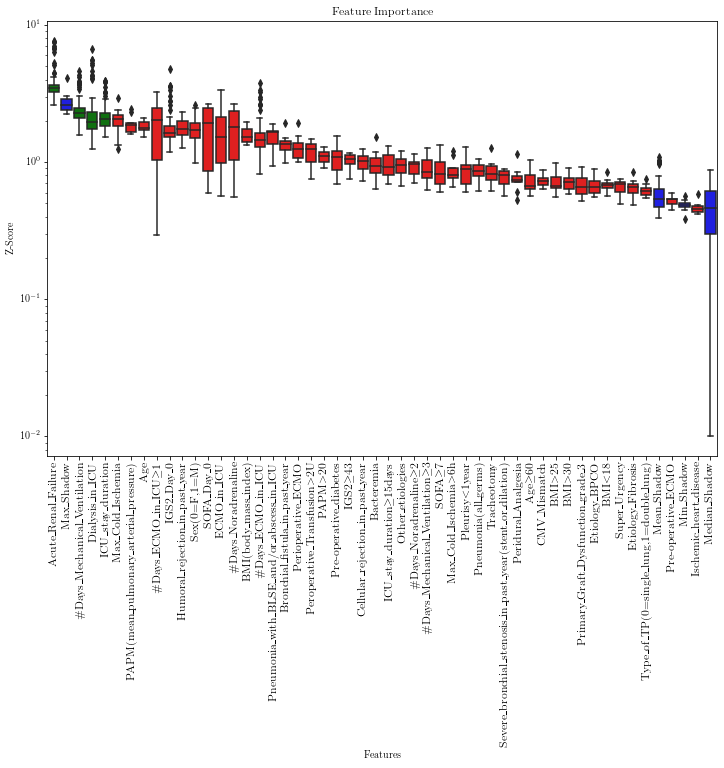

<Figure size 432x288 with 0 Axes>

In [237]:
# Patient_XXX of features
Feature_Selector.plot(X_size=12, figsize=(12,8),
            y_scale='log', which_features='all')
plt.savefig('Y1risk_GP_BorutaS_RanFor.pdf', dpi=300, bbox_inches='tight')

In [118]:
from catboost import CatBoostClassifier
model = CatBoostClassifier()

# no model selected default is Patient_XXX, if classification is False it is a Regression problem
Feature_Selector = BorutaShap(model=model,
                              importance_measure='shap',
                              classification=True)

Feature_Selector.fit(X=X, y=y, n_trials=300, random_state=0)

  0%|          | 0/300 [00:00<?, ?it/s]

6 attributes confirmed important: ['Sex(0=F,1=M)', 'PAPM$>$20', 'IGS2_Day_0', '\\#Days_Mechanical_Ventilation', 'Acute_Renal_Failure', 'Peroperative_Transfusion$>$2U']
42 attributes confirmed unimportant: ['BMI(body_mass_index)', 'Bronchial_fistula_in_past_year', 'Age$\\geq$60', 'Max_Cold_Ischemia', 'SOFA$\\geq$7', 'BMI$>$30', 'Etiology_Fibrosis', 'Severe_bronchial_stenosis_in_past_year(stent_or_dilation)', 'Humoral_rejection_in_past_year', 'Pneumonia(all_germs)', 'Pre-operative_diabetes', '\\#Days_Noradrenaline$\\geq$2', '\\#Days_ECMO_in_ICU$\\geq$1', 'ICU_stay_duration', '\\#Days_ECMO_in_ICU', 'Pleurisy$<$1year', 'ECMO_in_ICU', 'IGS2$\\geq$43', 'Pre-operative_ECMO', '\\#Days_Noradrenaline', 'Perioperative_ECMO', 'Type_of_TP(0=single_lung,1=double_lung)', 'Primary_Graft_Dysfunction_grade_3', 'Max_Cold_Ischemia$>$6h', 'PAPM(mean_pulmonary_arterial_pressure)', 'Peridural_Analgesia', 'Dialysis_in_ICU', 'Bacteremia', 'CMV_Mismatch', 'Cellular_rejection_in_past_year', 'Pneumonia_with_BLSE_

In [239]:
Feature_Selector.TentativeRoughFix()

0 tentative features are now accepted: []
0 tentative features are now rejected: []


<Figure size 432x288 with 0 Axes>

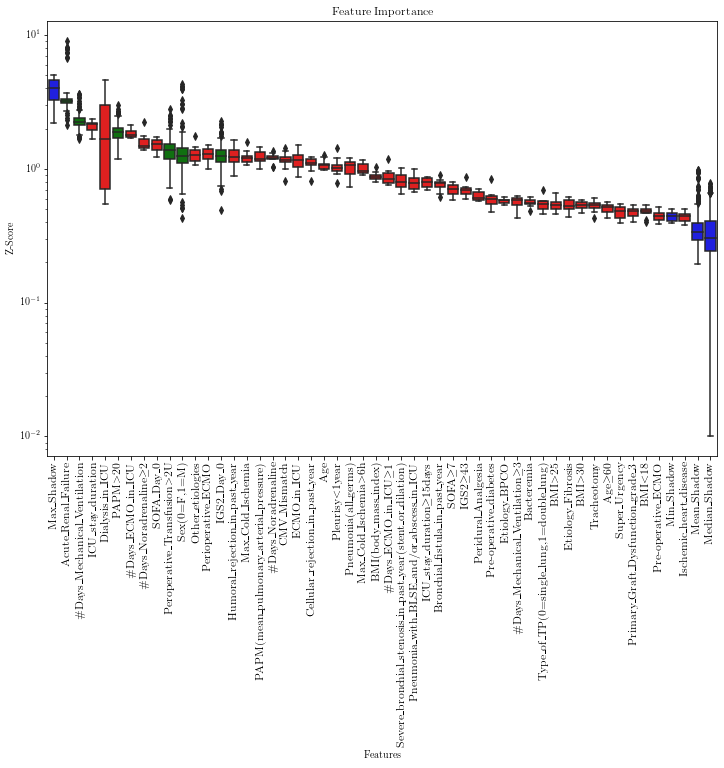

In [240]:
# Patient_XXX of features
fig=plt.gcf()
Feature_Selector.plot(X_size=12, figsize=(12,8),
            y_scale='log', which_features='all')
fig.savefig('Y1risk_GP_BorutaS_CatBoost_300trials.pdf', dpi=300, bbox_inches='tight')

In [387]:
from lightgbm import LGBMClassifier
lgbm_model =LGBMClassifier(n_estimators=5000, min_child_samples=80, random_state=1307)
#lgbm_model.fit(X_train.values, y_train)

# no model selected default is Patient_XXX, if classification is False it is a Regression problem
Feature_Selector = BorutaShap(model=lgbm_model,
                              importance_measure='shap',
                              classification=True)
import re
X = X.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))

Feature_Selector.fit(X=X, y=y, n_trials=100, random_state=0)

  0%|          | 0/100 [00:00<?, ?it/s]

2 attributes confirmed important: ['IGS2_Day_0', 'Days_Mechanical_Ventilation']
45 attributes confirmed unimportant: ['Dialysis_in_ICU', 'Pleurisy1year', 'Severe_bronchial_stenosis_in_past_yearstent_or_dilation', 'Super_Urgency', 'PAPM20', 'Type_of_TP0single_lung1double_lung', 'Days_ECMO_in_ICU1', 'Peridural_Analgesia', 'BMI18', 'CMV_Mismatch', 'SOFA_Day_0', 'Preoperative_diabetes', 'Sex0F1M', 'ICU_stay_duration15days', 'Days_Mechanical_Ventilation3', 'IGS243', 'BMI25', 'Cellular_rejection_in_past_year', 'ECMO_in_ICU', 'Pneumoniaall_germs', 'Other_etiologies', 'Etiology_Fibrosis', 'BMI30', 'Bacteremia', 'PAPMmean_pulmonary_arterial_pressure', 'Age60', 'BMIbody_mass_index', 'Peroperative_Transfusion2U', 'Preoperative_ECMO', 'Perioperative_ECMO', 'Humoral_rejection_in_past_year', 'Max_Cold_Ischemia', 'Days_Noradrenaline2', 'Tracheotomy', 'Acute_Renal_Failure', 'Primary_Graft_Dysfunction_grade_3', 'SOFA7', 'Days_ECMO_in_ICU', 'Bronchial_fistula_in_past_year', 'Ischemic_heart_disease', 'Da

1 tentative features are now accepted: ['Age']
0 tentative features are now rejected: []


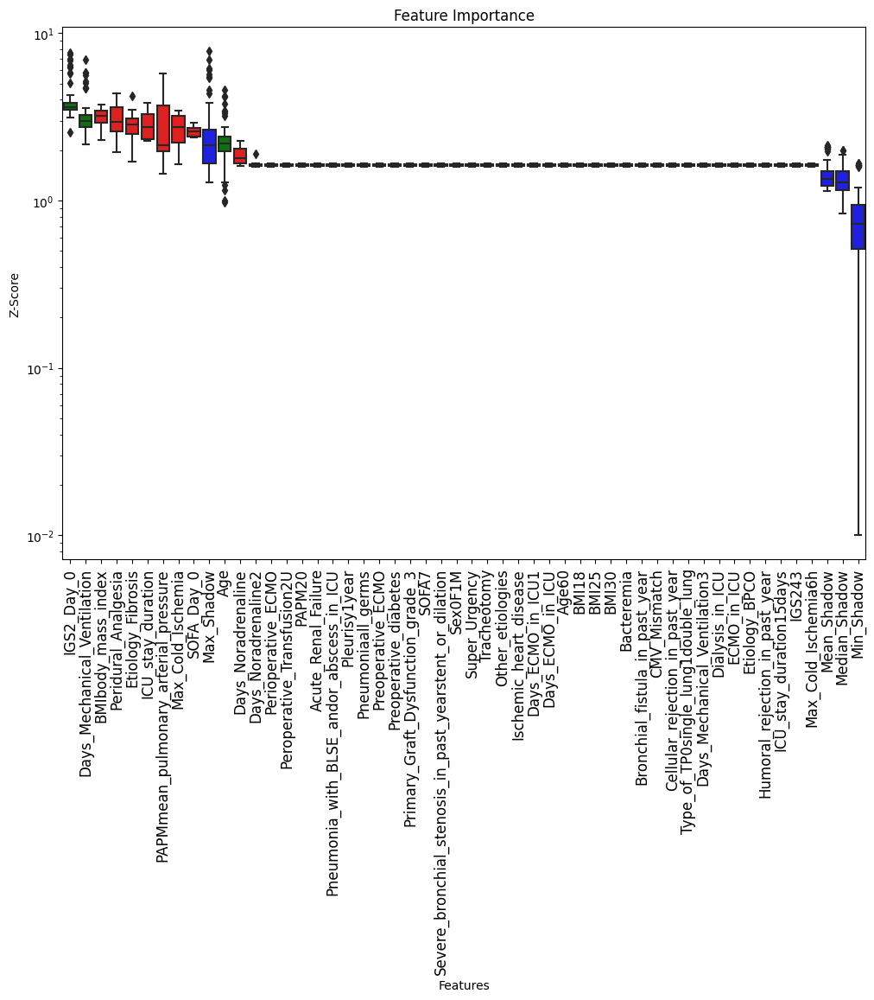

<Figure size 640x480 with 0 Axes>

In [390]:
Feature_Selector.TentativeRoughFix()
# Patient_XXX of features
Feature_Selector.plot(X_size=12, figsize=(12,8),
            y_scale='log', which_features='all')
plt.savefig('Y1risk_GP_BorutaS_lightgbm_100trials.pdf', dpi=300, bbox_inches='tight')

In [119]:
import shap
shap.initjs()

In [120]:
from sklearn.model_selection import train_test_split
X_train_S, X_valid_S, labels_train_S, labels_valid_S = train_test_split(df2_standard_scale.iloc[:,0:48], y, test_size = 0.2, random_state=1234)

In [121]:
X_valid_S.shape

(51, 48)

In [122]:
#MLP is not still permitted since it's no a decision tree-like algorithm
catb_model = CatBoostClassifier(random_state=42)
catb_model.fit(X_train_S, labels_train_S)
# The SHAP Values
import shap
explainer = shap.Explainer(catb_model)
shap_values = explainer(X_valid_S)
shap_values_0 = explainer.shap_values(X_valid_S)

Learning rate set to 0.005193
0:	learn: 0.6904008	total: 6.58ms	remaining: 6.57s
1:	learn: 0.6869992	total: 10.1ms	remaining: 5.03s
2:	learn: 0.6836288	total: 13.2ms	remaining: 4.4s
3:	learn: 0.6810267	total: 17.3ms	remaining: 4.31s
4:	learn: 0.6774521	total: 21ms	remaining: 4.18s
5:	learn: 0.6744500	total: 23.4ms	remaining: 3.87s
6:	learn: 0.6715365	total: 25.9ms	remaining: 3.67s
7:	learn: 0.6681170	total: 30ms	remaining: 3.72s
8:	learn: 0.6642461	total: 32.9ms	remaining: 3.62s
9:	learn: 0.6613808	total: 35.3ms	remaining: 3.49s
10:	learn: 0.6577116	total: 37.7ms	remaining: 3.39s
11:	learn: 0.6552065	total: 40.8ms	remaining: 3.36s
12:	learn: 0.6521406	total: 43.4ms	remaining: 3.29s
13:	learn: 0.6491760	total: 45.9ms	remaining: 3.23s
14:	learn: 0.6459839	total: 48.5ms	remaining: 3.18s
15:	learn: 0.6433880	total: 51.1ms	remaining: 3.14s
16:	learn: 0.6406446	total: 53.3ms	remaining: 3.08s
17:	learn: 0.6381271	total: 55.8ms	remaining: 3.05s
18:	learn: 0.6359441	total: 59.3ms	remaining: 3.0

209:	learn: 0.3603906	total: 571ms	remaining: 2.15s
210:	learn: 0.3596055	total: 574ms	remaining: 2.15s
211:	learn: 0.3588431	total: 576ms	remaining: 2.14s
212:	learn: 0.3585031	total: 577ms	remaining: 2.13s
213:	learn: 0.3573565	total: 579ms	remaining: 2.13s
214:	learn: 0.3567155	total: 582ms	remaining: 2.13s
215:	learn: 0.3556417	total: 585ms	remaining: 2.12s
216:	learn: 0.3551429	total: 587ms	remaining: 2.12s
217:	learn: 0.3544428	total: 589ms	remaining: 2.11s
218:	learn: 0.3538178	total: 592ms	remaining: 2.11s
219:	learn: 0.3529699	total: 597ms	remaining: 2.11s
220:	learn: 0.3525770	total: 599ms	remaining: 2.11s
221:	learn: 0.3517962	total: 602ms	remaining: 2.11s
222:	learn: 0.3510431	total: 604ms	remaining: 2.1s
223:	learn: 0.3501075	total: 607ms	remaining: 2.1s
224:	learn: 0.3494743	total: 610ms	remaining: 2.1s
225:	learn: 0.3485807	total: 612ms	remaining: 2.1s
226:	learn: 0.3478694	total: 614ms	remaining: 2.09s
227:	learn: 0.3472944	total: 616ms	remaining: 2.09s
228:	learn: 0.34

393:	learn: 0.2591741	total: 950ms	remaining: 1.46s
394:	learn: 0.2585956	total: 952ms	remaining: 1.46s
395:	learn: 0.2583503	total: 955ms	remaining: 1.46s
396:	learn: 0.2579277	total: 957ms	remaining: 1.45s
397:	learn: 0.2576427	total: 960ms	remaining: 1.45s
398:	learn: 0.2573222	total: 963ms	remaining: 1.45s
399:	learn: 0.2568718	total: 965ms	remaining: 1.45s
400:	learn: 0.2563533	total: 968ms	remaining: 1.45s
401:	learn: 0.2560222	total: 970ms	remaining: 1.44s
402:	learn: 0.2557482	total: 973ms	remaining: 1.44s
403:	learn: 0.2554924	total: 975ms	remaining: 1.44s
404:	learn: 0.2552027	total: 977ms	remaining: 1.44s
405:	learn: 0.2549522	total: 981ms	remaining: 1.44s
406:	learn: 0.2545787	total: 983ms	remaining: 1.43s
407:	learn: 0.2543101	total: 985ms	remaining: 1.43s
408:	learn: 0.2540362	total: 986ms	remaining: 1.43s
409:	learn: 0.2535509	total: 988ms	remaining: 1.42s
410:	learn: 0.2533196	total: 990ms	remaining: 1.42s
411:	learn: 0.2529434	total: 992ms	remaining: 1.42s
412:	learn: 

579:	learn: 0.2024815	total: 1.32s	remaining: 960ms
580:	learn: 0.2022221	total: 1.33s	remaining: 958ms
581:	learn: 0.2020524	total: 1.33s	remaining: 955ms
582:	learn: 0.2017267	total: 1.33s	remaining: 953ms
583:	learn: 0.2013201	total: 1.33s	remaining: 950ms
584:	learn: 0.2010841	total: 1.33s	remaining: 947ms
585:	learn: 0.2007810	total: 1.34s	remaining: 945ms
586:	learn: 0.2006829	total: 1.34s	remaining: 942ms
587:	learn: 0.2004287	total: 1.34s	remaining: 939ms
588:	learn: 0.2001985	total: 1.34s	remaining: 937ms
589:	learn: 0.2000199	total: 1.34s	remaining: 934ms
590:	learn: 0.1996391	total: 1.35s	remaining: 932ms
591:	learn: 0.1991485	total: 1.35s	remaining: 929ms
592:	learn: 0.1988066	total: 1.35s	remaining: 927ms
593:	learn: 0.1985041	total: 1.35s	remaining: 925ms
594:	learn: 0.1982742	total: 1.36s	remaining: 923ms
595:	learn: 0.1981815	total: 1.36s	remaining: 921ms
596:	learn: 0.1979463	total: 1.36s	remaining: 921ms
597:	learn: 0.1976594	total: 1.37s	remaining: 919ms
598:	learn: 

807:	learn: 0.1547761	total: 1.9s	remaining: 452ms
808:	learn: 0.1546330	total: 1.9s	remaining: 449ms
809:	learn: 0.1543771	total: 1.9s	remaining: 447ms
810:	learn: 0.1542758	total: 1.91s	remaining: 444ms
811:	learn: 0.1540950	total: 1.91s	remaining: 442ms
812:	learn: 0.1539508	total: 1.91s	remaining: 439ms
813:	learn: 0.1537608	total: 1.91s	remaining: 437ms
814:	learn: 0.1537275	total: 1.91s	remaining: 434ms
815:	learn: 0.1535450	total: 1.91s	remaining: 432ms
816:	learn: 0.1533619	total: 1.92s	remaining: 429ms
817:	learn: 0.1532676	total: 1.92s	remaining: 427ms
818:	learn: 0.1530631	total: 1.92s	remaining: 425ms
819:	learn: 0.1530242	total: 1.93s	remaining: 423ms
820:	learn: 0.1529159	total: 1.93s	remaining: 420ms
821:	learn: 0.1526470	total: 1.93s	remaining: 418ms
822:	learn: 0.1524187	total: 1.93s	remaining: 416ms
823:	learn: 0.1522231	total: 1.94s	remaining: 414ms
824:	learn: 0.1519244	total: 1.94s	remaining: 411ms
825:	learn: 0.1518417	total: 1.94s	remaining: 409ms
826:	learn: 0.1

988:	learn: 0.1253779	total: 2.28s	remaining: 25.4ms
989:	learn: 0.1252170	total: 2.28s	remaining: 23.1ms
990:	learn: 0.1251096	total: 2.29s	remaining: 20.8ms
991:	learn: 0.1249425	total: 2.29s	remaining: 18.4ms
992:	learn: 0.1247738	total: 2.29s	remaining: 16.1ms
993:	learn: 0.1246115	total: 2.29s	remaining: 13.8ms
994:	learn: 0.1243577	total: 2.29s	remaining: 11.5ms
995:	learn: 0.1242118	total: 2.29s	remaining: 9.21ms
996:	learn: 0.1240390	total: 2.3s	remaining: 6.91ms
997:	learn: 0.1238633	total: 2.3s	remaining: 4.61ms
998:	learn: 0.1237478	total: 2.3s	remaining: 2.3ms
999:	learn: 0.1236349	total: 2.3s	remaining: 0us


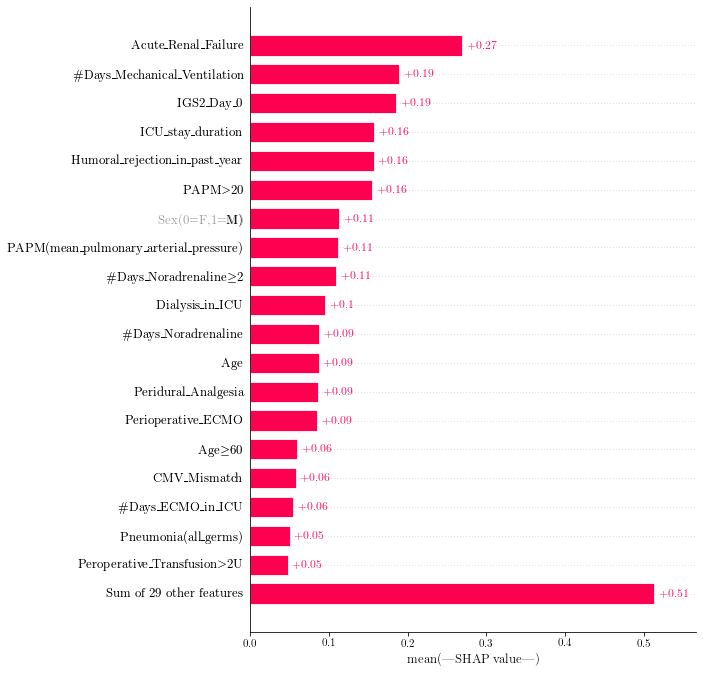

In [123]:
fig=plt.gcf()
shap.plots.bar(shap_values, max_display=20) # default is max_display=12
#plt.style.use("cyberpunk")
fig.savefig('topo_MLP_shap_plots_bar_top20.pdf', dpi=300, bbox_inches='tight')

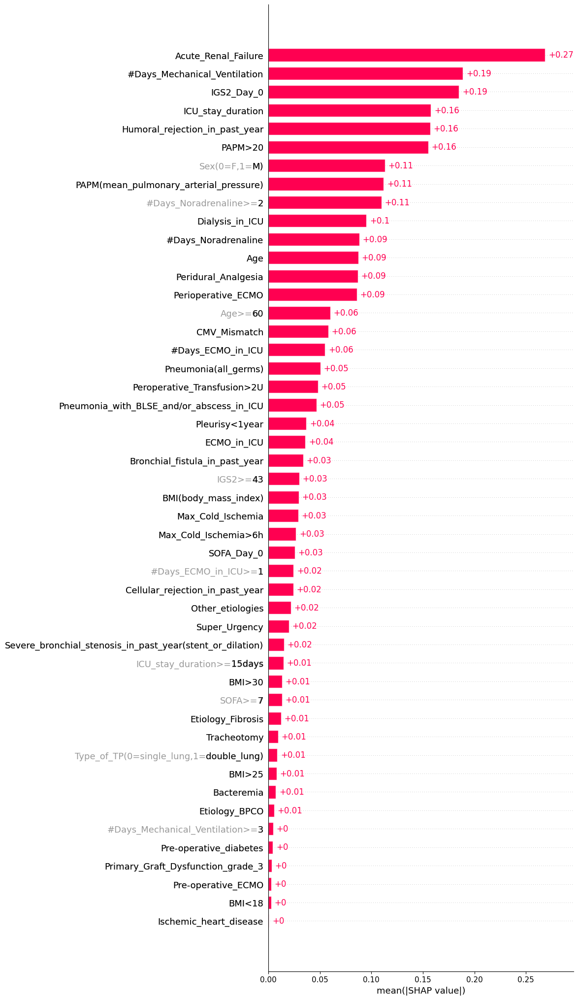

In [396]:
fig=plt.gcf()
shap.plots.bar(shap_values, max_display=50) # default is max_display=12
#plt.style.use("cyberpunk")
fig.savefig('topo_MLP_shap_plots_bar_all.pdf', dpi=300, bbox_inches='tight')

In [397]:
#shap_valuesT = shap_values.values

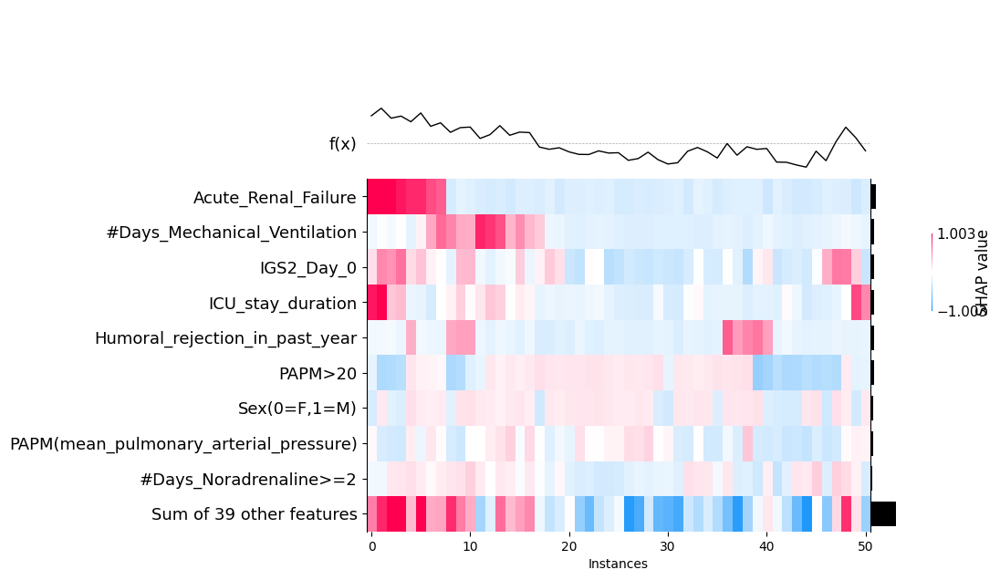

In [398]:
fig=plt.gcf()
shap.plots.heatmap(shap_values[0:100])
plt.style.use('default')
#plt.show()
fig.savefig('topo_MLP_shap_plots_heatmap_top10.pdf', dpi=300, bbox_inches='tight')

In [399]:
help(shap.plots.heatmap)

Help on function heatmap in module shap.plots._heatmap:

heatmap(shap_values, instance_order=shap.Explanation.hclust, feature_values=shap.Explanation.abs.mean(0), feature_order=None, max_display=10, cmap=<matplotlib.colors.LinearSegmentedColormap object at 0x13311aef0>, show=True)
    Create a heatmap plot of a set of SHAP values.
    
    This plot is designed to show the population substructure of a dataset using supervised
    clustering and a heatmap. Supervised clustering involves clustering data points not by their original
    feature values but by their explanations. By default we cluster using shap.utils.hclust_ordering
    but any clustering can be used to order the samples.
    
    Parameters
    ----------
    shap_values : shap.Explanation
        A multi-row Explanation object that we want to visualize in a cluster ordering.
    
    instance_order : OpChain or numpy.ndarray
        A function that returns a sort ordering given a matrix of SHAP values and an axis, or
   

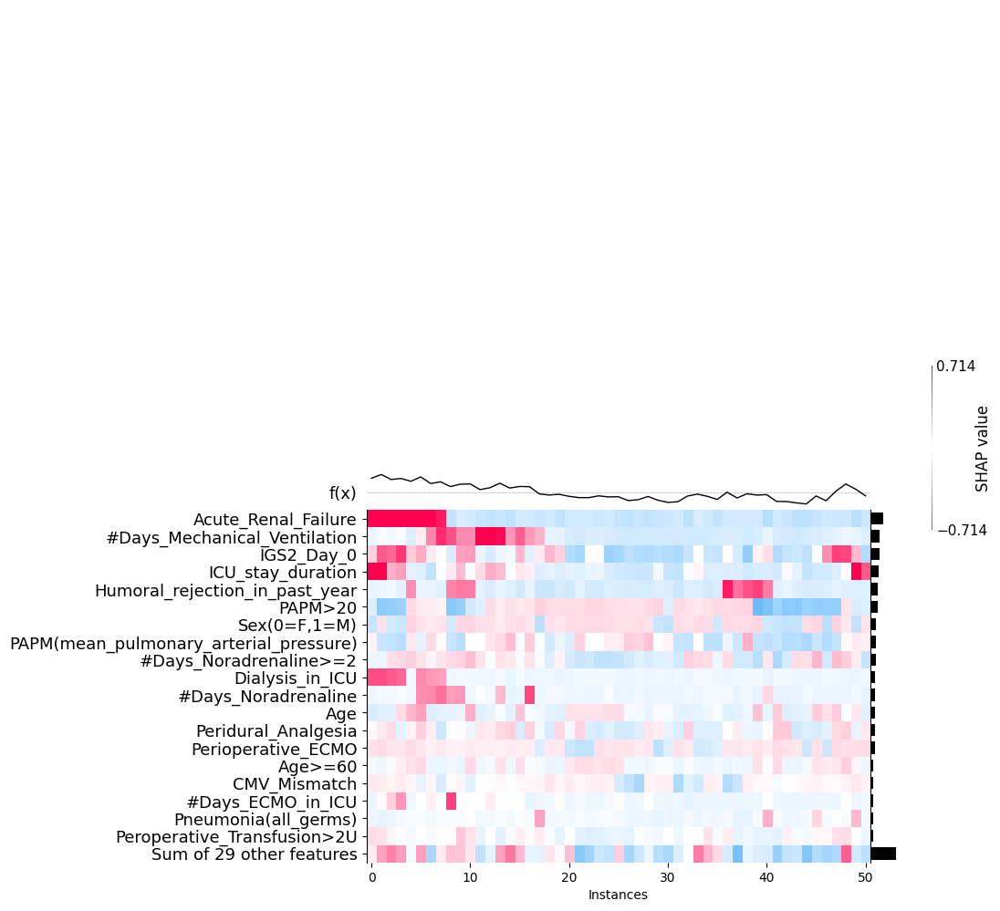

In [400]:
fig=plt.gcf()
shap.plots.heatmap(shap_values[0:100], max_display=20)
plt.style.use('default')
fig.savefig('topo_MLP_shap_plots_heatmap_top20.pdf', dpi=300, bbox_inches='tight')

In [408]:
def catb_shap_transform_scale(original_shap_values, Y_pred, which):
    from scipy.special import expit
    
    #Compute the transformed base value, which consists in applying the logit function to the base value
    from scipy.special import expit #Importing the logit function for the base value transformation
    untransformed_base_value = original_shap_values.base_values[-1]
   
    #Computing the original_explanation_distance to construct the distance_coefficient later on
    original_explanation_distance = np.sum(original_shap_values.values, axis=1)[which]
    
    base_value = expit(untransformed_base_value ) # = 1 / (1+ np.exp(-untransformed_base_value))

    #Computing the distance between the model_prediction and the transformed base_value
    distance_to_explain = Y_pred[which] - base_value

    #The distance_coefficient is the ratio between both distances which will be used later on
    distance_coefficient = original_explanation_distance / distance_to_explain

    #Transforming the original shapley values to the new scale
    shap_values_transformed = original_shap_values / distance_coefficient

    #Finally resetting the base_value as it does not need to be transformed
    shap_values_transformed.base_values = base_value
    shap_values_transformed.data = original_shap_values.data
    
    #Now returning the transformed array
    return shap_values_transformed  

In [412]:
from sklearn.neural_network import MLPClassifier
nn = MLPClassifier(solver='lbfgs', alpha=1e-1, hidden_layer_sizes=(5, 2), random_state=0)
nn.fit(X_train_S, labels_train_S)


# explain all the predictions in the test set
explainer2 = shap.KernelExplainer(nn.predict_proba, X_train_S)
shap_values2 = explainer2.shap_values(X_valid_S)
shap.force_plot(explainer2.expected_value[0], shap_values2[0], X_train_S)

Using 201 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/51 [00:00<?, ?it/s]

In [413]:
X_valid_S.columns


Index(['Age', 'Age>=60', 'Sex(0=F,1=M)', 'BMI(body_mass_index)', 'BMI<18',
       'BMI>30', 'BMI>25', 'Ischemic_heart_disease', 'Pre-operative_diabetes',
       'PAPM(mean_pulmonary_arterial_pressure)', 'PAPM>20', 'Etiology_BPCO',
       'Etiology_Fibrosis', 'Other_etiologies', 'CMV_Mismatch',
       'Pre-operative_ECMO', 'Super_Urgency',
       'Type_of_TP(0=single_lung,1=double_lung)', 'Max_Cold_Ischemia',
       'Max_Cold_Ischemia>6h', 'Peridural_Analgesia', 'Perioperative_ECMO',
       'Peroperative_Transfusion>2U', 'SOFA_Day_0', 'SOFA>=7', 'IGS2_Day_0',
       'IGS2>=43', '#Days_Noradrenaline', '#Days_Noradrenaline>=2',
       '#Days_Mechanical_Ventilation', '#Days_Mechanical_Ventilation>=3',
       'ECMO_in_ICU', '#Days_ECMO_in_ICU', '#Days_ECMO_in_ICU>=1',
       'Primary_Graft_Dysfunction_grade_3', 'Acute_Renal_Failure',
       'Dialysis_in_ICU', 'Bacteremia', 'Pneumonia(all_germs)',
       'Pneumonia_with_BLSE_and/or_abscess_in_ICU', 'Tracheotomy',
       'Severe_bronchial_ste

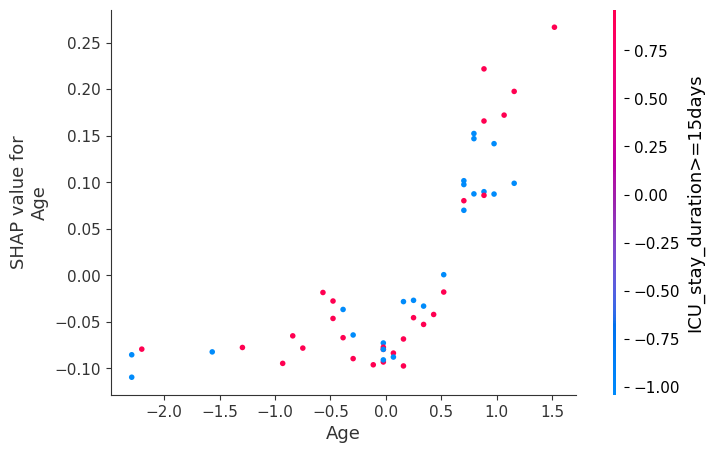

In [414]:
#fig = plt.figure(tight_layout=True, figsize=(10,7))
#spec = gridspec.GridSpec(ncols=1, nrows=1, figure=fig)
#ax = fig.add_subplot(spec[0, 0])

shap.dependence_plot("Age", shap_values_0, X_valid_S, show=True)
#ax.yaxis.label.set_color('white')          #setting up Y-axis label color to blue
#ax.xaxis.label.set_color('white')          #setting up Y-axis label color to blue
#ax.tick_params(axis='x', colors='white')    #setting up X-axis tick color to red
#ax.tick_params(axis='y', colors='white')    #setting up X-axis tick color to red
#plt.tight_layout()

In [204]:
import pickle
RI_dict = pickle.load(open("./NHANES_reference_interval_dict.pkl", "rb"))

In [205]:
RI_dict

{'Laboratory_AlanineAminotransferaseALT': {'Display_Name': 'Alanine aminotransferase ALT (IU/L)',
  'Unit': 'IU/L',
  'No_RI': 0,
  'RI_gender': 1,
  'RI_all': None,
  'RI_male': '7-55',
  'RI_female': '7-45',
  'RI_URL': 'https://www.mayocliniclabs.com/test-catalog/Clinical+and+Interpretive/8362',
  'Notes': None,
  'NHANES_Name': 'LBXSATSI',
  'URL': 'https://wwwn.cdc.gov/Nchs/Nhanes/2013-2014/BIOPRO_H.htm#LBXSATSI'},
 'Laboratory_AlbuminSI': {'Display_Name': 'Albumin, serum (g/L)',
  'Unit': 'g/L',
  'No_RI': 0,
  'RI_gender': 0,
  'RI_all': '35-50',
  'RI_male': None,
  'RI_female': None,
  'RI_URL': 'https://www.mayocliniclabs.com/test-catalog/Clinical+and+Interpretive/610525',
  'Notes': None,
  'NHANES_Name': 'LBDSALSI',
  'URL': 'https://wwwn.cdc.gov/Nchs/Nhanes/2013-2014/BIOPRO_H.htm#LBDSALSI'},
 'Laboratory_AspartateAminotransferaseAST': {'Display_Name': 'Aspartate aminotransferase AST (IU/L)',
  'Unit': 'IU/L',
  'No_RI': 0,
  'RI_gender': 1,
  'RI_all': None,
  'RI_male': '

In [267]:
# binary distributions
import scipy.stats as stats

p = 0.86
dist = stats.binom(1, p)

# Find the lower bound
lower_bound = dist.ppf(0.025)
print("Lower bound:", lower_bound)

# Find the upper bound
upper_bound = dist.ppf(0.975)
print("Upper bound:", upper_bound)


Lower bound: 0.0
Upper bound: 1.0


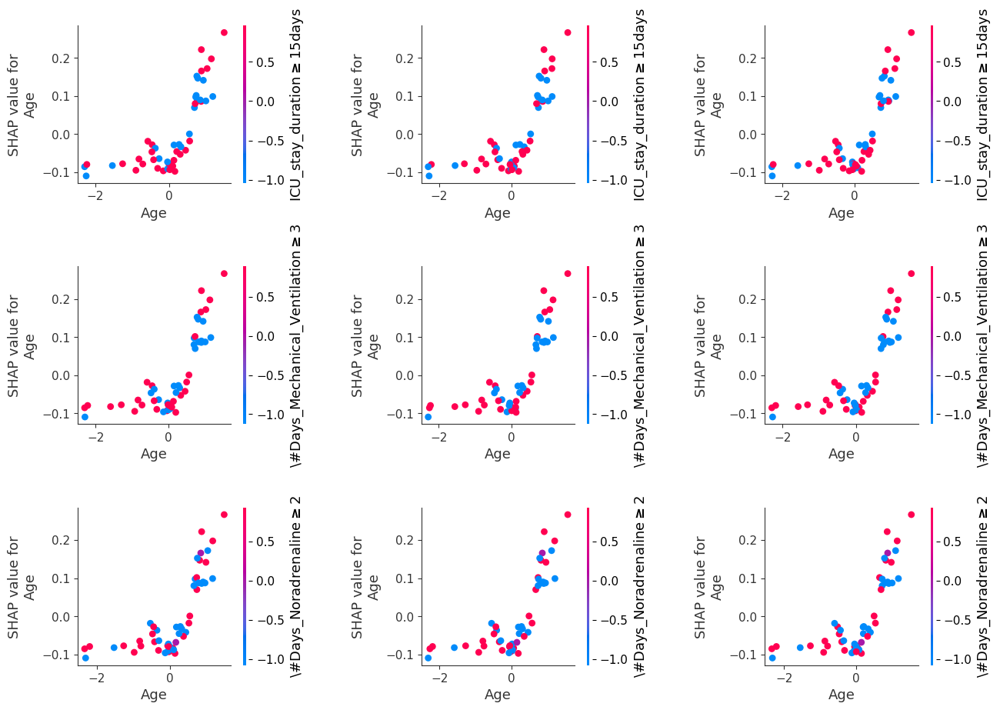

In [214]:
# we can use shap.approximate_interactions to guess which features
# may interact with age
from matplotlib import gridspec
inds = shap.approximate_interactions("Age", shap_values_0, X_valid_S)

# make plots colored by each of the top three possible interacting features
ax = tuple(['ax'+str(x) for x in range(9)])
    
fig = plt.figure(tight_layout=True, figsize=(14,10))
spec = gridspec.GridSpec(ncols=3, nrows=3, figure=fig)

for i in range(3):
    for j in range(3):
      ax = fig.add_subplot(spec[i, j])
      shap.dependence_plot("Age", shap_values_0, X_valid_S, interaction_index=inds[i], 
                          x_jitter=1, dot_size=40, ax=ax, show=False)
    
#fig, ax = plt.subplots(3,3, figsize=(18, 12))

#for i in range(9):
#     shap.dependence_plot("Age", shap_values_0, X_valid_S, interaction_index=inds[i], 
#                          x_jitter=1, ax=ax.flatten()[i], show=False)
plt.rcParams.update({'font.size': 40, "font.weight": "normal"})        

# Save the figure as a PDF file
fig.savefig('shap_interactions_Age.pdf', dpi=300, bbox_inches='tight')

plt.tight_layout()
plt.show()

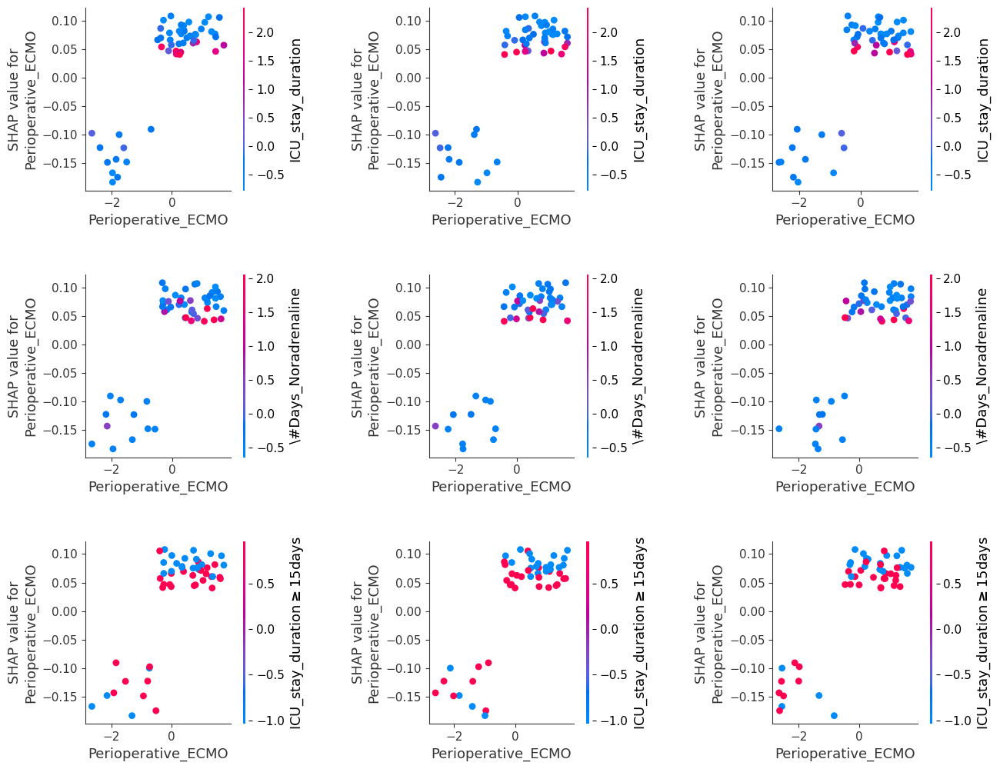

In [215]:
# we can use shap.approximate_interactions to guess which features
# may interact with age
inds = shap.approximate_interactions("Perioperative_ECMO", shap_values_0, X_valid_S)

# make plots colored by each of the top three possible interacting features
ax = tuple(['ax'+str(x) for x in range(9)])
    
fig = plt.figure(tight_layout=True, figsize=(14,11))
spec = gridspec.GridSpec(ncols=3, nrows=3, figure=fig)

for i in range(3):
    for j in range(3):
      ax = fig.add_subplot(spec[i, j])
      shap.dependence_plot("Perioperative_ECMO", shap_values_0, X_valid_S, interaction_index=inds[i], 
                          x_jitter=1, dot_size=40, ax=ax, show=False)
#fig, ax = plt.subplots(3,3, figsize=(17, 12))

#for i in range(9):
#     shap.dependence_plot("ECMO_peropératoire", shap_values_0, X_valid_S, interaction_index=inds[i], 
#                          x_jitter=1, ax=ax.flatten()[i], show=False)
        
plt.rcParams.update({'font.size': 40, "font.weight": "normal"})   

# Save the figure as a PDF file
fig.savefig('shap_interactions_Perioperative_ECMO.pdf', dpi=300, bbox_inches='tight')

plt.tight_layout()
plt.show()

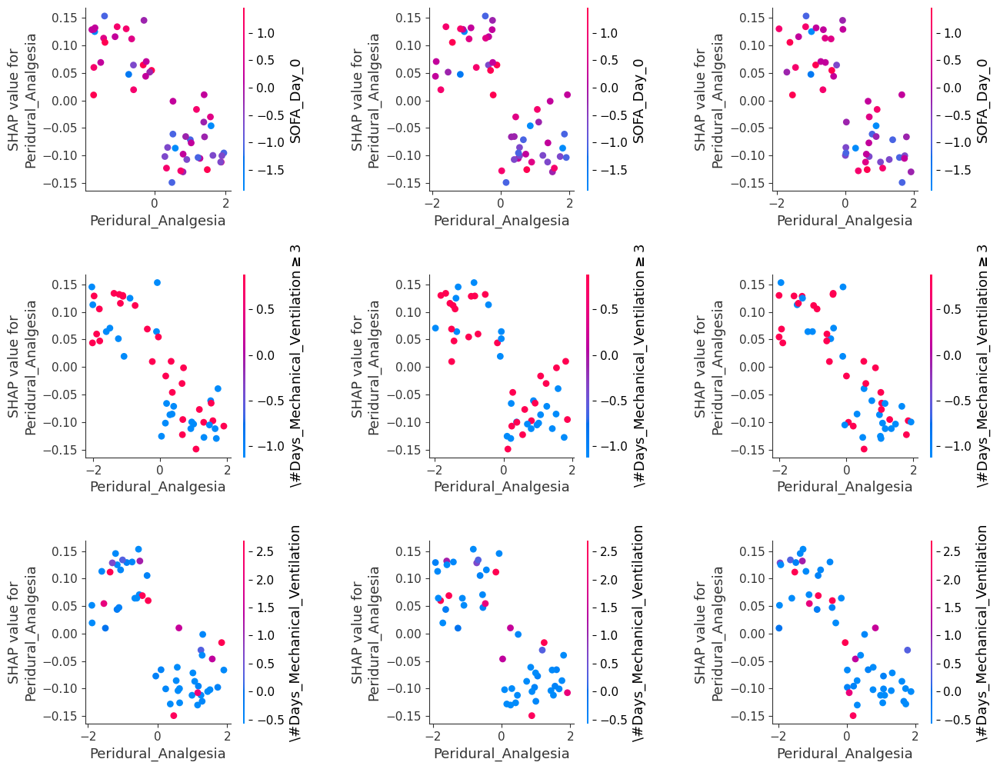

In [216]:
# we can use shap.approximate_interactions to guess which features
# may interact with etiology
inds = shap.approximate_interactions("Peridural_Analgesia", shap_values_0, X_valid_S)

# make plots colored by each of the top three possible interacting features
ax = tuple(['ax'+str(x) for x in range(9)])
    
fig = plt.figure(tight_layout=True, figsize=(14,11))
spec = gridspec.GridSpec(ncols=3, nrows=3, figure=fig)

for i in range(3):
    for j in range(3):
      ax = fig.add_subplot(spec[i, j])
      shap.dependence_plot("Peridural_Analgesia", shap_values_0, X_valid_S, interaction_index=inds[i], 
                          x_jitter=1, dot_size=40, ax=ax, show=False)
#fig, ax = plt.subplots(3,3, figsize=(17, 12))

#for i in range(9):
#     shap.dependence_plot("ECMO_peropératoire", shap_values_0, X_valid_S, interaction_index=inds[i], 
#                          x_jitter=1, ax=ax.flatten()[i], show=False)
        
plt.rcParams.update({'font.size': 40, "font.weight": "normal"})   

# Save the figure as a PDF file
fig.savefig('shap_interactions_Peridural_Analgesia.pdf', dpi=300, bbox_inches='tight')

plt.tight_layout()
plt.show()

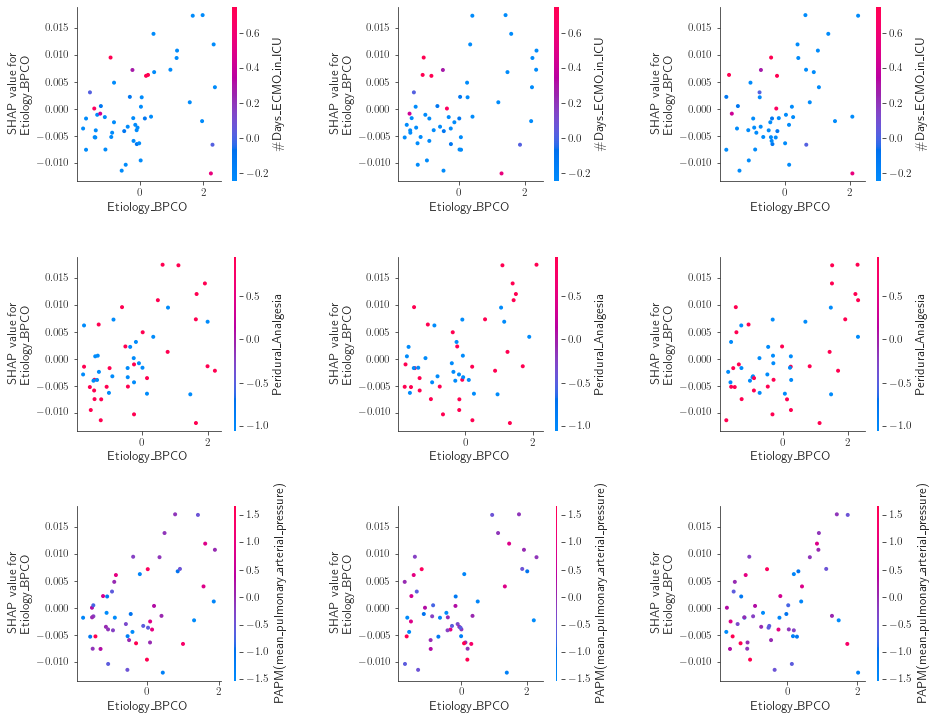

In [632]:
# we can use shap.approximate_interactions to guess which features
# may interact with etiology
inds = shap.approximate_interactions("Etiology_BPCO", shap_values_0, X_valid_S)

# make plots colored by each of the top three possible interacting features
ax = tuple(['ax'+str(x) for x in range(9)])
    
fig = plt.figure(tight_layout=True, figsize=(14,11))
spec = gridspec.GridSpec(ncols=3, nrows=3, figure=fig)

for i in range(3):
    for j in range(3):
      ax = fig.add_subplot(spec[i, j])
      shap.dependence_plot("Etiology_BPCO", shap_values_0, X_valid_S, interaction_index=inds[i], 
                          x_jitter=1, ax=ax, show=False)
#fig, ax = plt.subplots(3,3, figsize=(17, 12))

#for i in range(9):
#     shap.dependence_plot("ECMO_peropératoire", shap_values_0, X_valid_S, interaction_index=inds[i], 
#                          x_jitter=1, ax=ax.flatten()[i], show=False)
        
plt.rcParams.update({'font.size': 40, "font.weight": "bold"})   

# Save the figure as a PDF file
fig.savefig('shap_interactions_Etiology_BPCO.pdf', dpi=300, bbox_inches='tight')

plt.tight_layout()
plt.show()

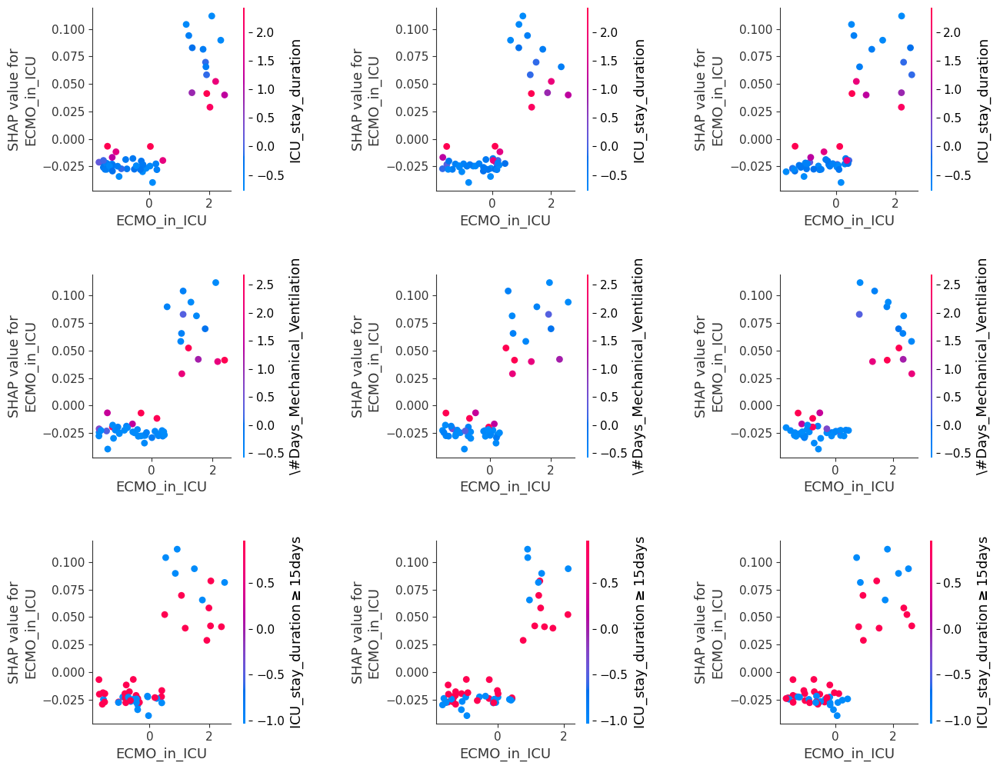

In [217]:
# we can use shap.approximate_interactions to guess which features
# may interact with age
inds = shap.approximate_interactions("ECMO_in_ICU", shap_values_0, X_valid_S)

# make plots colored by each of the top three possible interacting features
ax = tuple(['ax'+str(x) for x in range(9)])
    
fig = plt.figure(tight_layout=True, figsize=(14,11))
spec = gridspec.GridSpec(ncols=3, nrows=3, figure=fig)

for i in range(3):
    for j in range(3):
      ax = fig.add_subplot(spec[i, j])
      shap.dependence_plot("ECMO_in_ICU", shap_values_0, X_valid_S, interaction_index=inds[i], 
                          x_jitter=1, dot_size=40, ax=ax, show=False)

#fig, ax = plt.subplots(3,3, figsize=(16, 9))

#for i in range(9):
#     shap.dependence_plot("ECMO_en_Réanimation", shap_values_0, X_valid_S, interaction_index=inds[i], 
#                          x_jitter=1, ax=ax.flatten()[i], show=False)
        
plt.rcParams.update({'font.size': 40, "font.weight": "normal"})  

# Save the figure as a PDF file
fig.savefig('shap_interactions_ECMO_in_ICU.pdf', dpi=300, bbox_inches='tight')

plt.tight_layout()
plt.show()

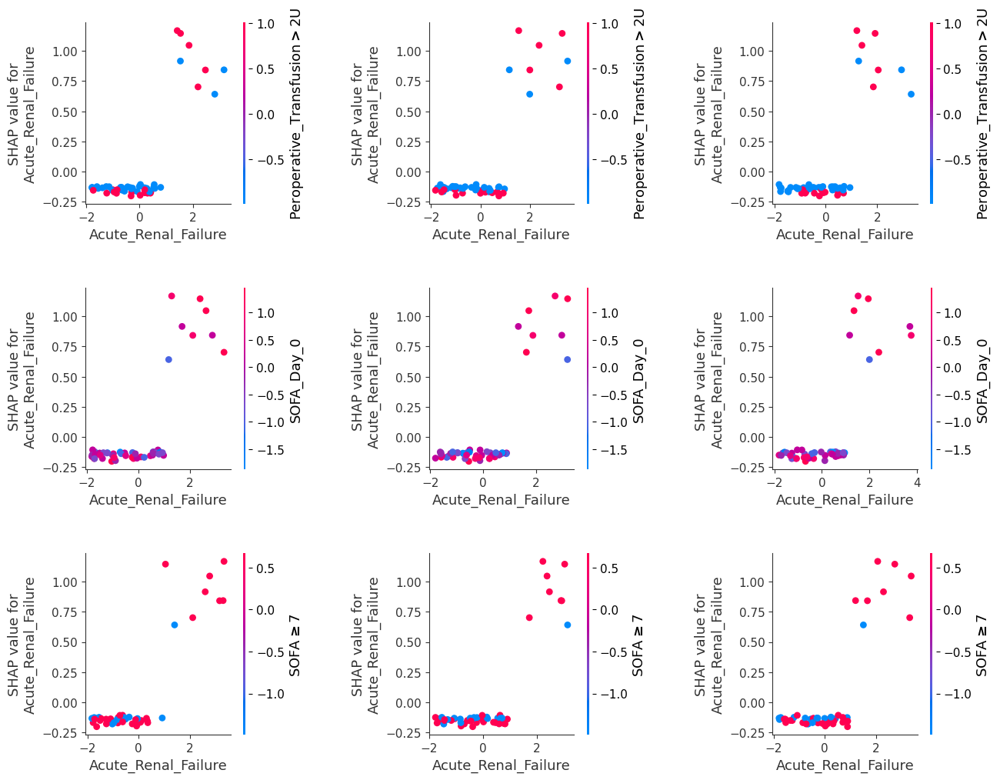

In [218]:
# we can use shap.approximate_interactions to guess which features
# may interact with age
inds = shap.approximate_interactions("Acute_Renal_Failure", shap_values_0, X_valid_S)

# make plots colored by each of the top three possible interacting features
ax = tuple(['ax'+str(x) for x in range(9)])
    
fig = plt.figure(tight_layout=True, figsize=(14,11))
spec = gridspec.GridSpec(ncols=3, nrows=3, figure=fig)

for i in range(3):
    for j in range(3):
      ax = fig.add_subplot(spec[i, j])
      shap.dependence_plot("Acute_Renal_Failure", shap_values_0, X_valid_S, interaction_index=inds[i], 
                          x_jitter=1, dot_size=40, ax=ax, show=False)
    

# Save the figure as a PDF file
fig.savefig('shap_interactions_Acute_Renal_Failure.pdf', dpi=300, bbox_inches='tight')    
        
plt.tight_layout()
plt.show()

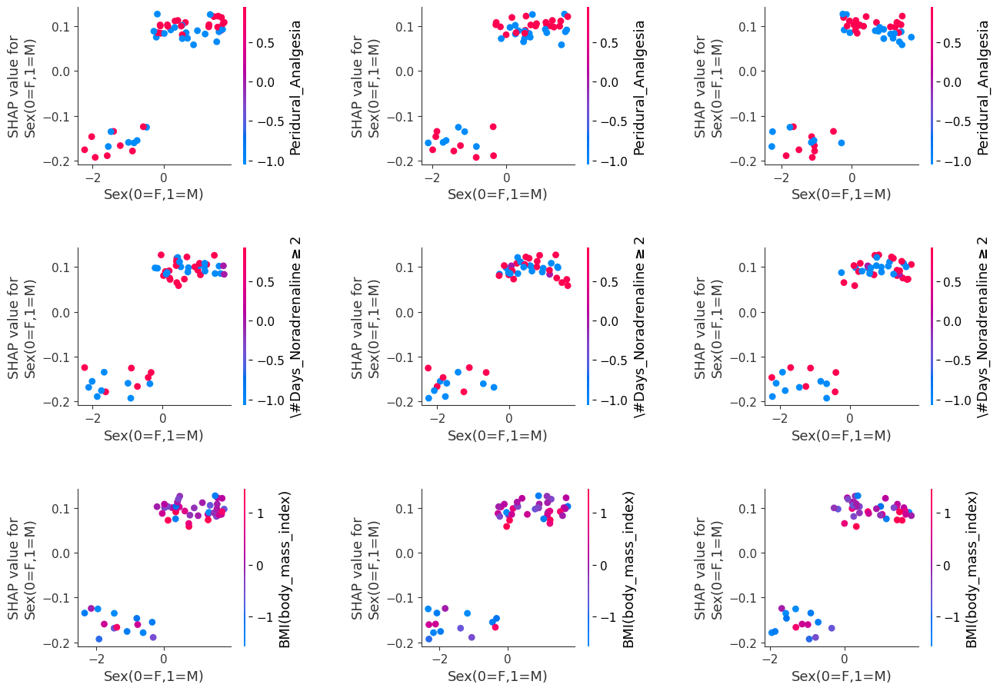

In [219]:
# we can use shap.approximate_interactions to guess which features
# may interact with age
inds = shap.approximate_interactions("Sex(0=F,1=M)", shap_values_0, X_valid_S)

# make plots colored by each of the top three possible interacting features
ax = tuple(['ax'+str(x) for x in range(9)])
    
fig = plt.figure(tight_layout=True, figsize=(14,10))
spec = gridspec.GridSpec(ncols=3, nrows=3, figure=fig)

for i in range(3):
    for j in range(3):
      ax = fig.add_subplot(spec[i, j])
      shap.dependence_plot("Sex(0=F,1=M)", shap_values_0, X_valid_S, interaction_index=inds[i], 
                          x_jitter=1, dot_size=40, ax=ax, show=False)

# Save the figure as a PDF file
fig.savefig('shap_interactions_Sex(0=F,1=M).pdf', dpi=300, bbox_inches='tight')    
       
        
plt.tight_layout()
plt.show()
   


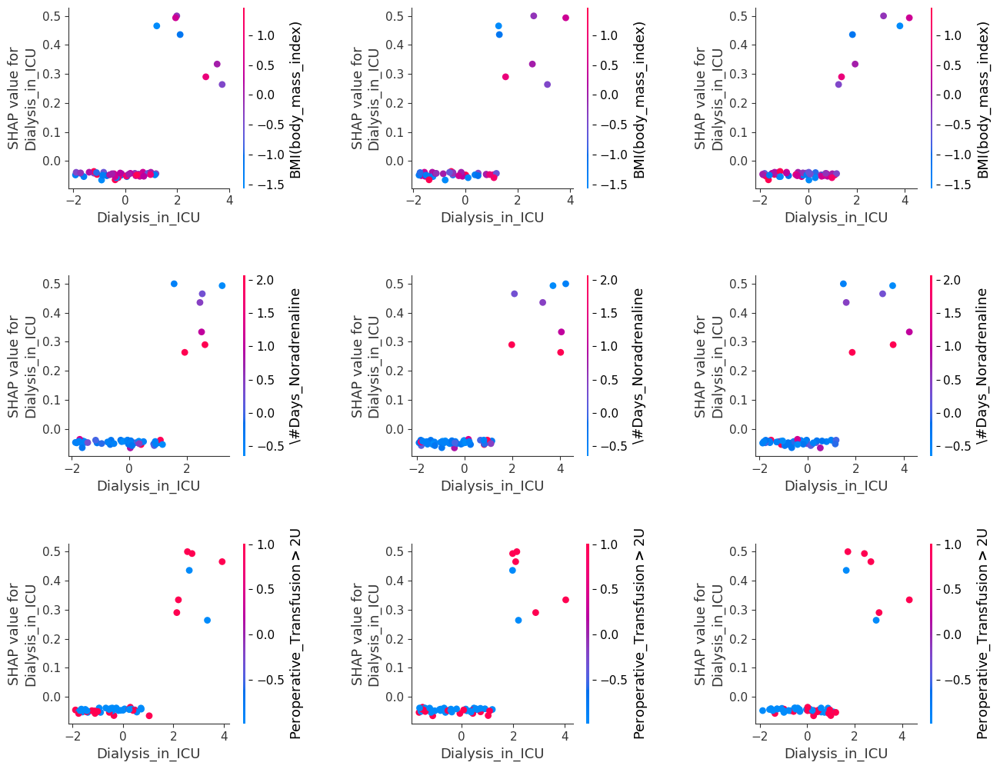

In [220]:
# we can use shap.approximate_interactions to guess which features
# may interact with dialyse
inds = shap.approximate_interactions("Dialysis_in_ICU", shap_values_0, X_valid_S)

# make plots colored by each of the top three possible interacting features
ax = tuple(['ax'+str(x) for x in range(9)])
    
fig = plt.figure(tight_layout=True, figsize=(14,11))
spec = gridspec.GridSpec(ncols=3, nrows=3, figure=fig)

for i in range(3):
    for j in range(3):
      ax = fig.add_subplot(spec[i, j])
      shap.dependence_plot("Dialysis_in_ICU", shap_values_0, X_valid_S, interaction_index=inds[i], 
                          x_jitter=1, dot_size=40, ax=ax, show=False)
    
# Save the figure as a PDF file
fig.savefig('shap_interactions_Dialysis_in_ICU.pdf', dpi=300, bbox_inches='tight')    
       
        
plt.tight_layout()
plt.show()

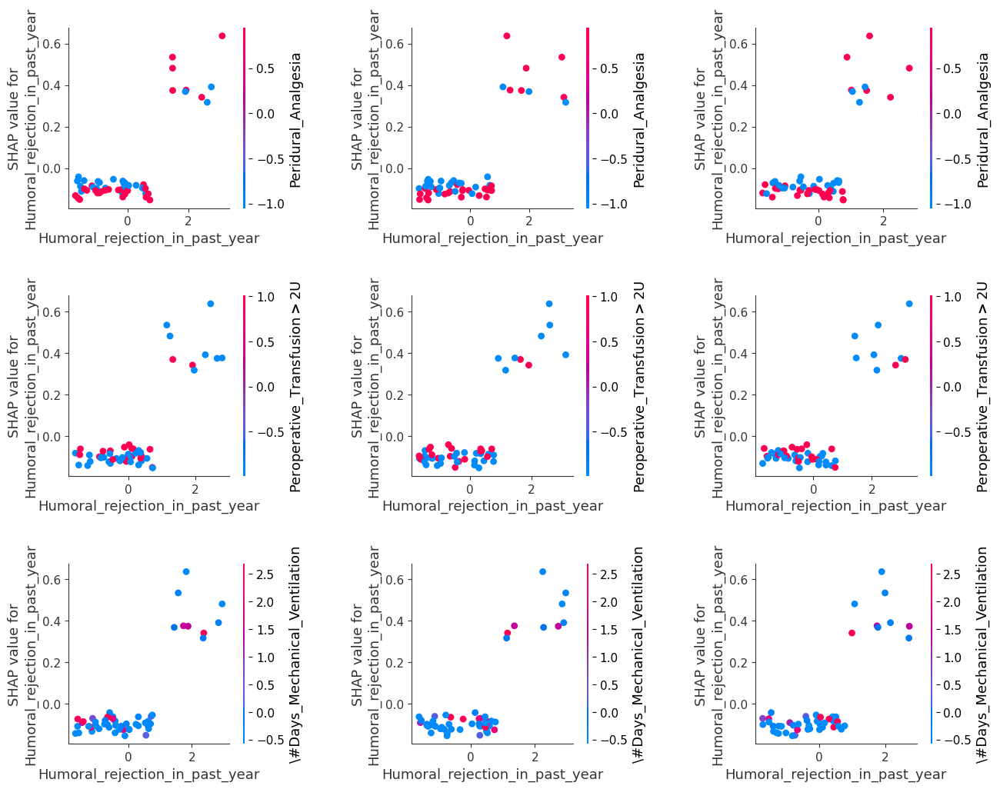

In [221]:
# we can use shap.approximate_interactions to guess which features
# may interact with rejet_humoral_dans_l'année
from matplotlib import gridspec
inds = shap.approximate_interactions("Humoral_rejection_in_past_year", shap_values_0, X_valid_S)

# make plots colored by each of the top three possible interacting features
#ax = tuple(['ax'+str(x) for x in range(9)])
    
#fig, ax = plt.subplots(3,3, figsize=(16, 9))
fig = plt.figure(tight_layout=True, figsize=(14,11))
spec = gridspec.GridSpec(ncols=3, nrows=3, figure=fig)

for i in range(3):
    for j in range(3):
      ax = fig.add_subplot(spec[i, j])
      shap.dependence_plot("Humoral_rejection_in_past_year", shap_values_0, X_valid_S, interaction_index=inds[i], 
                          x_jitter=1, dot_size=40, ax=ax, show=False)
        
# Save the figure as a PDF file
fig.savefig('shap_interactions_Humoral_rejection_in_past_year_2.pdf', dpi=300, bbox_inches='tight')       
        
plt.tight_layout()
plt.show()

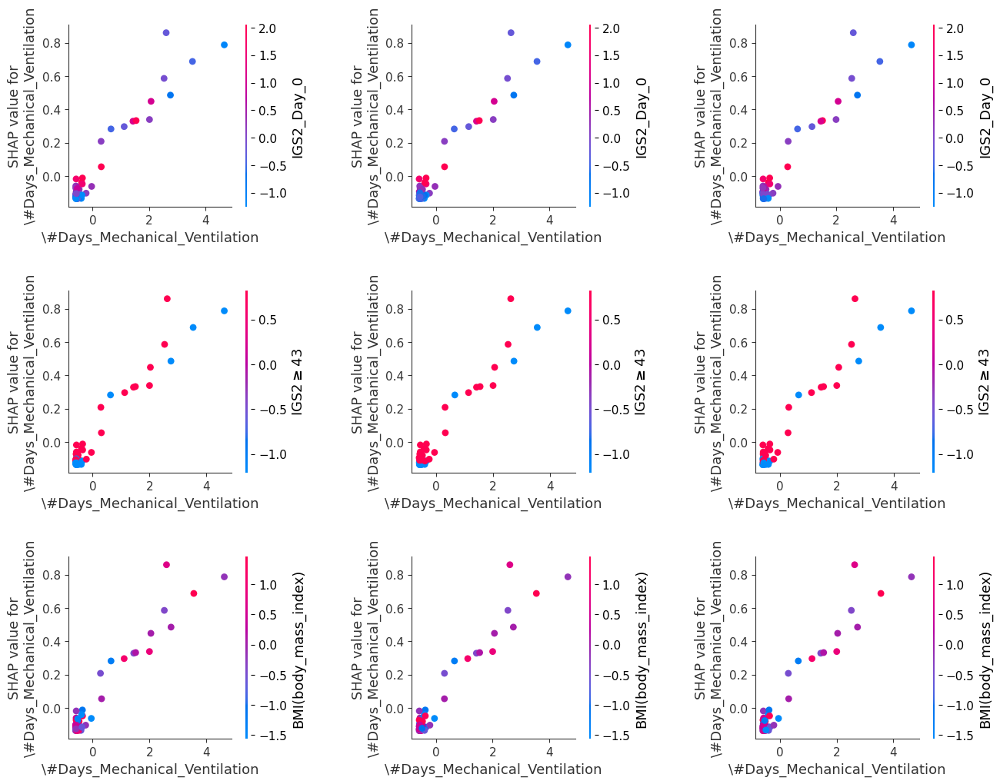

In [224]:
# we can use shap.approximate_interactions to guess which features
# may interact with rejet_humoral_dans_l'année
from matplotlib import gridspec
inds = shap.approximate_interactions("\#Days_Mechanical_Ventilation", shap_values_0, X_valid_S)

# make plots colored by each of the top three possible interacting features
#ax = tuple(['ax'+str(x) for x in range(9)])
    
#fig, ax = plt.subplots(3,3, figsize=(16, 9))
fig = plt.figure(tight_layout=True, figsize=(14,11))
spec = gridspec.GridSpec(ncols=3, nrows=3, figure=fig)

for i in range(3):
    for j in range(3):
      ax = fig.add_subplot(spec[i, j])
      shap.dependence_plot("\#Days_Mechanical_Ventilation", shap_values_0, X_valid_S, interaction_index=inds[i], 
                          x_jitter=1, dot_size=40, ax=ax, show=False)

# Save the figure as a PDF file
fig.savefig('shap_interactions_\#Days_Mechanical_Ventilation_2.pdf', dpi=300, bbox_inches='tight')    
        
plt.tight_layout()
plt.show()

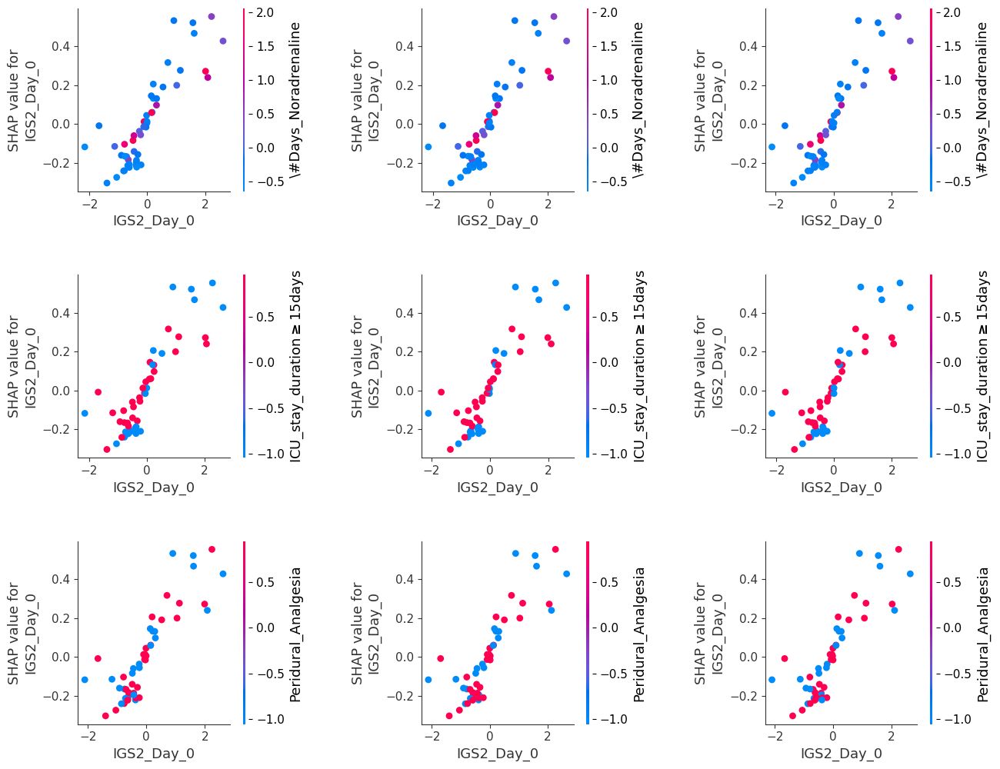

In [225]:
# we can use shap.approximate_interactions to guess which features
# may interact with rejet_humoral_dans_l'année
from matplotlib import gridspec
inds = shap.approximate_interactions("IGS2_Day_0", shap_values_0, X_valid_S)

# make plots colored by each of the top three possible interacting features
#ax = tuple(['ax'+str(x) for x in range(9)])
    
#fig, ax = plt.subplots(3,3, figsize=(16, 9))
fig = plt.figure(tight_layout=True, figsize=(14,11))
spec = gridspec.GridSpec(ncols=3, nrows=3, figure=fig)

for i in range(3):
    for j in range(3):
      ax = fig.add_subplot(spec[i, j])
      shap.dependence_plot("IGS2_Day_0", shap_values_0, X_valid_S, interaction_index=inds[i], 
                          x_jitter=1, dot_size=40, ax=ax, show=False)
        
# Save the figure as a PDF file
fig.savefig('shap_interactions_IGS2_Day_0_2".pdf', dpi=300, bbox_inches='tight')    
        
plt.tight_layout()
plt.show()

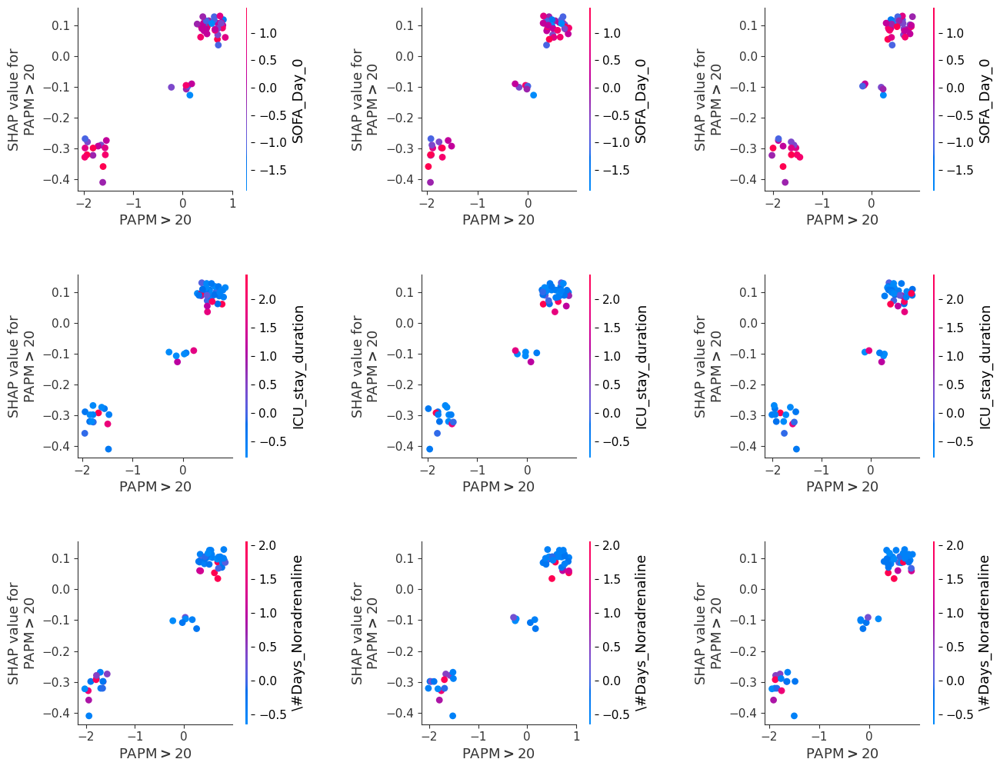

In [226]:
# we can use shap.approximate_interactions to guess which features
# may interact with rejet_humoral_dans_l'année
from matplotlib import gridspec
inds = shap.approximate_interactions("PAPM$>$20", shap_values_0, X_valid_S)

# make plots colored by each of the top three possible interacting features
#ax = tuple(['ax'+str(x) for x in range(9)])
    
#fig, ax = plt.subplots(3,3, figsize=(16, 9))
fig = plt.figure(tight_layout=True, figsize=(14,11))
spec = gridspec.GridSpec(ncols=3, nrows=3, figure=fig)

for i in range(3):
    for j in range(3):
      ax = fig.add_subplot(spec[i, j])
      shap.dependence_plot("PAPM$>$20", shap_values_0, X_valid_S, interaction_index=inds[i], 
                          x_jitter=1, dot_size=40, ax=ax, show=False)
    
# Save the figure as a PDF file
fig.savefig('shap_interactions_PAPM$>$20_2.pdf', dpi=300, bbox_inches='tight')    
        
plt.tight_layout()
plt.show()

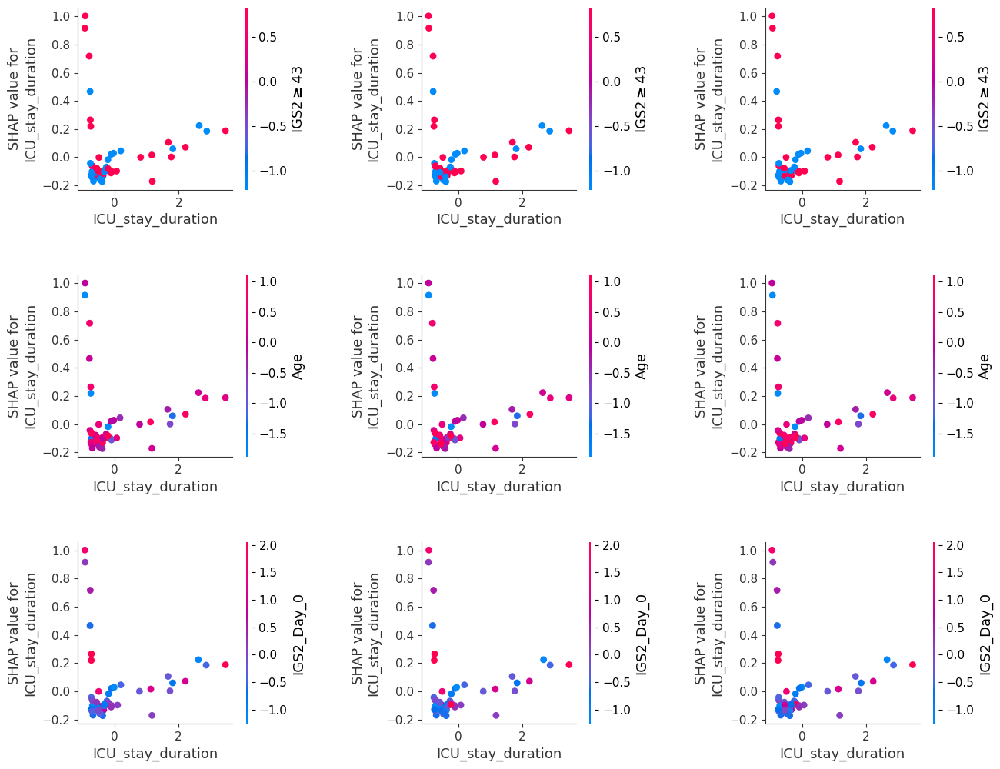

In [227]:
# we can use shap.approximate_interactions to guess which features
# may interact with rejet_humoral_dans_l'année
from matplotlib import gridspec
inds = shap.approximate_interactions("ICU_stay_duration", shap_values_0, X_valid_S)

# make plots colored by each of the top three possible interacting features
#ax = tuple(['ax'+str(x) for x in range(9)])
    
#fig, ax = plt.subplots(3,3, figsize=(16, 9))
fig = plt.figure(tight_layout=True, figsize=(14,11))
spec = gridspec.GridSpec(ncols=3, nrows=3, figure=fig)

for i in range(3):
    for j in range(3):
      ax = fig.add_subplot(spec[i, j])
      shap.dependence_plot("ICU_stay_duration", shap_values_0, X_valid_S, interaction_index=inds[i], 
                          x_jitter=1, dot_size=40, ax=ax, show=False)
 
# Save the figure as a PDF file
fig.savefig('shap_interactions_ICU_stay_duration_2.pdf', dpi=300, bbox_inches='tight')    
        
plt.tight_layout()
plt.show()

This code generates a set of SHAP dependence plots to visualize the approximate interactions between the "ICU_stay_duration" feature and the top three features that may interact with it in a machine learning model.

The SHAP (SHapley Additive exPlanations) library is used to calculate the SHAP values for each feature, which represent the contribution of each feature to the final prediction of the model. The shap_values_0 and X_valid_S variables likely contain the SHAP values and input data used to generate the plots.

The shap.approximate_interactions function is used to estimate the interaction strengths between the "ICU_stay_duration" feature and all the other features in the dataset. The top three features with the strongest interactions are selected, and a set of SHAP dependence plots is generated for each of these three features.

Each plot shows how the "ICU_stay_duration" feature affects the prediction of the model for different values of the selected interacting feature. The interaction effect is represented by the color of the points in the plot, and the vertical position of the points represents the SHAP value of the "ICU_stay_duration" feature. The interaction_index parameter in the shap.dependence_plot function specifies which feature to plot the interaction with.

Finally, the plots are saved as a PDF file named "shap_interactions_ICU_stay_duration.pdf" and displayed on the screen.

The code generates a 3x3 grid of plots, with each row showing the dependence of the model prediction on the "ICU_stay_duration" feature for a different interacting feature. The three columns in each row correspond to the different values of the interacting feature.

For example, if the top three interacting features are "age", "heart rate", and "temperature", then the first row of the plot would show the interaction between "ICU_stay_duration" and "age" in the three columns, where each column represents a different range of ages. The second row would show the interaction between "ICU_stay_duration" and "heart rate" in the three columns, where each column represents a different range of heart rates. The third row would show the interaction between "ICU_stay_duration" and "temperature" in the three columns, where each column represents a different range of temperatures.

In each plot, the y-axis represents the SHAP value for "ICU_stay_duration", while the x-axis represents the values of the interacting feature. The color of the points in the plot represents the interaction effect between "ICU_stay_duration" and the corresponding interacting feature.

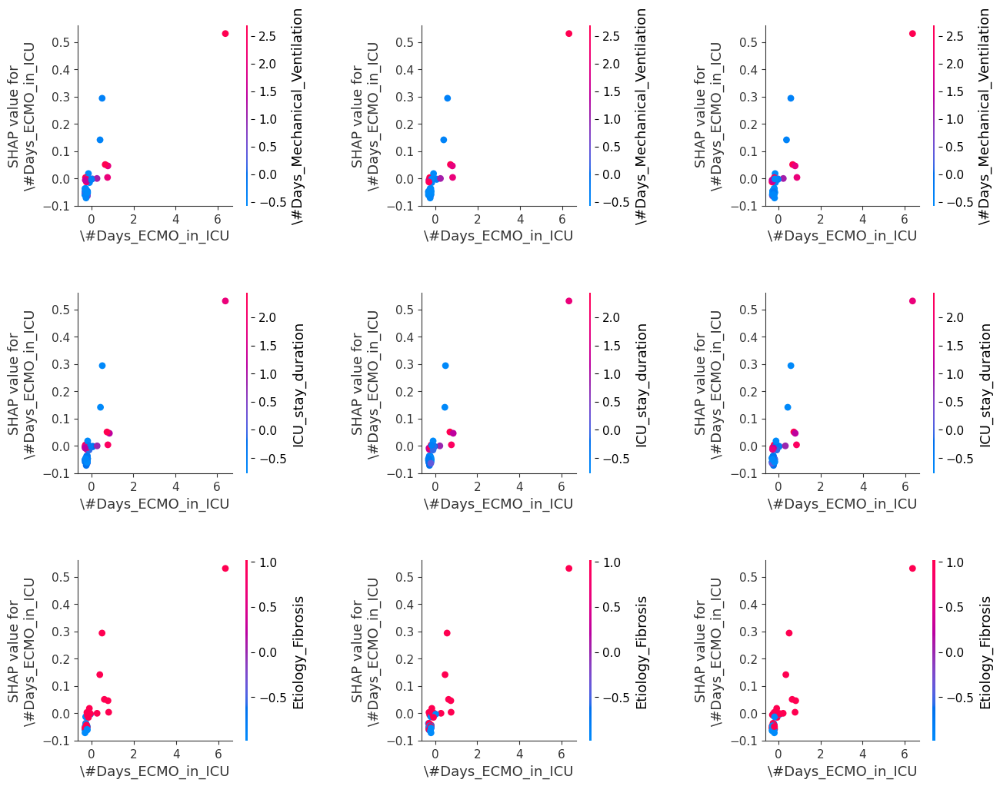

In [228]:
# we can use shap.approximate_interactions to guess which features
# may interact with #Days_ECMO_in_ICU
from matplotlib import gridspec
inds = shap.approximate_interactions("\#Days_ECMO_in_ICU", shap_values_0, X_valid_S)

# make plots colored by each of the top three possible interacting features
#ax = tuple(['ax'+str(x) for x in range(9)])
    
#fig, ax = plt.subplots(3,3, figsize=(16, 9))
fig = plt.figure(tight_layout=True, figsize=(14,11))
spec = gridspec.GridSpec(ncols=3, nrows=3, figure=fig)

for i in range(3):
    for j in range(3):
      ax = fig.add_subplot(spec[i, j])
      shap.dependence_plot("\#Days_ECMO_in_ICU", shap_values_0, X_valid_S, interaction_index=inds[i], 
                          x_jitter=1, dot_size=40, ax=ax, show=False)

# Save the figure as a PDF file
fig.savefig('shap_interactions_\#Days_ECMO_in_ICU_2.pdf', dpi=300, bbox_inches='tight')    
        
plt.tight_layout()
plt.show()

In [229]:
#import warnings
#warnings.filterwarnings("ignore")
#pd.set_option('display.max_columns', None)
#plt.style.use("cyberpunk")

# runtime configuration of matplotlib
#plt.rc("figure", 
 #   autolayout=False, 
 #   figsize=(20, 10),
#)
#plt.rc(
 #   "axes",
 #  labelweight="bold",
 #   labelsize="large",
 #   titleweight="bold",
 #   titlesize=20,
 #   titlepad=10,
#)

In [658]:
import warnings

import matplotlib.pyplot as plt

from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import MinMaxScaler
from sklearn import datasets
from sklearn.exceptions import ConvergenceWarning

# different learning rate schedules and momentum parameters
params = [
    {
        "solver": "sgd",
        "learning_rate": "constant",
        "momentum": 0,
        "learning_rate_init": 0.2,
    },
    {
        "solver": "sgd",
        "learning_rate": "constant",
        "momentum": 0.9,
        "nesterovs_momentum": False,
        "learning_rate_init": 0.2,
    },
    {
        "solver": "sgd",
        "learning_rate": "constant",
        "momentum": 0.9,
        "nesterovs_momentum": True,
        "learning_rate_init": 0.2,
    },
    {
        "solver": "sgd",
        "learning_rate": "invscaling",
        "momentum": 0,
        "learning_rate_init": 0.2,
    },
    {
        "solver": "sgd",
        "learning_rate": "invscaling",
        "momentum": 0.9,
        "nesterovs_momentum": True,
        "learning_rate_init": 0.2,
    },
    {
        "solver": "sgd",
        "learning_rate": "invscaling",
        "momentum": 0.9,
        "nesterovs_momentum": False,
        "learning_rate_init": 0.2,
    },
    {"solver": "adam", "learning_rate_init": 0.01},
]

labels2 = [
    "constant learning-rate",
    "constant with momentum",
    "constant with Nesterov's momentum",
    "inv-scaling learning-rate",
    "inv-scaling with momentum",
    "inv-scaling with Nesterov's momentum",
    "adam",
]

plot_args = [
    {"c": "red", "linestyle": "-"},
    {"c": "green", "linestyle": "-"},
    {"c": "blue", "linestyle": "-"},
    {"c": "red", "linestyle": "--"},
    {"c": "green", "linestyle": "--"},
    {"c": "blue", "linestyle": "--"},
    {"c": "black", "linestyle": "-"},
]


In [57]:
#The final step is to combine our feature extraction step with a classifier, fit the pipeline, and extract the OOB score:
from sklearn.gaussian_process import GaussianProcessClassifier #0.79, 0.66 Adaboost 
from sklearn.gaussian_process.kernels import RBF
from sklearn.neighbors import KNeighborsClassifier # 0.8253
from sklearn.naive_bayes import GaussianNB #0.8253
from sklearn.tree import DecisionTreeClassifier #0.76
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis #collinear variables, 0.80952
from gtda.pipeline import Pipeline

pipe = Pipeline(
    [
        ("features", feature_union),
        ("rf",  QuadraticDiscriminantAnalysis()),
        
    ]
)

X_train, X_valid, labels_train, labels_valid = train_test_split(persistence_diagrams, labels, random_state=89)

pipe.fit(X_train, labels_train)
pipe.score(X_valid, labels_valid)


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:808: UserWarning:

Variables are collinear



0.8095238095238095

In [1650]:
keep = list()
for i in range(252):
    flatten_arr = np.ravel(persistence_diagrams_h1[i])
    # Check if all value in 2D array are equal
    result = np.all(persistence_diagrams_h1[i]==flatten_arr[0])
    if result:
        keep.append(i)
    

In [1347]:
keep_ok = list(set(list(range(252)))-set(keep))

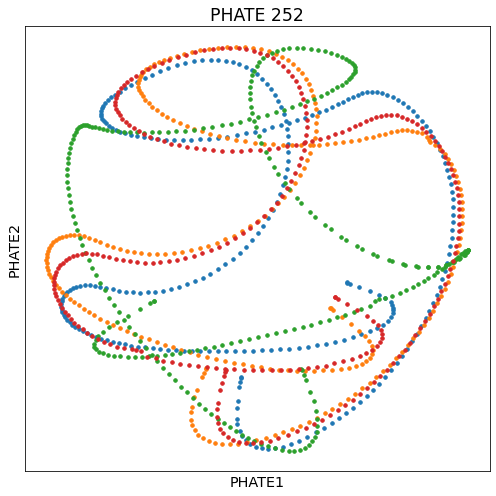

In [1176]:
# plot together some few persistence images
import matplotlib.pyplot as plt
fig, ax1 = plt.subplots(1,1, figsize=(7, 7))

#sample_labels = np.rep([0,1],267)

#plotting Y1 survivor one (sample 0)
scprep.plot.scatter2d(Y_phate_imgs_0, label_prefix="PHATE", title="PHATE 1",
                       ticks=False, cmap='Spectral', ax=ax1)

#plotting Y1 last survivor sample (188)
scprep.plot.scatter2d(Y_phate_imgs_188, label_prefix="PHATE", title="PHATE 189", legend=False,
                       ticks=False, cmap='Spectral', ax=ax1)

#plotting Y1 first non-survivor sample (189)
scprep.plot.scatter2d(Y_phate_imgs_189, label_prefix="PHATE", title="PHATE 190", legend=False,
                       ticks=False, cmap='Spectral', ax=ax1)

#plotting Y1 last non-survivor sample (251)
scprep.plot.scatter2d(Y_phate_imgs_251, label_prefix="PHATE", title="PHATE 252", legend=False,
                       ticks=False, cmap='Spectral', ax=ax1)

plt.tight_layout()
plt.show()

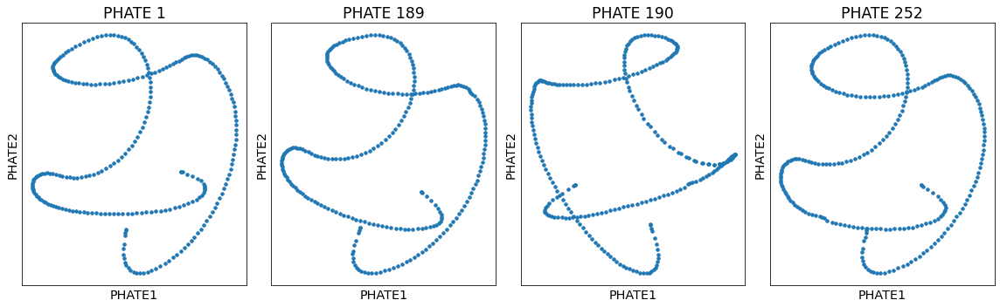

In [1262]:
# plot together some few persistence images
import matplotlib.pyplot as plt
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1,4, figsize=(16, 5))

#sample_labels = np.rep([0,1],267)

#plotting Y1 survivor one (sample 0)
scprep.plot.scatter2d(Y_phate_imgs_0, label_prefix="PHATE", title="PHATE 1",
                       ticks=False, cmap='Spectral', ax=ax1)

#plotting Y1 last survivor sample (188)
scprep.plot.scatter2d(Y_phate_imgs_188, label_prefix="PHATE", title="PHATE 189", legend=False,
                       ticks=False, cmap='Spectral', ax=ax2)

#plotting Y1 first non-survivor sample (189)
scprep.plot.scatter2d(Y_phate_imgs_189, label_prefix="PHATE", title="PHATE 190", legend=False,
                       ticks=False, cmap='Spectral', ax=ax3)

#plotting Y1 last non-survivor sample (251)
scprep.plot.scatter2d(Y_phate_imgs_251, label_prefix="PHATE", title="PHATE 252", legend=False,
                       ticks=False, cmap='Spectral', ax=ax4)

plt.tight_layout()
plt.show()

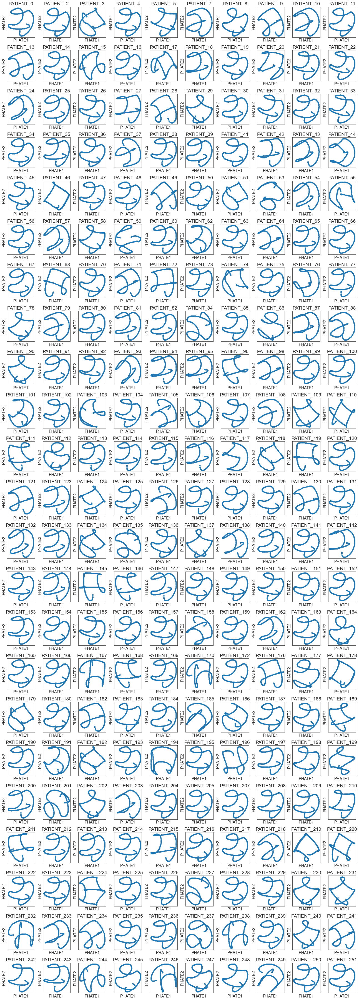

In [1552]:
import matplotlib.pyplot as plt

ax = tuple(['ax'+str(x) for x in range(230)])
    
fig, ax = plt.subplots(23,10, figsize=(18, 50))

#sample_labels = np.rep([0,1],267)
for i in range(230):
    scprep.plot.scatter2d(Y_phate_imgs[i], label_prefix="PHATE", title="PATIENT_"+str(keep_ok[i]),
                       ticks=False, cmap='Spectral', ax=ax.flatten()[i])
plt.tight_layout()
#plt.show()
plt.savefig('PIs_trajectories.pdf', dpi=300, bbox_inches='tight')

In [1122]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(imgs_array, labels, test_size=0.4, random_state=42)

In [90]:
import phate
import scprep

# matplotlib settings for Jupyter notebooks only
%matplotlib inline

AttributeError: module 'natsort' has no attribute 'compat'

In [333]:
phate_operator = phate.PHATE(n_jobs=-1)
#test = M.drop(['NIP_(identifiant)', 'date_de_TP', 'mortalité_à_un_an'], axis=1)
test = df2_standard_scale
#test = test.replace(np.nan, 0)
#Standarisation
#from sklearn.preprocessing import StandardScaler
#test_standard_scale=pd.DataFrame(StandardScaler().fit_transform(test))
#Y_phate = phate_operator.fit_transform(test_standard_scale)
Y_phate = phate_operator.fit_transform(test)

Calculating PHATE...
  Running PHATE on 252 observations and 52 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 0.11 seconds.
    Calculating affinities...
  Calculated graph and diffusion operator in 0.12 seconds.
  Calculating optimal t...
    Automatically selected t = 22
  Calculated optimal t in 0.14 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.01 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 0.07 seconds.
Calculated PHATE in 0.37 seconds.


In [326]:
ycat = y2.copy();
ycat.iloc[ycat==0]='Y1 survivor'
ycat.iloc[ycat==1]='Y1 non-survivor'
ycat

NOM
Abdalla                Y1 survivor
ABDAT                  Y1 survivor
AHMED                  Y1 survivor
AIT ALI                Y1 survivor
ALAZARD                Y1 survivor
                          ...     
VISEUR                 Y1 survivor
WEYRECH                Y1 survivor
Williez Dangauthier    Y1 survivor
Yahiaoui               Y1 survivor
YEBBOU                 Y1 survivor
Name: one_year_mortality, Length: 252, dtype: object

<AxesSubplot:xlabel='PHATE1', ylabel='PHATE2'>

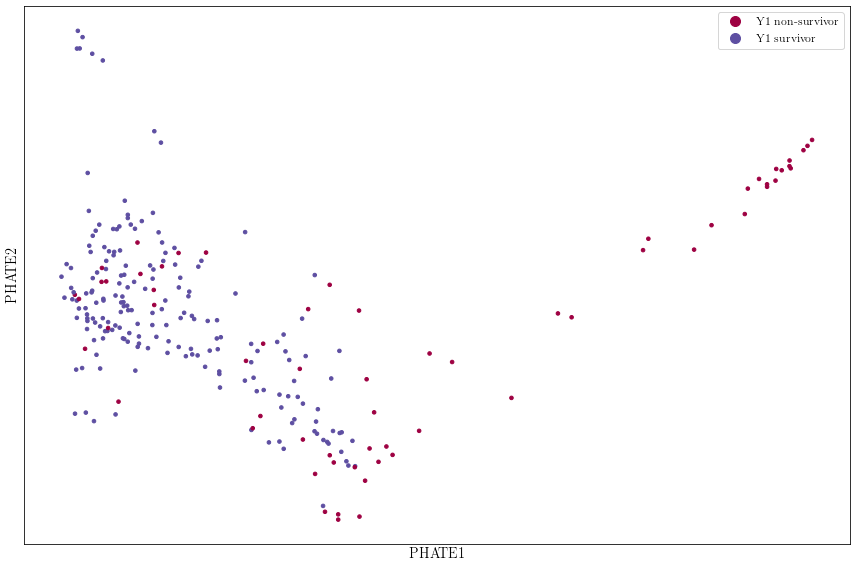

In [327]:
scprep.plot.scatter2d(Y_phate, c=ycat, figsize=(12,8), cmap="Spectral",
                      ticks=False, label_prefix="PHATE")

In [337]:
import sklearn.decomposition # PCA
import sklearn.manifold # t-SNE
import umap.umap_ as umap # UMAP
import time

start = time.time()
pca_operator = sklearn.decomposition.PCA(n_components=2)
Y_pca = pca_operator.fit_transform(np.array(test))
end = time.time()
print("Embedded PCA in {:.2f} seconds.".format(end-start))

start = time.time()
pca_operator = sklearn.decomposition.PCA(n_components=43)
tsne_operator = sklearn.manifold.TSNE(n_components=2)
Y_tsne = tsne_operator.fit_transform(pca_operator.fit_transform(np.array(test)))
end = time.time()
print("Embedded t-SNE in {:.2f} seconds.".format(end-start))

start = time.time()
pca_operator = sklearn.decomposition.PCA(n_components=43)
umap_operator = umap.UMAP(n_components=2)
Y_umap = umap_operator.fit_transform(pca_operator.fit_transform(np.array(test)))
end = time.time()
print("Embedded UMAP in {:.2f} seconds.".format(end-start))

Embedded PCA in 0.00 seconds.
Embedded t-SNE in 1.64 seconds.


OMP: Info #270: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


Embedded UMAP in 9.66 seconds.


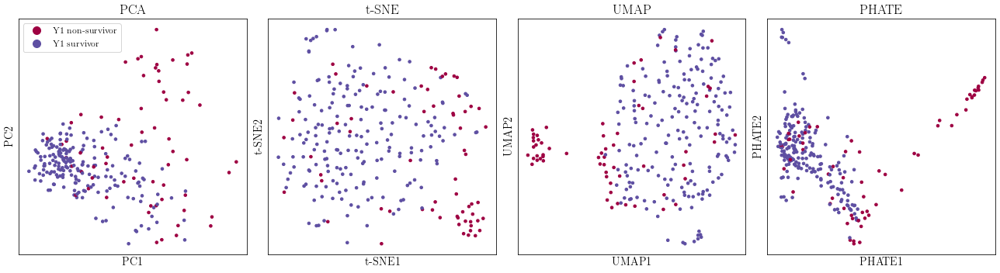

In [339]:
# plot everything
import matplotlib.pyplot as plt
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1,4, figsize=(18, 5))

#plotting PCA
scprep.plot.scatter2d(Y_pca, label_prefix="PC", title="PCA",
                      c=ycat, ticks=False, cmap='Spectral', ax=ax1)

#plotting tSNE
scprep.plot.scatter2d(Y_tsne, label_prefix="t-SNE", title="t-SNE", legend=False,
                      c=ycat, ticks=False, cmap='Spectral', ax=ax2)

#plotting UMAP
scprep.plot.scatter2d(Y_umap, label_prefix="UMAP", title="UMAP", legend=False,
                      c=ycat, ticks=False, cmap='Spectral', ax=ax3)

#plotting PHATE
scprep.plot.scatter2d(Y_phate, label_prefix="PHATE", title="PHATE", legend=False,
                      c=ycat, ticks=False, cmap='Spectral', ax=ax4)

plt.tight_layout()
plt.show()

In [374]:
!pip install --user --upgrade graphtools

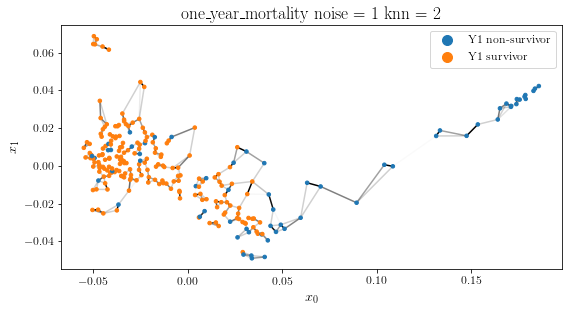

In [354]:
#========
dataset_name = 'one_year_mortality'
#knns = [2, 5, 10]
#for knn in knns:
G = gt.Graph(Y_phate, knn=2)


# ======
# Plotting the graph
# ======

# This code draws the nodes of the graph
ax = scprep.plot.scatter2d(Y_phate, c=ycat, 
              xlabel='$x_{0}$', ylabel='$x_{1}$',
              title= dataset_name + " noise = " + str(1) + " knn = " + str(2), figsize=(8,6),
              legend=True)

# This block of code draws lines between each point and its neighbors
for i in range(Y_phate.shape[0]-1):
    for j in range(i+1, Y_phate.shape[0]):
        affinity = G.kernel[i,j]
        if affinity > 0:
            ax.plot(Y_phate[[i,j],0], Y_phate[[i,j],1],
                    color='black', alpha=affinity, zorder=0)
    
    ax.set_aspect(1) 
    plt.tight_layout()

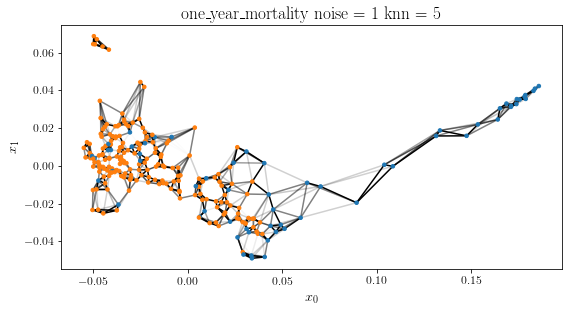

In [348]:
import graphtools as gt

#========
dataset_name = 'one_year_mortality'
#knns = [2, 5, 10]
#for knn in knns:
G = gt.Graph(Y_phate, knn=5)


# ======
# Plotting the graph
# ======

# This code draws the nodes of the graph
ax = scprep.plot.scatter2d(Y_phate, c=ycat, 
              xlabel='$x_{0}$', ylabel='$x_{1}$',
              title= dataset_name + " noise = " + str(1) + " knn = " + str(5), figsize=(8,6),
              legend=False)

# This block of code draws lines between each point and its neighbors
for i in range(Y_phate.shape[0]-1):
    for j in range(i+1, Y_phate.shape[0]):
        affinity = G.kernel[i,j]
        if affinity > 0:
            ax.plot(Y_phate[[i,j],0], Y_phate[[i,j],1],
                    color='black', alpha=affinity, zorder=0)
    
    ax.set_aspect(1) 
    plt.tight_layout()

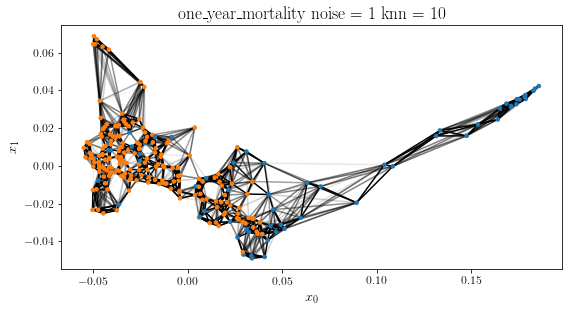

In [350]:
G = gt.Graph(Y_phate, knn=10)


# ======
# Plotting the graph
# ======

# This code draws the nodes of the graph
ax = scprep.plot.scatter2d(Y_phate, c=ycat, 
              xlabel='$x_{0}$', ylabel='$x_{1}$',
              title= dataset_name + " noise = " + str(1) + " knn = " + str(10), figsize=(8,6),
              legend=False)

# This block of code draws lines between each point and its neighbors
for i in range(Y_phate.shape[0]-1):
    for j in range(i+1, Y_phate.shape[0]):
        affinity = G.kernel[i,j]
        if affinity > 0:
            ax.plot(Y_phate[[i,j],0], Y_phate[[i,j],1],
                    color='black', alpha=affinity, zorder=0)
    
    ax.set_aspect(1) 
    plt.tight_layout()

In [388]:
from sklearn.metrics import pairwise_distances
from gtda.diagrams import Scaler, Filtering, PersistenceEntropy, BettiCurve, PairwiseDistance
from gtda.plotting import plot_heatmap
p_L = 2
n_layers = 5
PD = PairwiseDistance(
    metric='landscape', metric_params={'p': p_L, 'n_layers': n_layers, 'n_bins': 1000}, order=None)

X_distance_L = PD.fit_transform(persistence_diagrams)
print(X_distance_L.shape)

(252, 252, 3)


In [356]:
plot_heatmap(X_distance_L[:, :, 1], colorscale='blues')

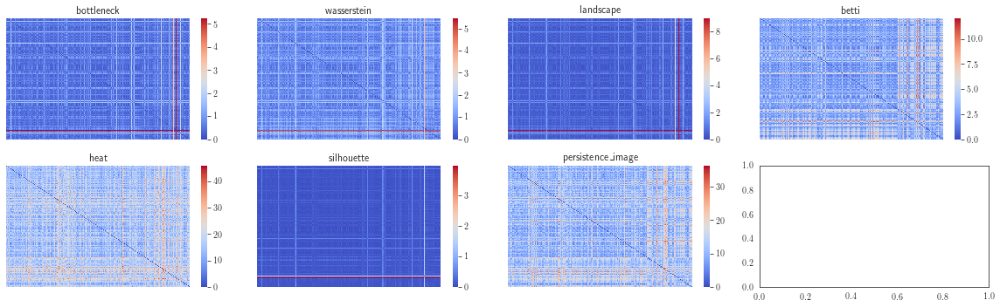

In [398]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define subplots
fig, ax = plt.subplots(2, 4, figsize=(16, 5))

# Define data list
data_list = [
    X_distance_B[:, :, 0], 
    X_distance_W[:, :, 0], 
    X_distance_L[:, :, 0],
    X_distance_Bt[:, :, 0],
    X_distance_H[:, :, 0],
    X_distance_S[:, :, 0],
    X_distance_PI[:, :, 0]
]

# Plot heatmaps
for i in range(7):
    sns.heatmap(data_list[i], ax=ax.flatten()[i], cmap='coolwarm')
    ax[i // 4, i % 4].set_xticklabels([])
    ax[i // 4, i % 4].set_yticklabels([])
    ax[i // 4, i % 4].set_title(['bottleneck', 'wasserstein', 'landscape', 'betti', 'heat', 'silhouette','persistence_image'][i])
    ax[i // 4, i % 4].set_xlabel('')
    ax[i // 4, i % 4].set_ylabel('')

# Save plot
plt.tight_layout()
plt.savefig('TF_pat_distance_heatmaps_2.pdf', dpi=300, bbox_inches='tight')

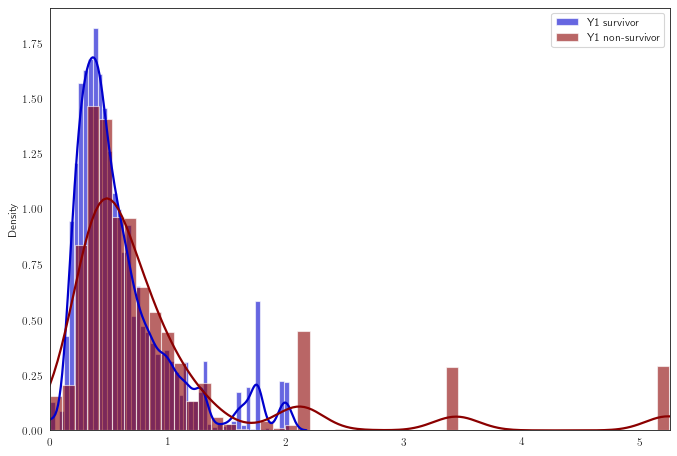

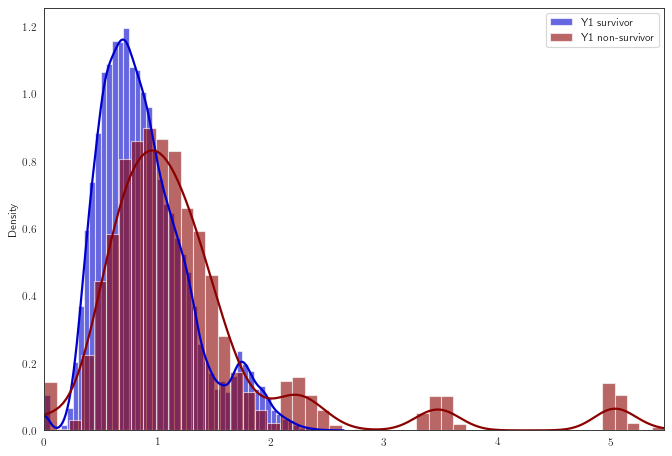

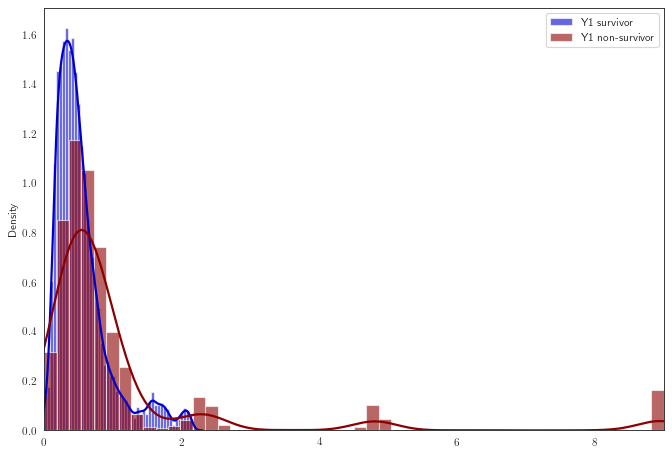

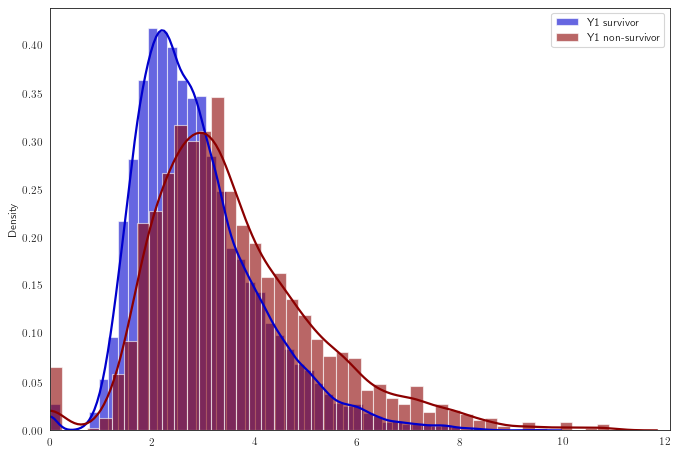

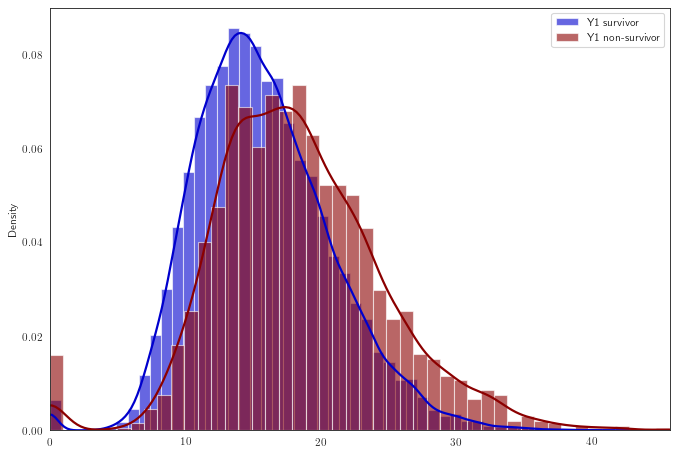

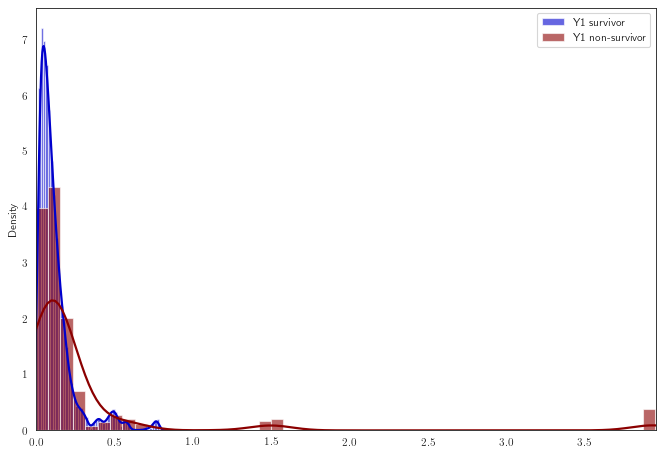

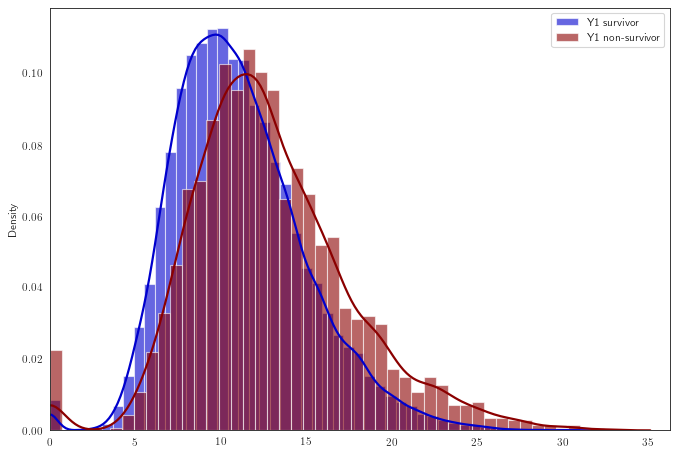

In [500]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_distance_histogram(X_distance, filename):
    # Set style
    sns.set_style("white")
    
    # Set color palette
    #cool_palette = sns.color_palette("coolwarm", 2)
    cool_palette = ["mediumblue", "darkred"]
    # Plot parameters
    kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
    fig, ax = plt.subplots(figsize=(10,7), dpi=80)
    
    # Plot histograms
    sns.distplot(X_distance[:189,:189,0], color=cool_palette[0], label="Y1 survivor", **kwargs)
    sns.distplot(X_distance[189:,189:,0], color=cool_palette[1], label="Y1 non-survivor", **kwargs)
    
    # Set axis limits and legend
    ax.set_xlim(X_distance.min(), X_distance.max())
    ax.legend()
    
    # Save figure
    plt.savefig(filename, dpi=300, bbox_inches='tight')

    
# List of input arrays
inputs = [X_distance_B, X_distance_W, X_distance_L, X_distance_Bt, X_distance_H, X_distance_S, X_distance_PI]

# Iterate over inputs and plot distance histogram for each
for i, X_distance in enumerate(inputs):
    # Set filename based on input index
    filename = f"distance_hist_density_batch_{i+1}.pdf"
    
    # Call plot_distance_histogram function
    plot_distance_histogram(X_distance, filename)


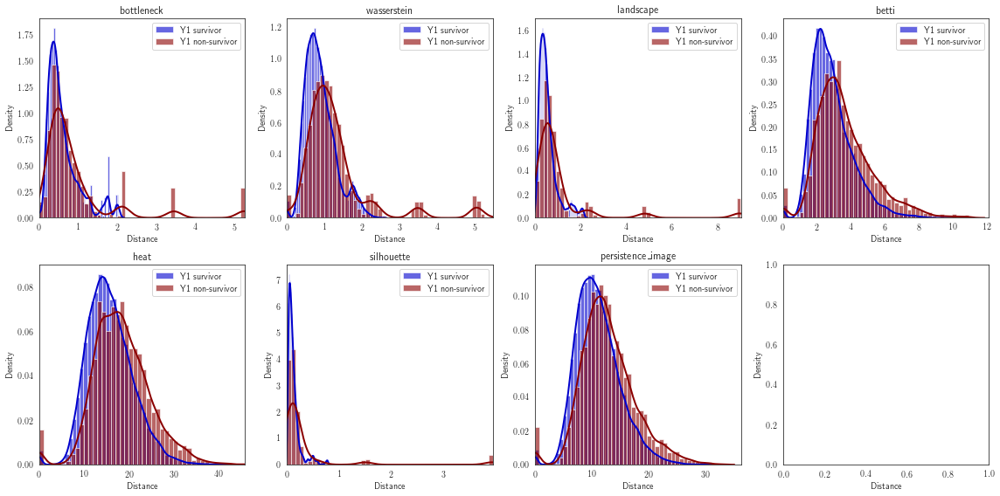

In [399]:
# Set style and color palette
sns.set_style("white")
cool_palette = ["mediumblue", "darkred"]

# Create figure with subplots arranged in a 2x4 grid
fig, ax = plt.subplots(2, 4, figsize=(16, 8))

# Flatten the axis array for easier iteration
ax_flat = ax.flatten()

# Iterate over inputs and plot distance histogram for each
for i, X_distance in enumerate(inputs):
    # Plot histogram on corresponding axis
    sns.distplot(X_distance[:189, :189, 0], color=cool_palette[0], label="Y1 survivor", ax=ax_flat[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
    sns.distplot(X_distance[189:, 189:, 0], color=cool_palette[1], label="Y1 non-survivor", ax=ax_flat[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})

    # Set axis limits and legend
    ax_flat[i].set_xlim(X_distance.min(), X_distance.max())
    ax_flat[i].legend()

    # Set plot title
    plot_titles = ["bottleneck", "wasserstein", "landscape", "betti", "heat", "silhouette", "persistence_image"]
    ax_flat[i].set_title(plot_titles[i])

# Set axis labels and tighten layout
for i in range(2):
    for j in range(4):
        ax[i, j].set_xlabel("Distance")
        ax[i, j].set_ylabel("Density")
fig.tight_layout()

# Save figure
plt.savefig("distance_hist_density_2.pdf", dpi=300, bbox_inches='tight')

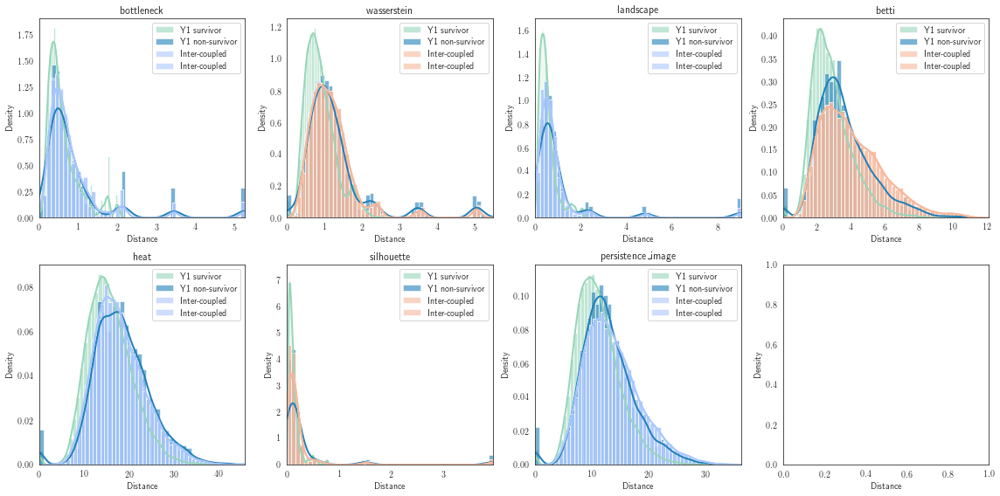

In [414]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define color palettes
intra_palette = sns.color_palette("YlGnBu", n_colors=2)
inter_palette = sns.color_palette("coolwarm", n_colors=2)

# Create figure with subplots arranged in a 2x4 grid
fig, ax = plt.subplots(2, 4, figsize=(16, 8))

# Flatten the axis array for easier iteration
ax_flat = ax.flatten()

# Iterate over inputs and plot distance histogram for each
for i, X_distance in enumerate(inputs):
    # Define color for inter-coupled distributions
    inter_color = inter_palette[i % 2]

    # Plot histogram on corresponding axis
    sns.distplot(X_distance[:189, :189, 0], color=intra_palette[0], label="Y1 survivor", ax=ax_flat[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
    sns.distplot(X_distance[189:, 189:, 0], color=intra_palette[1], label="Y1 non-survivor", ax=ax_flat[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
    sns.distplot(X_distance[:189, 189:, 0], color=inter_color, label="Inter-coupled", ax=ax_flat[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
    sns.distplot(X_distance[189:, :189, 0], color=inter_color, label="Inter-coupled", ax=ax_flat[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})

    # Set axis limits and legend
    ax_flat[i].set_xlim(X_distance.min(), X_distance.max())
    ax_flat[i].legend()

    # Set plot title
    plot_titles = ["bottleneck", "wasserstein", "landscape", "betti", "heat", "silhouette", "persistence_image"]
    ax_flat[i].set_title(plot_titles[i])

# Set axis labels and tighten layout
for i in range(2):
    for j in range(4):
        ax[i, j].set_xlabel("Distance")
        ax[i, j].set_ylabel("Density")
fig.tight_layout()

# Save figure
plt.savefig("distance_hist_density_3.pdf", dpi=300, bbox_inches='tight')


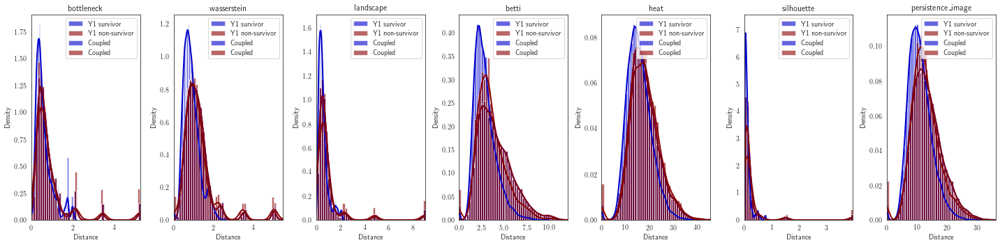

In [415]:
# Set style and color palette
sns.set_style("white")
cool_palette = ["mediumblue", "darkred"]

# Create figure with subplots arranged in a 1x7 grid
fig, ax = plt.subplots(1, 7, figsize=(20, 5))

# Iterate over inputs and plot distance histogram for each
for i, X_distance in enumerate(inputs):
    # Plot histogram on corresponding axis
    sns.distplot(X_distance[:189, :189, 0], color=cool_palette[0], label="Y1 survivor", ax=ax[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
    sns.distplot(X_distance[189:, 189:, 0], color=cool_palette[1], label="Y1 non-survivor", ax=ax[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
    sns.distplot(X_distance[:189, 189:, 0], color=cool_palette[0], label="Coupled", ax=ax[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
    sns.distplot(X_distance[189:, :189, 0], color=cool_palette[1], label="Coupled", ax=ax[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})

    # Set axis limits and legend
    ax[i].set_xlim(X_distance.min(), X_distance.max())
    ax[i].legend()

    # Set plot title
    plot_titles = ["bottleneck", "wasserstein", "landscape", "betti", "heat", "silhouette", "persistence_image"]
    ax[i].set_title(plot_titles[i])

# Set axis labels and tighten layout
for i in range(7):
    ax[i].set_xlabel("Distance")
    ax[i].set_ylabel("Density")
fig.tight_layout()

# Save figure
plt.savefig("distance_hist_density_3_all_in_one.pdf", dpi=300, bbox_inches='tight')


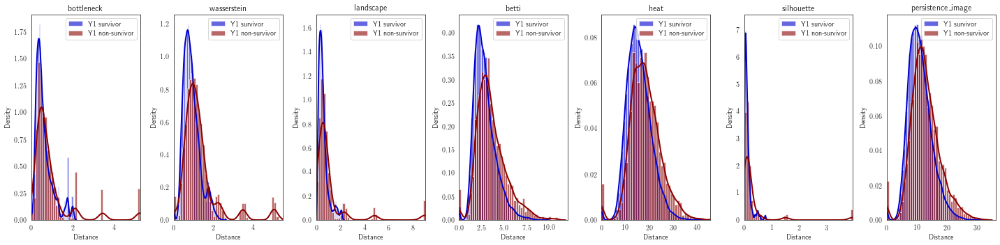

In [419]:
# Set style and color palette
sns.set_style("white")
cool_palette = ["mediumblue", "darkred"]

# Create figure with subplots arranged in a 1x7 grid
fig, ax = plt.subplots(1, 7, figsize=(20, 5))

# Iterate over inputs and plot distance histogram for each
for i, X_distance in enumerate(inputs):
    # Plot histogram on corresponding axis
    sns.distplot(X_distance[:189, :189, 0], color=cool_palette[0], label="Y1 survivor", ax=ax[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
    sns.distplot(X_distance[189:, 189:, 0], color=cool_palette[1], label="Y1 non-survivor", ax=ax[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
    #sns.distplot(X_distance[:189, 189:, 0], color=cool_palette[0], label="Coupled", ax=ax[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
    #sns.distplot(X_distance[189:, :189, 0], color=cool_palette[1], label="Coupled", ax=ax[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})

    # Set axis limits and legend
    ax[i].set_xlim(X_distance.min(), X_distance.max())
    ax[i].legend()

    # Set plot title
    plot_titles = ["bottleneck", "wasserstein", "landscape", "betti", "heat", "silhouette", "persistence_image"]
    ax[i].set_title(plot_titles[i])

# Set axis labels and tighten layout
for i in range(7):
    ax[i].set_xlabel("Distance")
    ax[i].set_ylabel("Density")
fig.tight_layout()

# Save figure
plt.savefig("distance_hist_density_3_all_in_one_non_intercoupled.pdf", dpi=300, bbox_inches='tight')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


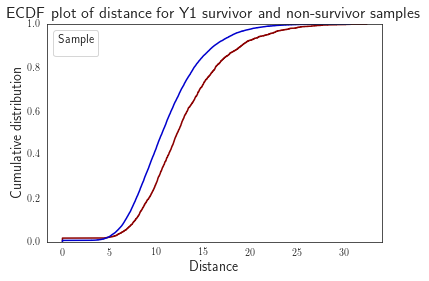

In [492]:
# Adjust the size of the second array to match the size of the first array
X_distance_adjusted = X_distance[189:, 189:, 0][:, :189]

# Flatten the 2-dimensional distance array
distance_flat = X_distance_adjusted.flatten()

# Create a DataFrame with the data to plot
df = pd.DataFrame({
    'Distance': np.concatenate([X_distance[:189, :189, 0].flatten(), X_distance_adjusted.flatten()]),
    'Sample': ['Y1 survivor'] * 189*189 + ['Y1 non-survivor'] * 63*63
})

# Create the ecdfplot
sns.ecdfplot(data=df, x='Distance', hue='Sample', palette=['mediumblue', 'darkred'], legend=False)

# Adjust the legend properties
plt.legend(title='Sample', loc='upper left', fontsize=12, title_fontsize=12)

# Add axis labels and title
plt.xlabel('Distance', fontsize=14)
plt.ylabel('Cumulative distribution', fontsize=14)
plt.title('ECDF plot of distance for Y1 survivor and non-survivor samples', fontsize=16)

# Save the figure
plt.savefig('ecdfplot_distance_survivor_vs_non-survivor.png', dpi=300, bbox_inches='tight')

In [468]:
df

,Sample,Value
0,Y1 survivor,0.000000
1,Y1 survivor,12.767939
2,Y1 survivor,9.616483
3,Y1 survivor,12.298891
4,Y1 survivor,11.029709
...,...,...
39685,Y1 non-survivor,16.022215
39686,Y1 non-survivor,12.659514
39687,Y1 non-survivor,10.134585
39688,Y1 non-survivor,12.270905


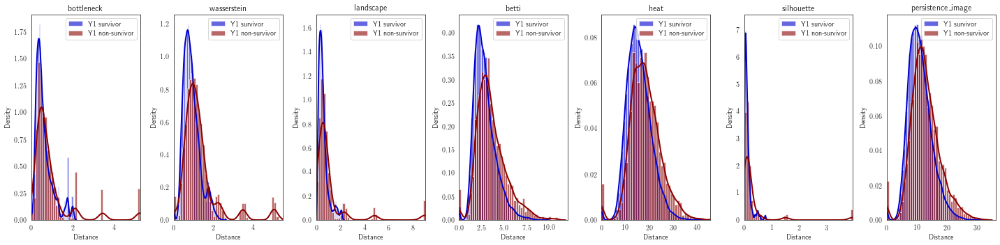

In [493]:
# Set style and color palette
sns.set_style("white")
cool_palette = ["mediumblue", "darkred"]

# Create figure with subplots arranged in a 1x7 grid
fig, ax = plt.subplots(1, 7, figsize=(20, 5))

# Iterate over inputs and plot distance histogram for each
for i, X_distance in enumerate(inputs):
    # Plot histogram on corresponding axis
    sns.distplot(X_distance[:189, :189, 0], color=cool_palette[0], label="Y1 survivor", ax=ax[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
    sns.distplot(X_distance[189:, 189:, 0], color=cool_palette[1], label="Y1 non-survivor", ax=ax[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
    #sns.distplot(X_distance[:189, 189:, 0], color=cool_palette[0], label="Coupled", ax=ax[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
    #sns.distplot(X_distance[189:, :189, 0], color=cool_palette[1], label="Coupled", ax=ax[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})

    # Set axis limits and legend
    ax[i].set_xlim(X_distance.min(), X_distance.max())
    ax[i].legend()

    # Set plot title
    plot_titles = ["bottleneck", "wasserstein", "landscape", "betti", "heat", "silhouette", "persistence_image"]
    ax[i].set_title(plot_titles[i])

# Set axis labels and tighten layout
for i in range(7):
    ax[i].set_xlabel("Distance")
    ax[i].set_ylabel("Density")
fig.tight_layout()

# Save figure
plt.savefig("distance_hist_density_3_all_in_one_non_intercoupled.pdf", dpi=300, bbox_inches='tight')

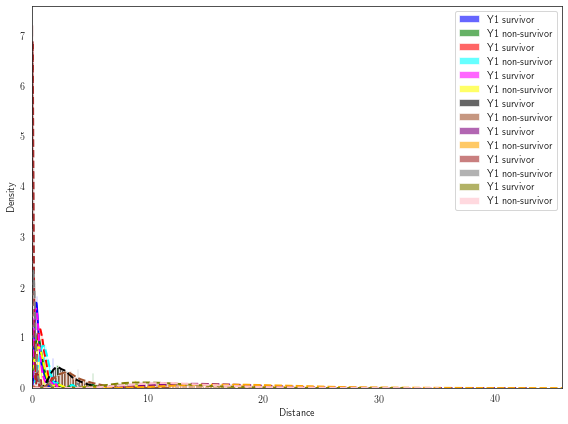

In [433]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set style and color palette
sns.set_style("white")
cool_palette = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'sienna', 'purple', 'orange', 'brown', 'gray', 'olive', 'pink']


# Create figure with a single subplot
fig, ax = plt.subplots(1, 1, figsize=(8, 6))

# Iterate over inputs and plot distance histogram for each
for i, X_distance in enumerate(inputs):
    # Plot histogram for the first group (survivors)
    sns.distplot(X_distance[:189, :189, 0], color=cool_palette[i*2], label="Y1 survivor", ax=ax, hist_kws={'alpha':.6}, kde_kws={'linewidth':2, 'linestyle':'-' if i == 0 else '--'})

    # Plot histogram for the second group (non-survivors)
    sns.distplot(X_distance[189:, 189:, 0], color=cool_palette[i*2+1], label="Y1 non-survivor", ax=ax, hist_kws={'alpha':.6}, kde_kws={'linewidth':2, 'linestyle':'-' if i == 0 else '--'})

ax.set_xlim(min([X_distance.min() for X_distance in inputs]), max([X_distance.max() for X_distance in inputs]))
ax.legend()

# Set axis labels and tighten layout
ax.set_xlabel("Distance")
ax.set_ylabel("Density")
fig.tight_layout()

# Save figure
plt.savefig("distance_hist_density_3_single_panel.pdf", dpi=300, bbox_inches='tight')

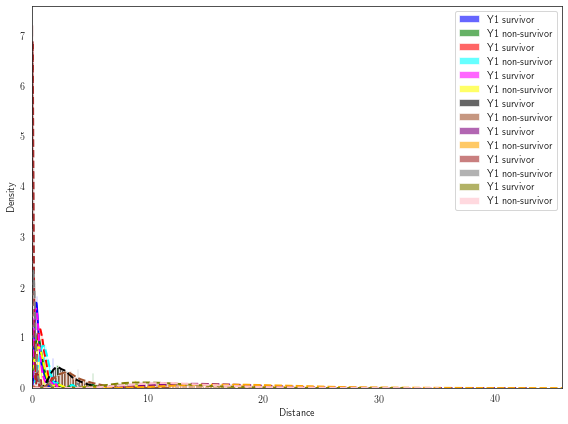

In [455]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set style and color palette
sns.set_style("white")
cool_palette = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'sienna', 'purple', 'orange', 'brown', 'gray', 'olive', 'pink', 'teal', 'navy', 'maroon', 'salmon', 'gold', 'turquoise']

# Create figure with a single subplot
fig, ax = plt.subplots(1, 1, figsize=(8, 6))

# Example inputs
#inputs = [X_distance_1, X_distance_2, X_distance_3]

# Iterate over inputs and plot distance histogram for each
for i, X_distance in enumerate(inputs):
    # Plot histogram for the first group (survivors)
    survivor_color = cool_palette[i*2]
    survivor_linestyle = '-' if i == 0 else '--'
    sns.distplot(X_distance[:189, :189, 0], color=survivor_color, label="Y1 survivor", ax=ax, hist_kws={'alpha':.6}, kde_kws={'linewidth':2, 'linestyle':survivor_linestyle, "kernel": "tri"})

    # Plot histogram for the second group (non-survivors)
    non_survivor_color = cool_palette[i*2+1]
    non_survivor_linestyle = '-' if i == 0 else '--'
    sns.distplot(X_distance[189:, 189:, 0], color=non_survivor_color, label="Y1 non-survivor", ax=ax, hist_kws={'alpha':.6}, kde_kws={'linewidth':2, 'linestyle':non_survivor_linestyle, "kernel": "tri"})

ax.set_xlim(min([X_distance.min() for X_distance in inputs]), max([X_distance.max() for X_distance in inputs]))
ax.legend()

# Set axis labels and tighten layout
ax.set_xlabel("Distance")
ax.set_ylabel("Density")
fig.tight_layout()

# Save figure
plt.savefig("distance_hist_density_3_single_panel_2.pdf", dpi=300, bbox_inches='tight')



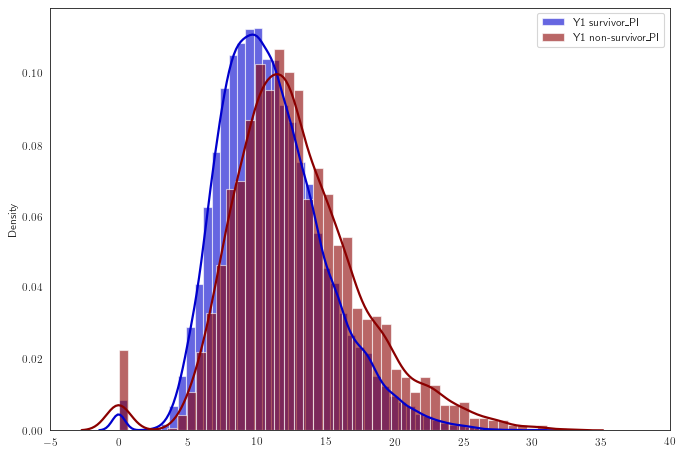

In [375]:
import seaborn as sns
sns.set_style("white")
# Plot
kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
plt.figure(figsize=(10,7), dpi= 80)
#ax1.hist(X_distance_PI[:189,:189,0], density = True, bins = 50)
#ax2.hist(X_distance_PI[189:,189:,0], density = True, bins = 50)
sns.distplot(X_distance_PI[:189,:189,0], color="mediumblue", label="Y1 survivor_PI", **kwargs)
sns.distplot(X_distance_PI[189:,189:,0], color="darkred", label="Y1 non-survivor_PI", **kwargs)
#sns.distplot(X_distance_Bt[:189,:189], color="deeppink", label="Y1 survivor_Bt", **kwargs)
#sns.distplot(X_distance_Bt[189:,189:], color="green", label="Y1 non-survivor_Bt", **kwargs)

plt.xlim(-5,40)
#plt.ylim(0,1)
plt.legend();
plt.savefig('PI_pat_distance_hist_density_2.pdf', dpi=300, bbox_inches='tight')

In [494]:
from sklearn.metrics.pairwise import rbf_kernel
Affy_pi = rbf_kernel(X_distance_PI[:, :, 0])

In [496]:
Affy_n_pi = Affy_pi / Affy_pi.sum(axis=1)[:, np.newaxis]

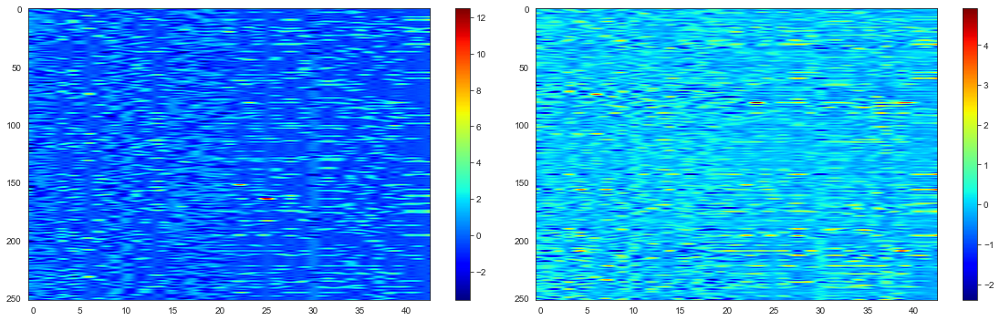

In [1744]:
from numpy.linalg import matrix_power

Ntest = np.dot(matrix_power(Affy_n,2),test_standard_scale)
#fig, (ax1,ax2) = plt.subplots(1,2, figsize=(16, 5))

my_img = [test_standard_scale, Ntest]

fig = plt.figure(figsize=(16, 5))
columns = 2
rows = 1
for i in range(2):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(my_img[i], cmap='jet', aspect='auto', interpolation='sinc')
    plt.colorbar()


plt.tight_layout()
#plt.show()
plt.savefig('database_cleaned_by_PI_affynity.pdf', dpi=300, bbox_inches='tight')

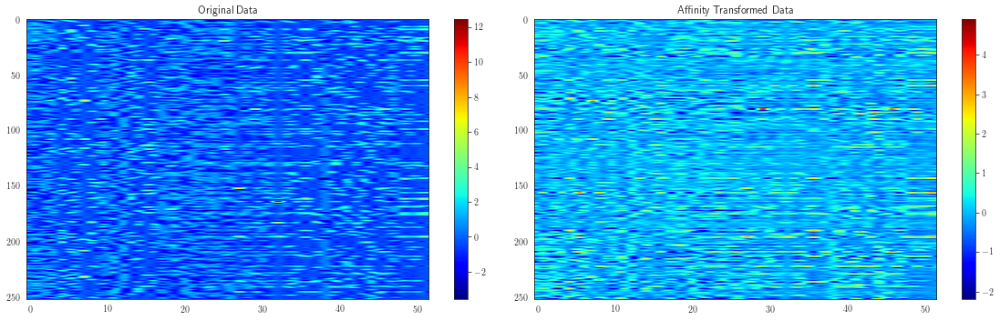

In [497]:
from numpy.linalg import matrix_power

Ntest = np.dot(matrix_power(Affy_n_pi, 2), test)

my_img = [test, Ntest]

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))

for i, ax in enumerate(axs.flat):
    im = ax.imshow(my_img[i], cmap='jet', aspect='auto', interpolation='sinc')
    ax.set_title(['Patient_XXX', 'Patient_XXX Data'][i])
    plt.colorbar(im, ax=ax)

plt.tight_layout()
plt.savefig('database_cleaned_by_PI_affynity_2.pdf', dpi=300, bbox_inches='tight')

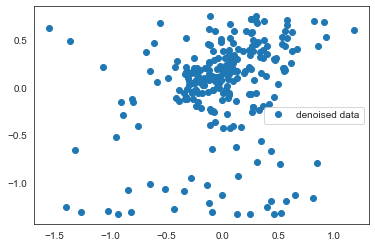

In [1715]:
plt.plot(Ntest[:, 0], Ntest[:, 1], 'o', label = 'denoised data')
#create legend in case you have more than one se
plt.legend()
plt.show()

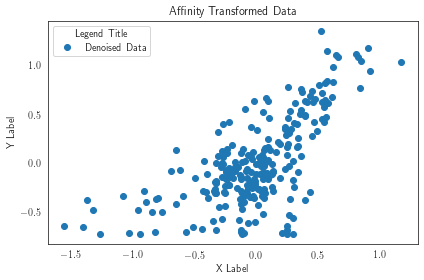

In [409]:
plt.plot(Ntest[:, 0], Ntest[:, 1], 'o', label='Patient_XXX')
plt.xlabel('X Label')
plt.ylabel('Y Label')
plt.title('Patient_XXX Data')
plt.legend(title='Patient_XXX')
plt.tight_layout()
plt.savefig('Projection_cleaned_by_PI_affynity.pdf', dpi=300, bbox_inches='tight')
plt.show()

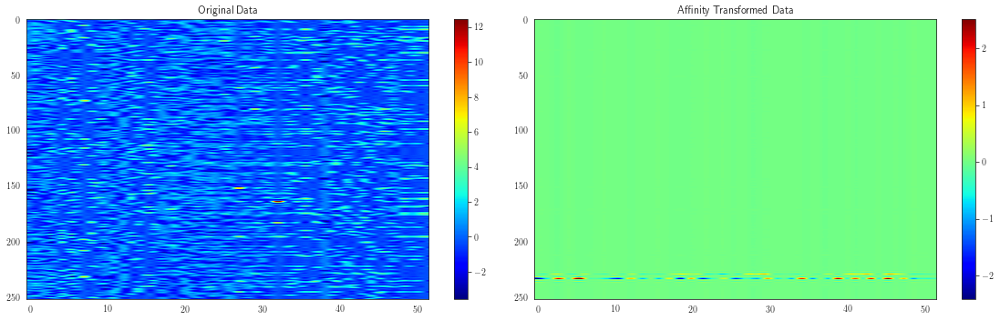

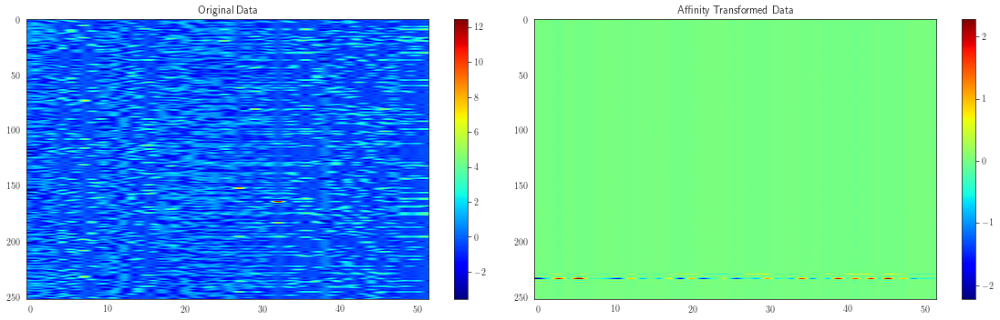

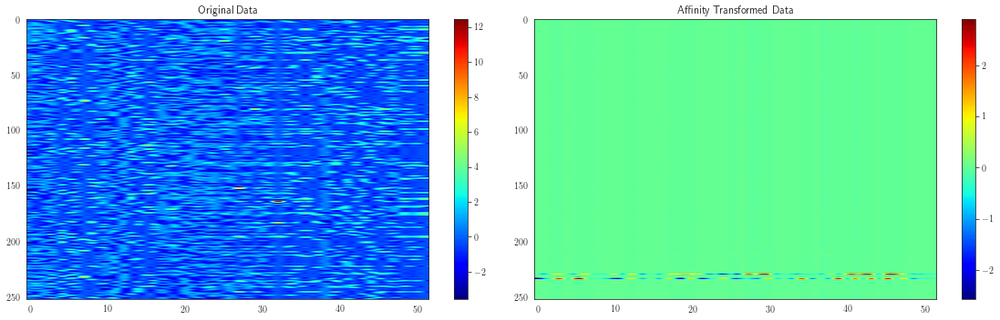

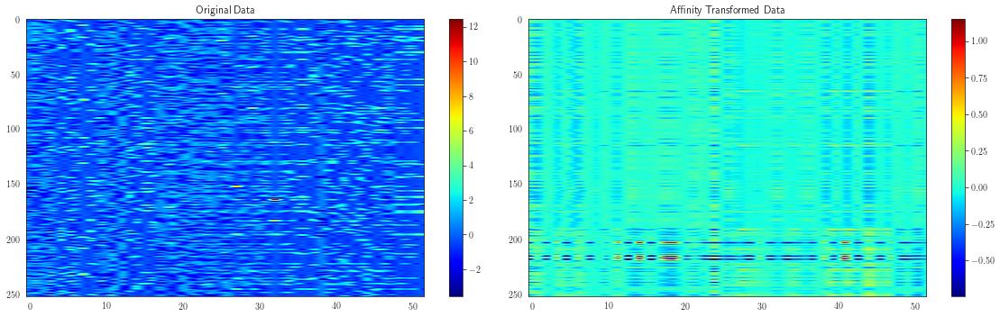

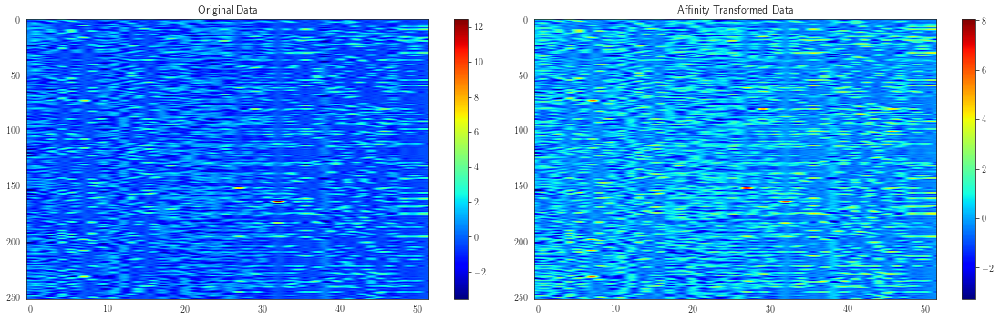

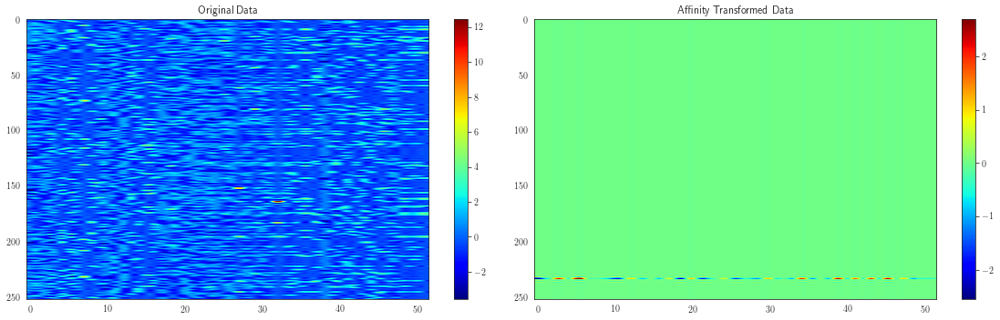

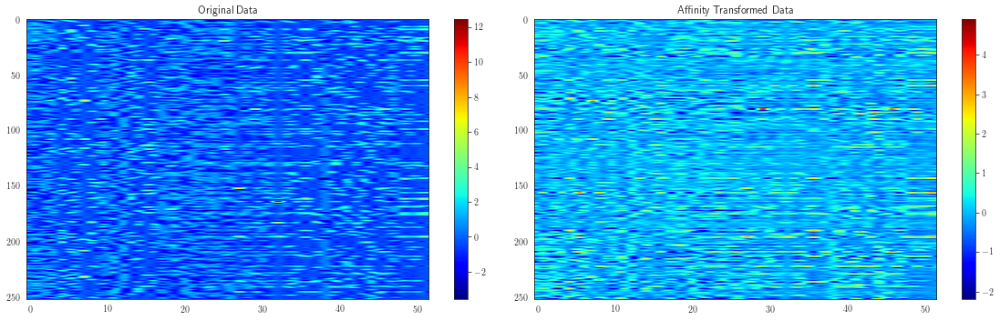

In [511]:
import numpy as np
from sklearn.metrics.pairwise import rbf_kernel
from numpy.linalg import matrix_power
import matplotlib.pyplot as plt

# define a list of 7 X_distance matrices
X_distance_list = [X_distance_B[:, :, 0], 
    X_distance_W[:, :, 0], 
    X_distance_L[:, :, 0],
    X_distance_Bt[:, :, 0],
    X_distance_H[:, :, 0],
    X_distance_S[:, :, 0],
    X_distance_PI[:, :, 0]]

for i, X_distance in enumerate(X_distance_list):
    # apply the RBF kernel and row normalization using the current X_distance matrix
    Affy = rbf_kernel(X_distance)
    Affy_n = Affy / Affy.sum(axis=1)[:, np.newaxis]
    
    # raise the affinity matrix to the power of 2 and multiply with the test data
    Ntest = np.dot(matrix_power(Affy_n, 2), test)
    
    # plot the original and transformed data
    my_img = [test, Ntest]
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))
    for j, ax in enumerate(axs.flat):
        im = ax.imshow(my_img[j], cmap='jet', aspect='auto', interpolation='sinc')
        ax.set_title(['Patient_XXX', 'Patient_XXX Data'][j])
        plt.colorbar(im, ax=ax)
    plt.tight_layout()
    plt.savefig(f'database_cleaned_by_affy_batch_{i+1}.pdf', dpi=300, bbox_inches='tight')


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



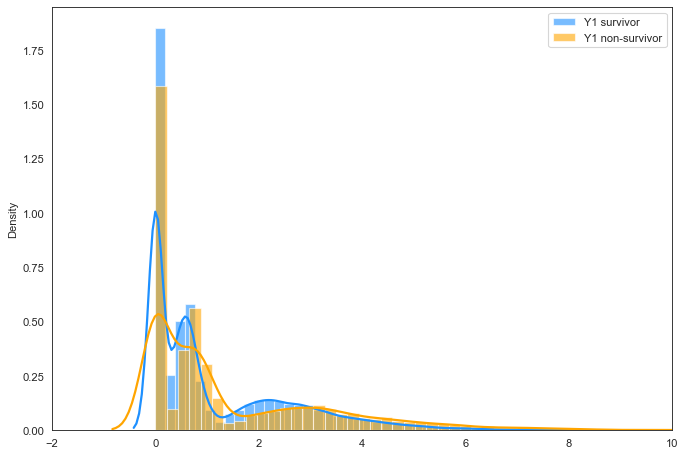

In [1630]:
plt.figure(figsize=(10,7), dpi= 80)
#ax1.hist(X_distance_PI[:189,:189,0], density = True, bins = 50)
#ax2.hist(X_distance_PI[189:,189:,0], density = True, bins = 50)
sns.distplot(X_distance_Bt[:189,:189], color="dodgerblue", label="Y1 survivor", **kwargs)
sns.distplot(X_distance_Bt[189:,189:], color="orange", label="Y1 non-survivor", **kwargs)

plt.xlim(-2,10)
#plt.ylim(0,1.05)
plt.legend();
plt.savefig('Bt_pat_distance_hist_density.pdf', dpi=300, bbox_inches='tight')

In [1456]:
Affy_n.shape

(252, 252)

In [1085]:
import scipy
from scipy.stats import norm
from scipy.stats import rv_histogram

df = X_distance_PI[:,:,0]

#Build training, validation   
timeslot_x_train_end = int(len(df)* 0.7)
timeslot_x_valid_end = int(len(df)* 0.9)

data = df
data_train = data[:timeslot_x_train_end]
data_valid = data[timeslot_x_train_end:timeslot_x_valid_end]

#Make normal distribution objects from data mean and standard deviation
norm_dist_train = norm(data_train.mean(), data_train.std())
norm_dist_valid = norm(data_valid.mean(), data_valid.std())

#Generate arrays of pdf evaluations
X1 = np.linspace(np.min(data_train), np.max(data_train), 1000)
X2 = np.linspace(np.min(data_valid), np.max(data_valid), 1000)
rvs_train = [norm_dist_train.pdf(x) for x in X1]
rvs_valid = [norm_dist_valid.pdf(x) for x in X2]

#Calculate the Kullback–Leibler divergence between the different datasets
entropy_train_valid = scipy.special.rel_entr(rvs_train, rvs_valid)       
kl_div_train_valid = np.sum(entropy_train_valid)

#Print the values of the Kullback–Leibler divergence
print(f"Kullback–Leibler divergence between training and validation dataset: {kl_div_train_valid}")

Kullback–Leibler divergence between training and validation dataset: 1.37000427139997


In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
#import scprep

In [1827]:
test_standard_scale

,0,1,2,3,4,5,6,7,8,9,...,33,34,35,36,37,38,39,40,41,42
0,-0.204075,-1.330124,0.459695,-0.394922,-0.367607,1.091469,-0.213643,2.886751,-2.240322,-0.745356,...,1.713914,-0.577350,-0.421391,-0.491304,-0.565130,-0.421391,1.042439,-0.434372,-0.434372,-0.309277
1,0.795388,0.751809,-1.263521,2.532146,-0.367607,-0.916197,-0.213643,-0.346410,0.539351,1.341641,...,-0.583460,-0.577350,-0.421391,-0.491304,-0.565130,-0.421391,-0.528232,-0.434372,-0.434372,-0.309277
2,-0.840097,0.751809,1.536705,-0.394922,2.720294,1.091469,-0.213643,-0.346410,0.155948,-0.745356,...,-0.583460,1.732051,-0.421391,-0.491304,-0.565130,-0.421391,-0.206958,-0.434372,-0.434372,-0.309277
3,0.159366,-1.330124,0.890499,-0.394922,-0.367607,1.091469,-0.213643,-0.346410,-0.706710,-0.745356,...,1.713914,1.732051,2.373095,-0.491304,-0.565130,-0.421391,0.863954,-0.434372,-0.434372,-0.309277
4,0.795388,-1.330124,-0.832717,-0.394922,-0.367607,-0.916197,-0.213643,-0.346410,-0.706710,-0.745356,...,-0.583460,1.732051,-0.421391,-0.491304,-0.565130,-0.421391,-0.599626,-0.434372,-0.434372,-0.309277
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
247,-2.203002,0.751809,-1.478923,2.532146,-0.367607,-0.916197,-0.213643,-0.346410,-0.131605,-0.745356,...,-0.583460,-0.577350,-0.421391,2.035401,-0.565130,-0.421391,-0.671020,-0.434372,-0.434372,-0.309277
248,0.522807,0.751809,1.385924,-0.394922,2.720294,1.091469,-0.213643,-0.346410,1.210307,1.341641,...,-0.583460,-0.577350,-0.421391,-0.491304,1.769505,-0.421391,-0.492534,-0.434372,-0.434372,-0.309277
249,1.340550,-1.330124,-1.694325,2.532146,-0.367607,-0.916197,-0.213643,-0.346410,-0.515008,-0.745356,...,-0.583460,-0.577350,-0.421391,-0.491304,1.769505,-0.421391,-0.706717,-0.434372,-0.434372,-0.309277
250,0.159366,0.751809,1.299763,-0.394922,-0.367607,1.091469,-0.213643,2.886751,0.443500,1.341641,...,-0.583460,-0.577350,-0.421391,-0.491304,-0.565130,2.373095,-0.206958,-0.434372,-0.434372,-0.309277


In [1849]:
data = scprep.reduce.pca(test_standard_scale, n_components=25, method='dense').to_numpy()

In [1850]:
class layer(nn.Module):
    def __init__(self, input_size, output_size, activation=None):
        super(layer, self).__init__()

        self.weight = torch.randn(input_size, output_size).double().requires_grad_()
        self.bias = torch.randn(output_size).double().requires_grad_()
        self.activation = activation

    def forward(self, x):
        output = torch.matmul(x, self.weight) + self.bias
        output = self.activation(output)
        return output

In [1851]:
# move data to pytorch tensors
data_tensor = torch.Tensor(data)

In [1852]:
data_tensor.shape

torch.Size([252, 25])

In [1872]:
# layers will be input -> 100 -> 2 --> 100 -> output
# first hidden layer of size 100
hidden_layer1 = layer(input_size=data_tensor.shape[1], 
                      output_size= 25, 
                      activation=nn.ReLU())

# we won't apply a nonlinear activation to the 2D middle layer
hidden_layer2 = layer(input_size=25, 
                      output_size=2,
                      activation=None)

# last hidden layer of size 100
hidden_layer3 = layer(input_size=2,
                         output_size=25, 
                         activation=nn.ReLU())

# the output should be the same size as the input
output = layer(input_size=25,
              output_size=data_tensor.shape[1], 
               activation=None)

# Method 2
PyTorch provides the linear layers we've been manually defining in its nn module (the same place we've been getting our activation functions) as nn.Linear(), so let's go ahead and repeat the layer creation step above using this new knowledge.

In [1873]:
# layers will be input -> 100 -> 2 --> 100 -> output

# first hidden layer of size 100
hidden_layer1 = nn.Linear(in_features=data_tensor.shape[1], 
                      out_features= 25)

# second middle layer
hidden_layer2 = nn.Linear(in_features=25, 
                      out_features=2)

# last hidden layer of size 100
hidden_layer3 = nn.Linear(in_features=2,
                        out_features=25)

# the output should be the same size as the input
output_layer4 = nn.Linear(in_features=25,
              out_features=data_tensor.shape[1])

In [1874]:
activation_1 = nn.ReLU()
activation_3 = nn.ReLU()

In [1875]:
autoencoder1 = nn.Sequential(hidden_layer1,
                            activation_1,
                            hidden_layer2,
                            hidden_layer3,
                            activation_3,
                            output_layer4
                            )

In [1876]:
print(autoencoder1)

Sequential(
  (0): Linear(in_features=25, out_features=25, bias=True)
  (1): ReLU()
  (2): Linear(in_features=25, out_features=2, bias=True)
  (3): Linear(in_features=2, out_features=25, bias=True)
  (4): ReLU()
  (5): Linear(in_features=25, out_features=25, bias=True)
)


In [1877]:
#optimizer
learning_rate = 0.001

optimizer = optim.SGD(autoencoder1.parameters(),
                       lr=learning_rate)

In [1878]:
#loss function
loss_fcn = nn.MSELoss()